In [1]:
library(rethinking)
options(mc.cores = parallel::detectCores())

Loading required package: rstan
Loading required package: ggplot2
Loading required package: StanHeaders
rstan (Version 2.18.2, GitRev: 2e1f913d3ca3)
For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)
Loading required package: parallel
rethinking (Version 1.88)


In [178]:
data(Howell1)
d <- Howell1

# scale observed variables
d$w <- d$weight / mean(d$weight)
d$h <- d$height / mean(d$height)

In [179]:
m16.1 <- ulam(
            alist(
                w ~ dlnorm( mu , sigma ),
#                 exp(mu) <- 3.141593 * k * p^2 * h^3,   # Error in `[[<-`(`*tmp*`, left_symbol, value = list(type = left_type, dims = the_dims, : no such index at level 1
                mu <- log(3.141593 * k * p^2 * h^3),  # Need to re-write link this way to avoid error above.
                p ~ beta( 2 , 18 ),
                k ~ exponential( 0.5 ),
                sigma ~ exponential( 1 )
            ), data=d , chains=4 , cores=4
            , log_lik=TRUE
        )

In [3]:
precis(m16.1)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2471326,0.055498273,0.1658723,0.3450979,422.0503,1.006602
k,5.7394870,2.708031237,2.5288053,11.0214473,372.0755,1.006301
sigma,0.2068034,0.006125329,0.1971507,0.2174566,786.3853,1.006846


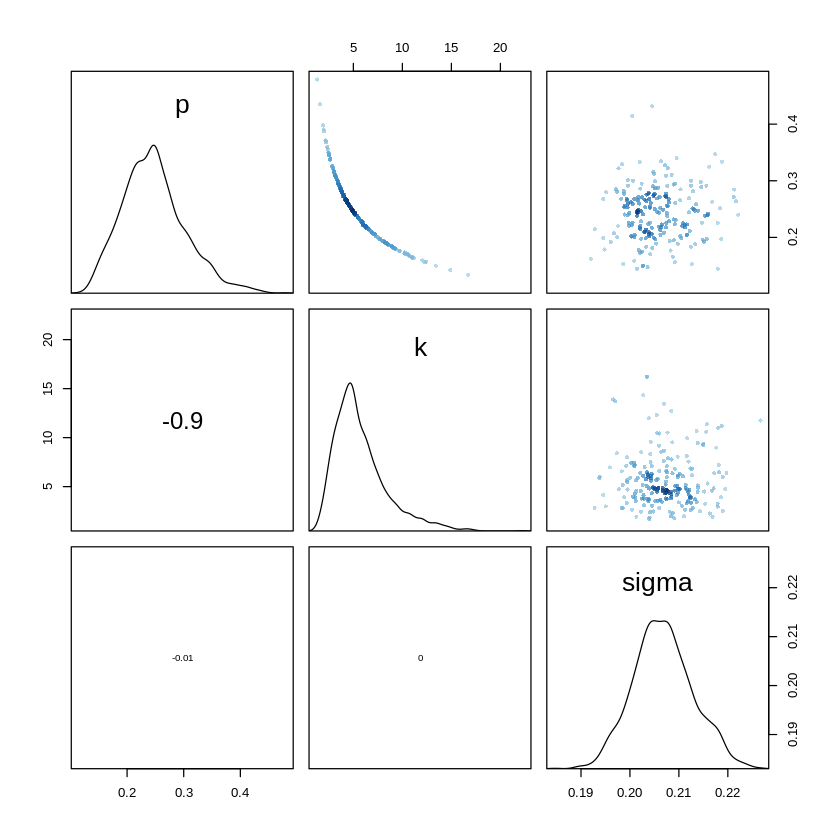

In [4]:
pairs(m16.1)

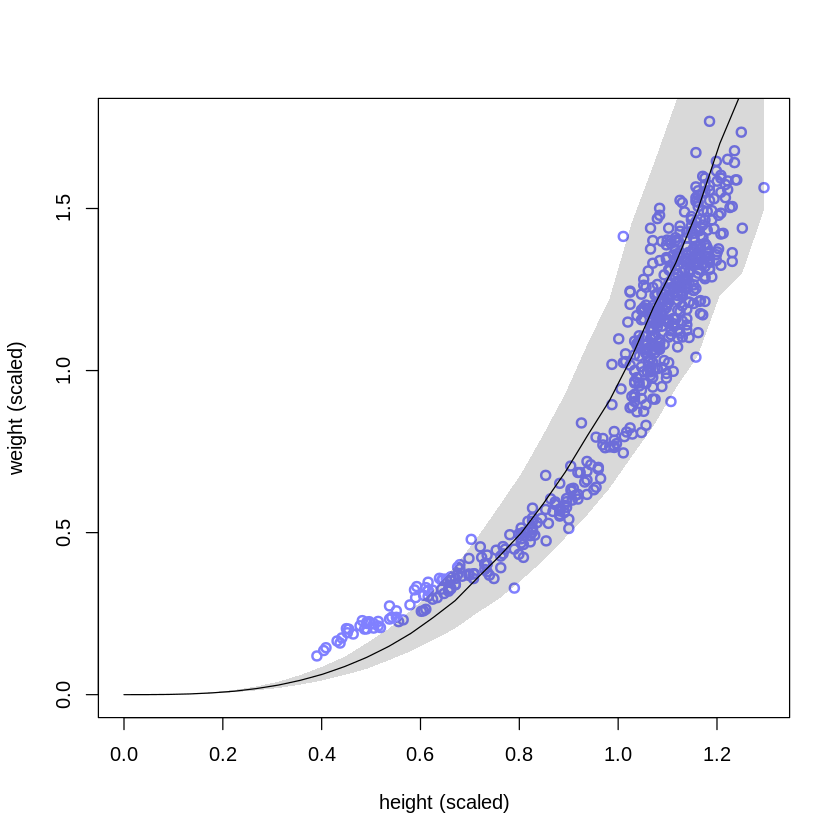

In [5]:
h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16.1 , data=list(h=h_seq) )
mu_mean <- apply( w_sim , 2 , mean )
w_CI <- apply( w_sim , 2 , PI )
plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 , lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
lines( h_seq , mu_mean )
shade( w_CI , h_seq )

In [6]:
library(rethinking)
data(Boxes)
precis(Boxes)

,mean,sd,5.5%,94.5%,histogram
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
y,2.1208267,0.7279860,1,3,▃▁▁▁▇▁▁▁▁▅
gender,1.5055644,0.5003669,1,2,▇▁▁▁▁▁▁▁▁▇
age,8.0302067,2.4979055,5,13,▇▃▅▃▃▃▂▂▂▁
majority_first,0.4848967,0.5001696,0,1,▇▁▁▁▁▁▁▁▁▇
culture,3.7519873,1.9603189,1,8,▃▂▁▇▁▂▁▂▁▂▁▁▁▁


In [7]:
head(Boxes)

y,gender,age,majority_first,culture
<int>,<int>,<int>,<int>,<int>
1,1,6,0,2
3,1,8,0,2
2,2,8,1,2
1,1,6,0,2
2,1,5,1,2
2,2,7,1,2


In [8]:
table( Boxes$y ) / length( Boxes$y )


        1         2         3 
0.2114467 0.4562798 0.3322734 

In [9]:
set.seed(7)
N <- 30 # number of children
# half are random
# sample from 1,2,3 at random for each
y1 <- sample( 1:3 , size=N/2 , replace=TRUE )
# half follow majority
y2 <- rep( 2 , N/2 )
# combine and shuffle y1 and y2
y <- sample( c(y1,y2) )
# count the 2s
sum(y==2)/N

[1] 0.7333333

In [10]:
num <- 5

library(gtools)
set.seed(1805)
delta <- rdirichlet( 10 , alpha=rep(4,num) )
str(delta)


Attaching package: ‘gtools’

The following object is masked from ‘package:rethinking’:

    logit



 num [1:10, 1:5] 0.188 0.205 0.194 0.385 0.253 ...


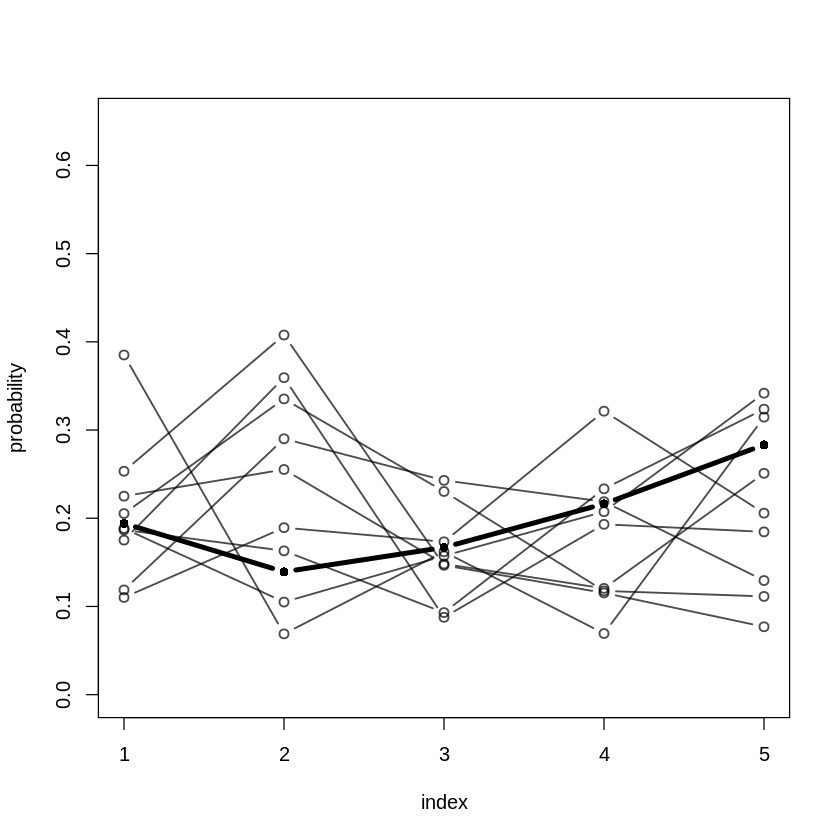

In [11]:
h <- 3
plot( NULL , xlim=c(1,num) , ylim=c(0,0.65) , xlab="index" , ylab="probability" )
for ( i in 1:nrow(delta) ) lines( 1:num , delta[i,] , type="b" ,
pch=ifelse(i==h,16,1) , lwd=ifelse(i==h,4,1.5) ,
col=ifelse(i==h,"black",col.alpha("black",0.7)) )

In [12]:
?cat

In [13]:
data(Boxes_model)
cat(Boxes_model)


data{
    int N;
    int y[N];
    int majority_first[N];
}
parameters{
    simplex[5] p;
}
model{
    vector[5] phi;
    
    // prior
    p ~ dirichlet( rep_vector(4,5) );
    
    // probability of data
    for ( i in 1:N ) {
        if ( y[i]==2 ) phi[1]=1; else phi[1]=0; // majority
        if ( y[i]==3 ) phi[2]=1; else phi[2]=0; // minority
        if ( y[i]==1 ) phi[3]=1; else phi[3]=0; // maverick
        phi[4]=1.0/3.0;                         // random
        if ( majority_first[i]==1 )             // follow first
            if ( y[i]==2 ) phi[5]=1; else phi[5]=0;
        else
            if ( y[i]==3 ) phi[5]=1; else phi[5]=0;
        
        // compute log( p_s * Pr(y_i|s )
        for ( j in 1:5 ) phi[j] = log(p[j]) + log(phi[j]);
        // compute average log-probability of y_i
        target += log_sum_exp( phi );
    }
}


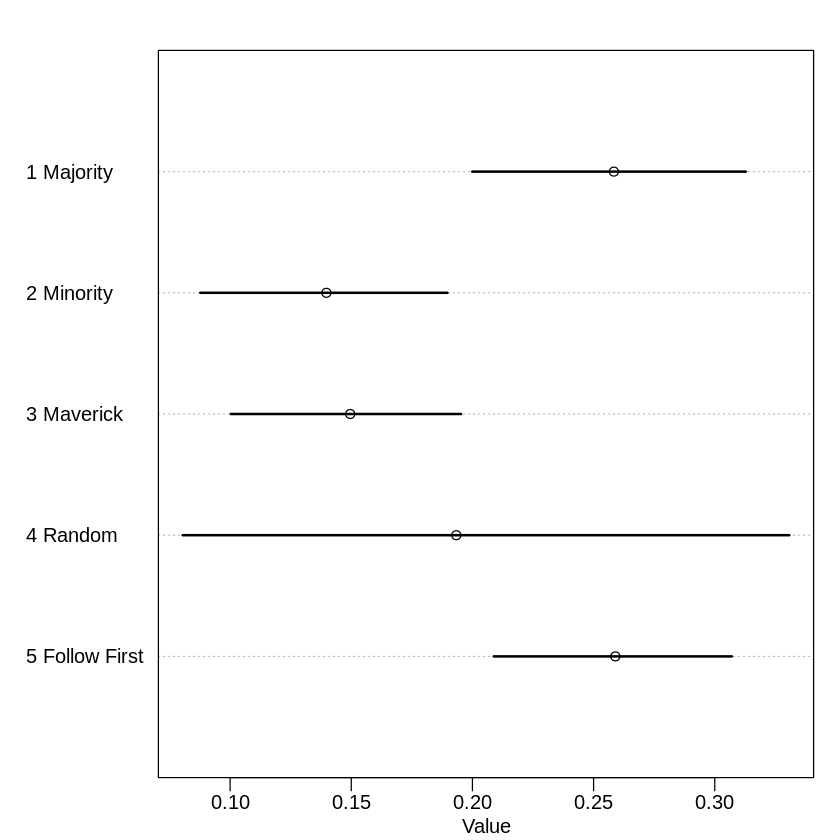

In [14]:
# prep data
dat_list <- list(
                N = nrow(Boxes),
                y = Boxes$y,
                majority_first = Boxes$majority_first )

# run the sampler
m16.2 <- stan( model_code=Boxes_model , data=dat_list , chains=3 , cores=3 )

# show marginal posterior for p
p_labels <- c("1 Majority","2 Minority","3 Maverick","4 Random","5 Follow First")
plot( precis(m16.2,2) , labels=p_labels )

In [15]:
precis(m16.2, depth=2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p[1],0.2583768,0.03555883,0.19992236,0.3128375,831.2261,1.007090
p[2],0.1397308,0.03173917,0.08770612,0.1896970,872.7352,1.005223
p[3],0.1495648,0.02975482,0.10030885,0.1952830,774.9712,1.007487
p[4],0.1933485,0.07759016,0.08042470,0.3307745,623.5774,1.009385
p[5],0.2589792,0.03080248,0.20878582,0.3070378,2877.7486,1.000276


In [16]:
data(Boxes_model_gender)

Warning message in data(Boxes_model_gender):
“data set ‘Boxes_model_gender’ not found”

In [17]:
data(Boxes_model_age)

Warning message in data(Boxes_model_age):
“data set ‘Boxes_model_age’ not found”

In [18]:
library(rethinking)
data(Panda_nuts)
head(Panda_nuts)

chimpanzee,age,sex,hammer,nuts_opened,seconds,help
<int>,<int>,<fct>,<fct>,<int>,<dbl>,<fct>
11,3,m,G,0,61,N
11,3,m,G,0,37,N
18,4,f,wood,0,20,N
18,4,f,G,0,14,y
18,4,f,L,0,13,N
11,4,m,Q,0,24,N


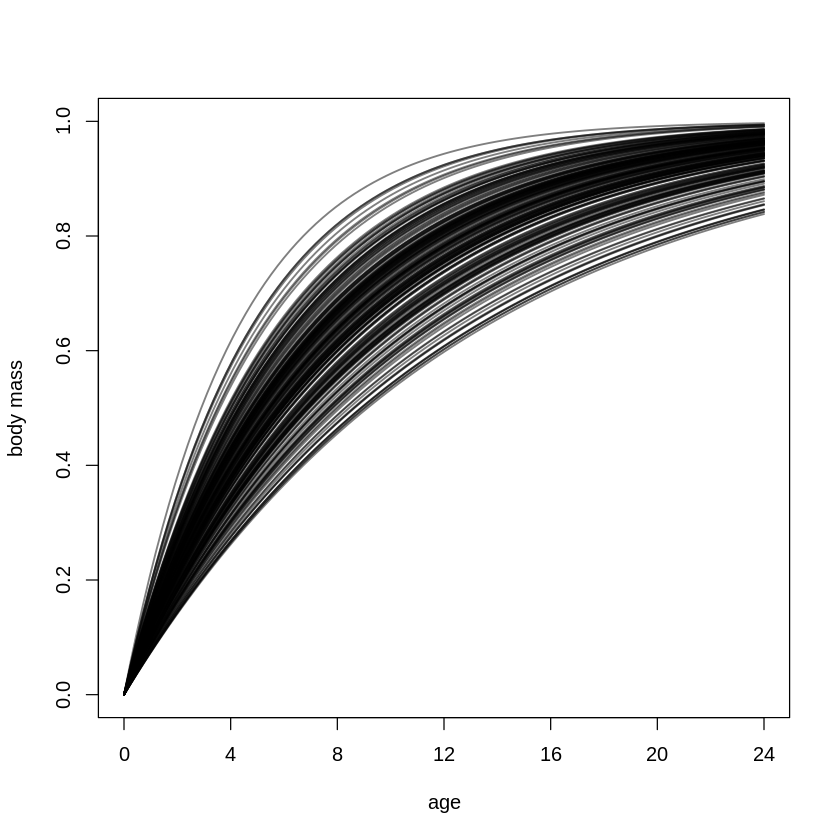

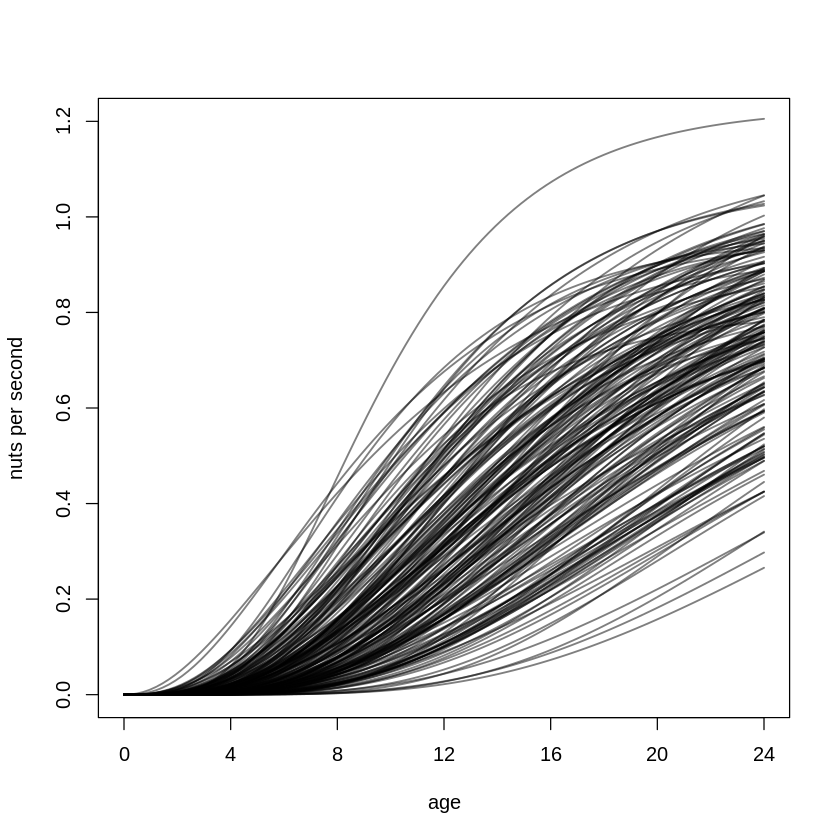

In [19]:
N <- 1e4
phi <- rlnorm( N , log(1) , 0.1 )
k <- rlnorm( N , log(2), 0.25 )
theta <- rlnorm( N , log(5) , 0.25 )

# relative grow curve
plot( NULL , xlim=c(0,1.5) , ylim=c(0,1) , xaxt="n" , xlab="age" ,
ylab="body mass" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
for ( i in 1:200 ) curve( (1-exp(-k[i]*x)) , add=TRUE , col=grau() , lwd=1.5 )

# implied rate of nut opening curve
plot( NULL , xlim=c(0,1.5) , ylim=c(0,1.2) , xaxt="n" , xlab="age" ,
ylab="nuts per second" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
for ( i in 1:200 ) curve( phi[i]*(1-exp(-k[i]*x))^theta[i] , add=TRUE ,
col=grau() , lwd=1.5 )

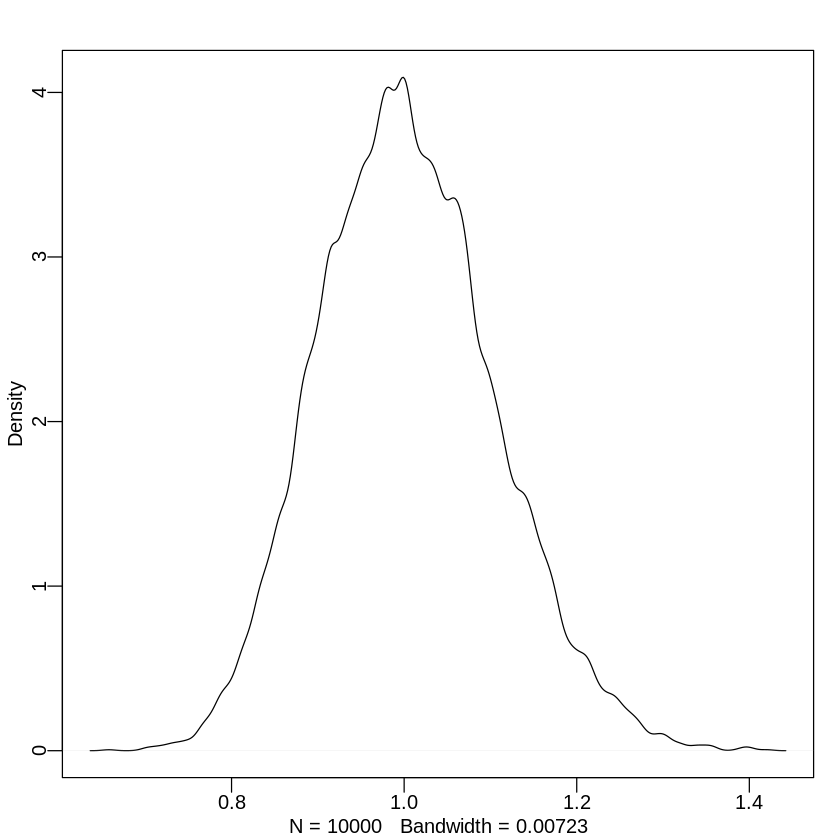

In [20]:
dens(phi)

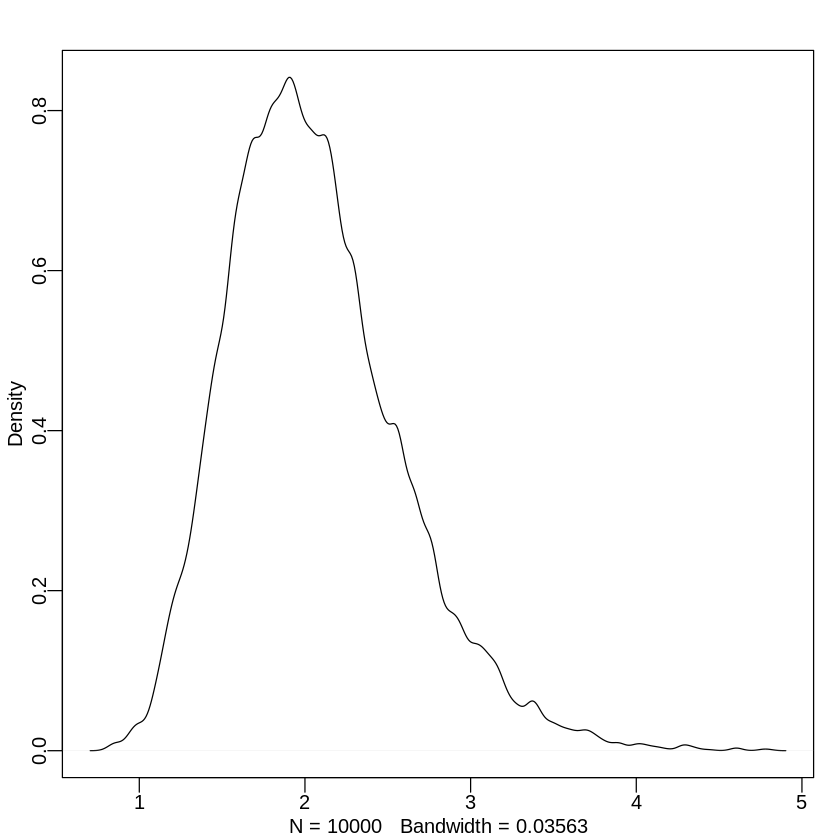

In [21]:
dens(k)

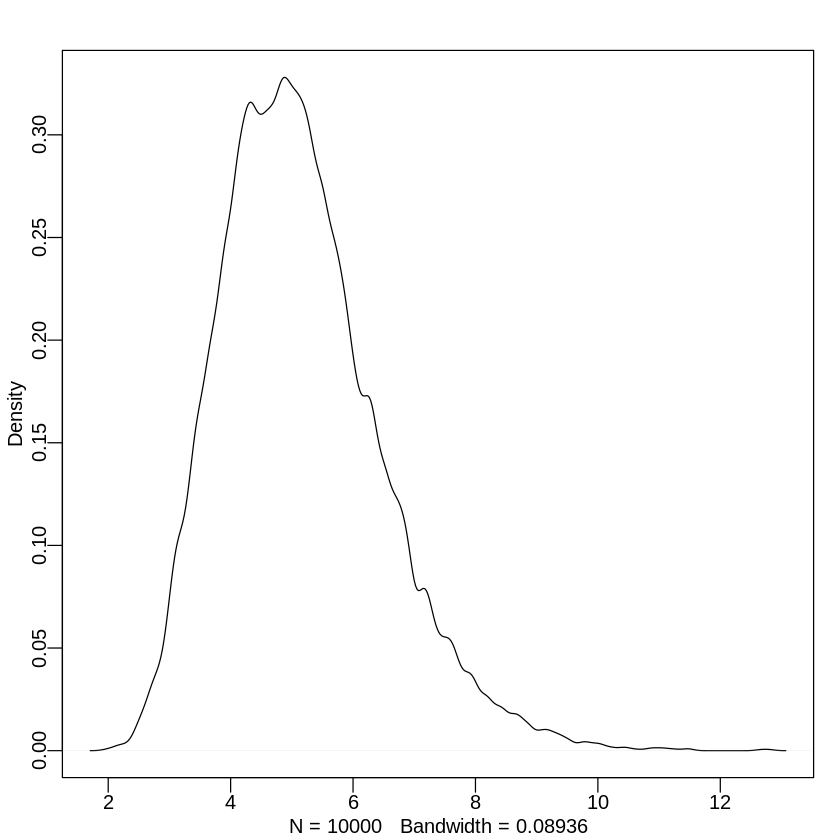

In [22]:
dens(theta)

In [73]:
dat_list <- list(
                n = as.integer( Panda_nuts$nuts_opened ),
                age = Panda_nuts$age / max(Panda_nuts$age),
                seconds = Panda_nuts$seconds )

m16.4 <- ulam(
            alist(
                n ~ poisson( lambda ),
                lambda <- seconds*phi*(1-exp(-k*age))^theta,
                phi ~ lognormal( log(1) , 0.1 ),
                k ~ lognormal( log(2) , 0.25 ),
                theta ~ lognormal( log(5) , 0.25 )
            ), data=dat_list , chains=4, cores=4
            , log_lik=TRUE, iter=4000
            )

recompiling to avoid crashing R session


In [74]:
precis(m16.4)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi,0.8680025,0.0408919,0.8055999,0.9352304,2540.475,1.001652
k,5.9316360,0.5702760,5.0066582,6.8688602,2292.099,1.000623
theta,9.7131188,2.0425713,6.7947866,13.3370758,2418.657,1.000530


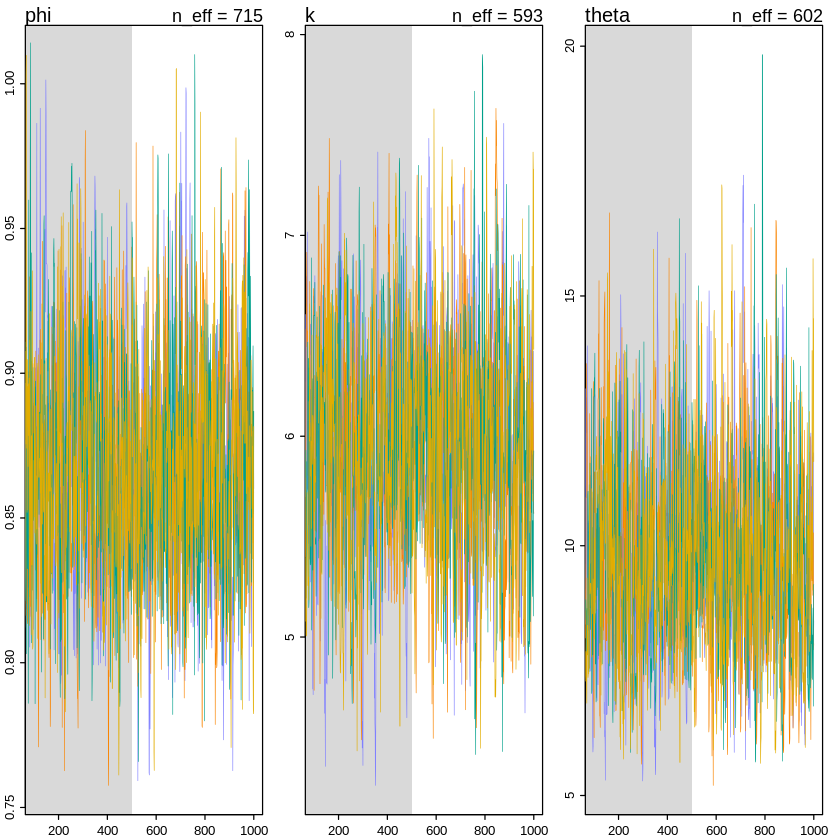

In [25]:
traceplot(m16.4)

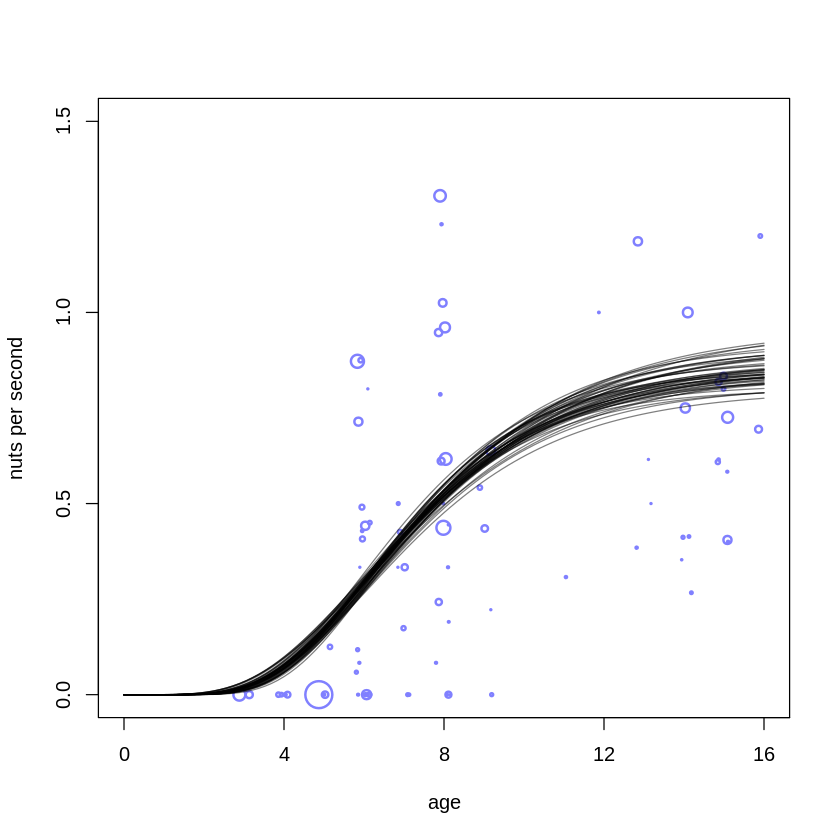

In [26]:
post <- extract.samples(m16.4)
plot( NULL , xlim=c(0,1) , ylim=c(0,1.5) , xlab="age" ,
ylab="nuts per second" , xaxt="n" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )

# raw data
pts <- dat_list$n / dat_list$seconds
point_size <- normalize( dat_list$seconds )
points( jitter(dat_list$age) , pts , col=rangi2 , lwd=2 , cex=point_size*3 )

# 30 posterior curves
for ( i in 1:50 ) with( post ,
curve( phi[i]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=grau() ) )

In [2]:
library(rethinking)
data(Lynx_Hare)
head(Lynx_Hare)

Year,Lynx,Hare
<int>,<dbl>,<dbl>
1900,4.0,30.0
1901,6.1,47.2
1902,9.8,70.2
1903,35.2,77.4
1904,59.4,36.3
1905,41.7,20.6


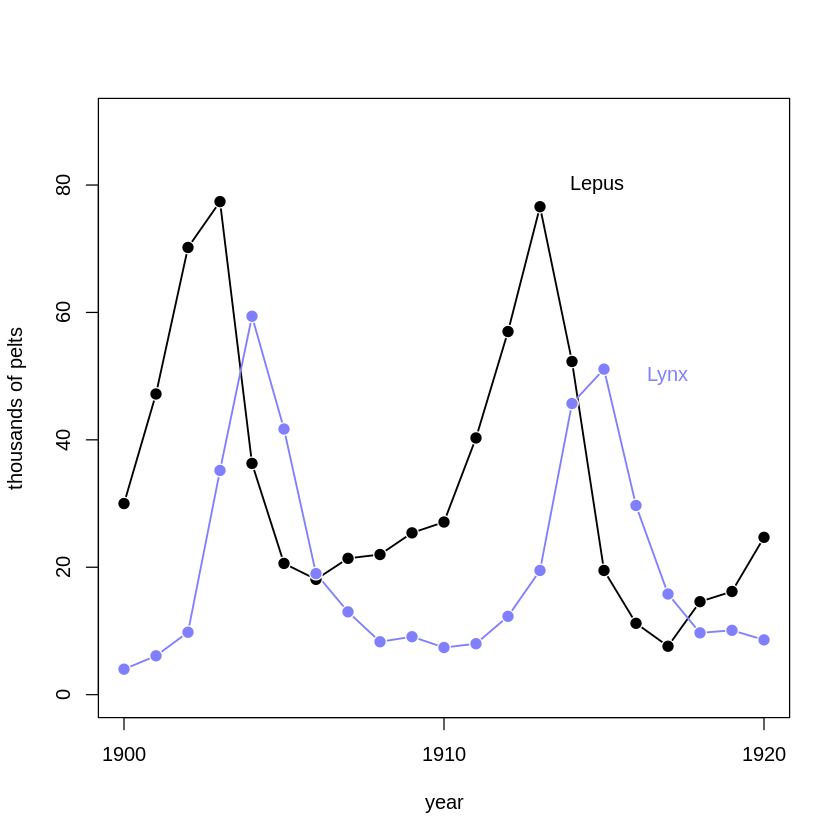

In [28]:
plot( 1:21 , Lynx_Hare[,3] , ylim=c(0,90) , xlab="year" ,
ylab="thousands of pelts" , xaxt="n" , type="l" , lwd=1.5 )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
lines( 1:21 , Lynx_Hare[,2] , lwd=1.5 , col=rangi2 )
points( 1:21 , Lynx_Hare[,3] , bg="black" , col="white" , pch=21 , cex=1.4 )
points( 1:21 , Lynx_Hare[,2] , bg=rangi2 , col="white" , pch=21 , cex=1.4 )
text( 17 , 80 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

In [124]:
sim_lynx_hare <- function( n_steps , init , theta , dt=0.002 ) {
                        L <- rep(NA,n_steps)
                        H <- rep(NA,n_steps)
                        L[1] <- init[1]
                        H[1] <- init[2]
                        for ( i in 2:n_steps ) {
                            H[i] <- H[i-1] + dt*H[i-1]*( theta[1] - theta[2]*L[i-1] )
                            L[i] <- L[i-1] + dt*L[i-1]*( theta[3]*H[i-1] - theta[4] )
                        }
                        return( cbind(L,H) )
                  }

In [129]:
theta <- c( 0.5 , 0.05 , 0.025 , 0.5 )
z <- sim_lynx_hare( 1e4 , as.numeric(Lynx_Hare[1,2:3]) , theta )

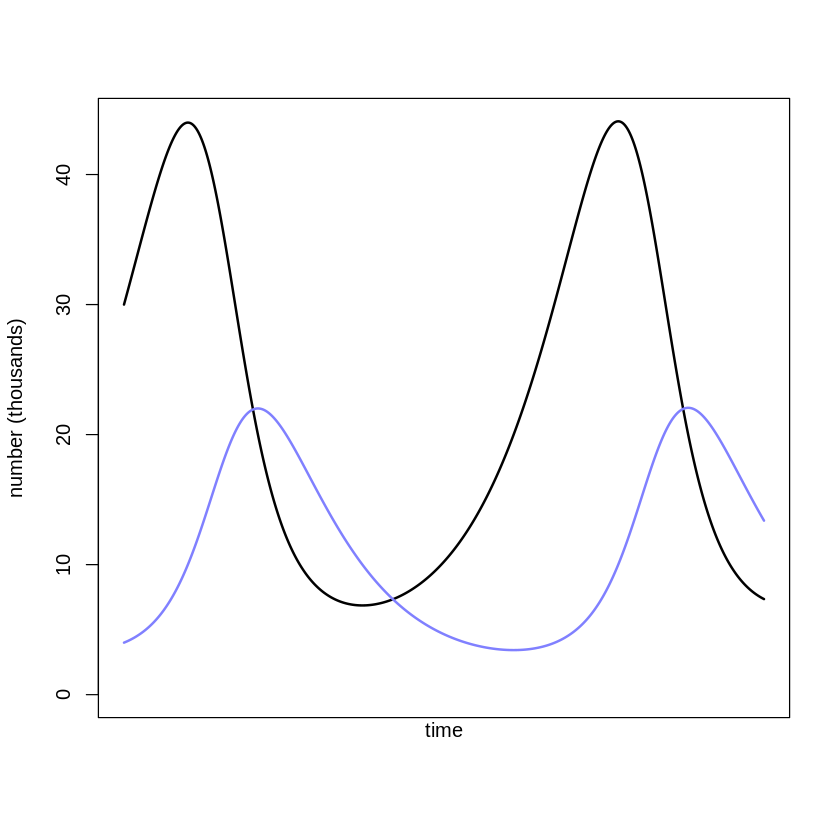

In [130]:
plot( z[,2] , type="l" , ylim=c(0,max(z[,2])) , lwd=2 , xaxt="n" , ylab="number (thousands)" , xlab="" )
lines( z[,1] , col=rangi2 , lwd=2 )
mtext( "time" , 1 )

In [33]:
x.seq <- seq(0,1,by=0.01)

q <- dbeta(x.seq,2,18)
mean(q*x.seq)


[1] 0.09900942

So mean of Beta(2,18) distribution is almost 10%.

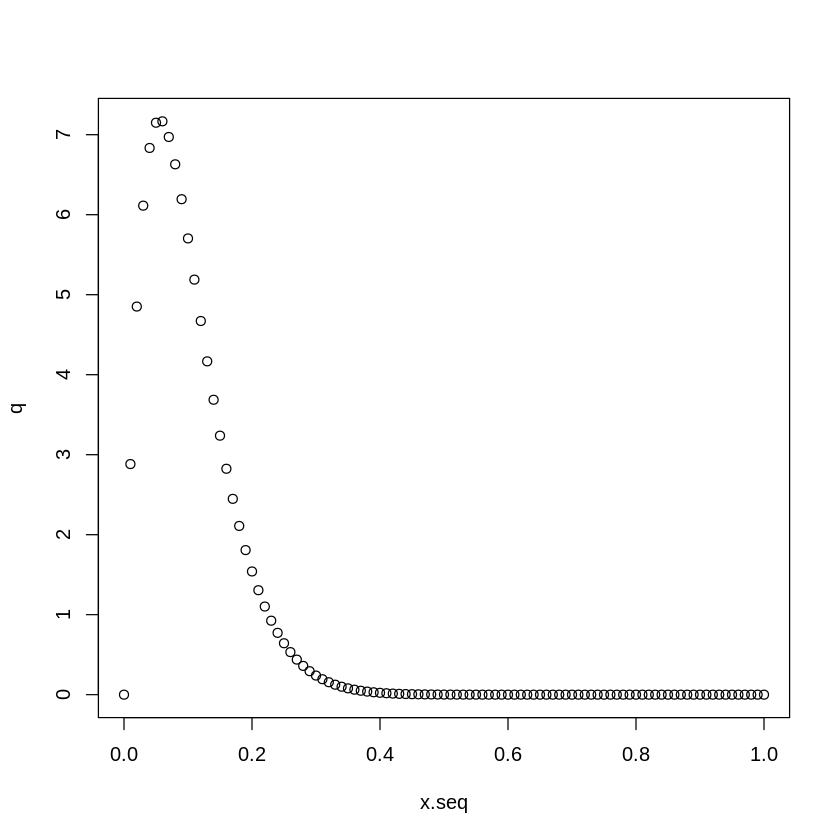

In [34]:
plot(x.seq, q)

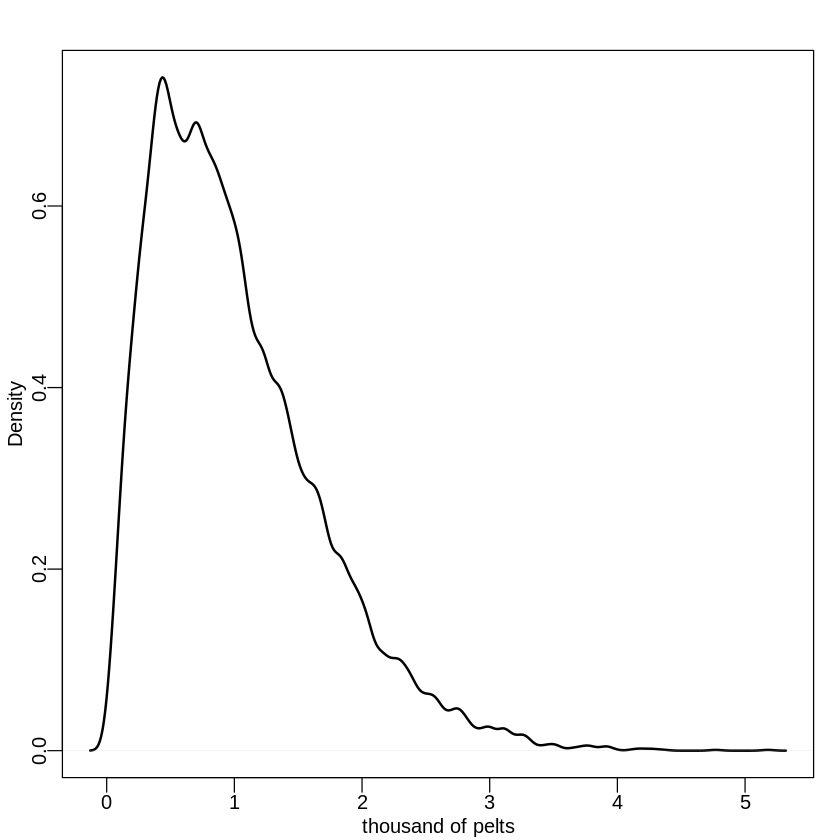

In [35]:
N <- 1e4
Ht <- 1e4
p <- rbeta(N,2,18)
h <- rbinom( N , size=Ht , prob=p )
h <- round( h/1000 , 2 )
dens( h , xlab="thousand of pelts" , lwd=2 )

In [23]:
library(rethinking)
data(Lynx_Hare)
data(Lynx_Hare_model)
cat(Lynx_Hare_model)

functions {
  real[] dpop_dt( real t,                 // time
                real[] pop_init,          // initial state {lynx, hares}
                real[] theta,             // parameters
                real[] x_r, int[] x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  real<lower=0> pelts[N,2];    // measured populations
}
transformed data{
  real times_measured[N-1];    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  real<lower=0> theta[4];      // { bh, mh, ml, bl }
  real<lower=0> pop_init[2];   // initial population state
  real<lower=0> sigma[2];      // measurement errors
  real<lower=0,upper=1> p[2];

In [24]:
dat_list <- list(
                N = nrow(Lynx_Hare),
                pelts = Lynx_Hare[,2:3] )

m16.5 <- stan( model_code=Lynx_Hare_model , data=dat_list , chains=3 , cores=3 , control=list( adapt_delta=0.95) )

'pars' not specified. Showing first 10 parameters by default.


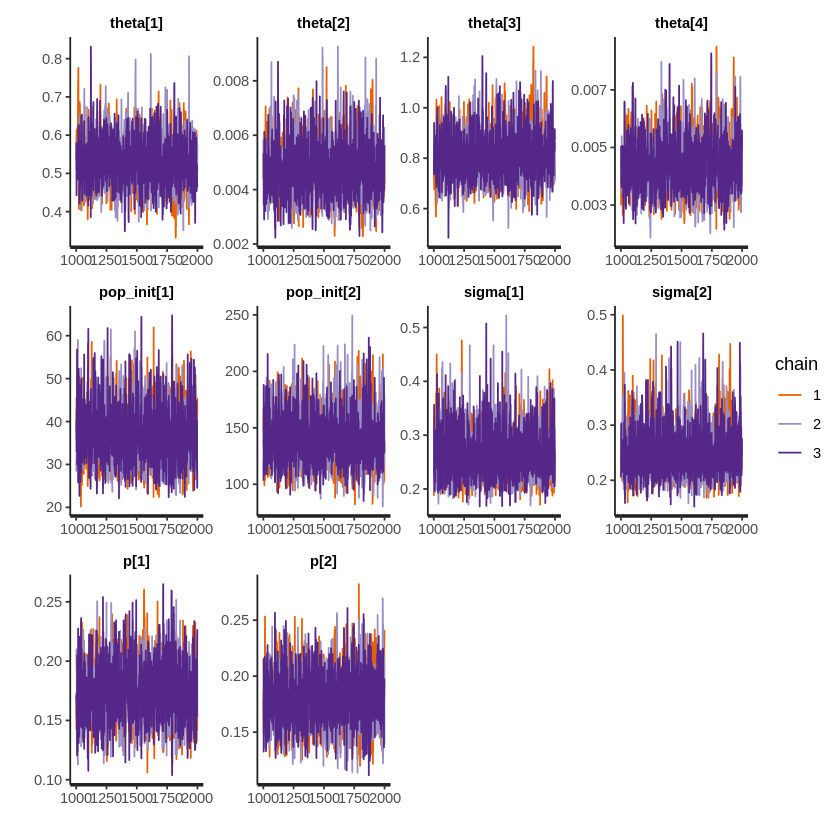

In [43]:
traceplot(m16.5)

In [50]:
precis(m16.5, 3)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
theta[1],5.293527e-01,6.315200e-02,4.341665e-01,0.63647532,1266.830,1.0029476
theta[2],4.696552e-03,9.994656e-04,3.292620e-03,0.00643231,1376.015,1.0002148
theta[3],8.127344e-01,9.452263e-02,6.672944e-01,0.97117872,1303.109,1.0027148
theta[4],4.361394e-03,9.108481e-04,3.031162e-03,0.00593577,1310.764,1.0022219
pop_init[1],3.695115e+01,6.419483e+00,2.749756e+01,48.29201698,1699.477,1.0001596
pop_init[2],1.411676e+02,2.289791e+01,1.080692e+02,180.86510749,1809.094,1.0011086
sigma[1],2.647383e-01,4.613355e-02,2.023142e-01,0.34460434,2334.018,0.9994600
sigma[2],2.524555e-01,4.456383e-02,1.941176e-01,0.32887073,1852.479,0.9997996
p[1],1.735747e-01,2.395931e-02,1.369192e-01,0.21344240,1745.225,0.9996195


In [51]:
Lynx_Hare

Year,Lynx,Hare
<int>,<dbl>,<dbl>
1900,4.0,30.0
1901,6.1,47.2
1902,9.8,70.2
1903,35.2,77.4
1904,59.4,36.3
1905,41.7,20.6
1906,19.0,18.1
1907,13.0,21.4
1908,8.3,22.0


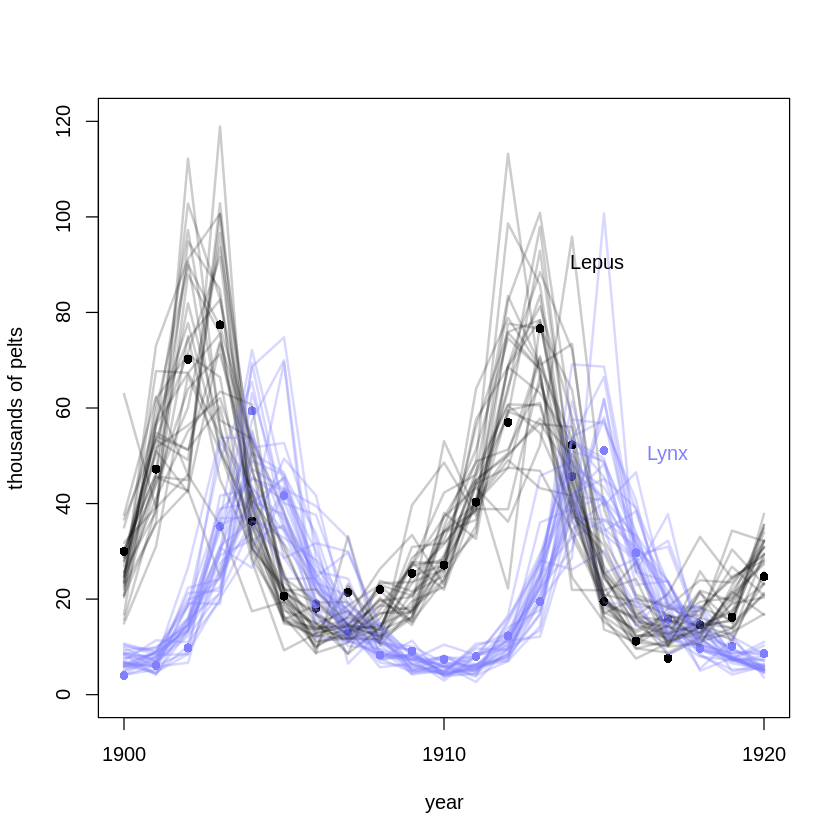

In [56]:
post <- extract.samples(m16.5)
pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:30 ) {
    lines( 1:21 , post$pelts_pred[s,,2] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:21 , post$pelts_pred[s,,1] , col=col.alpha(rangi2,0.3) , lwd=2 )
}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

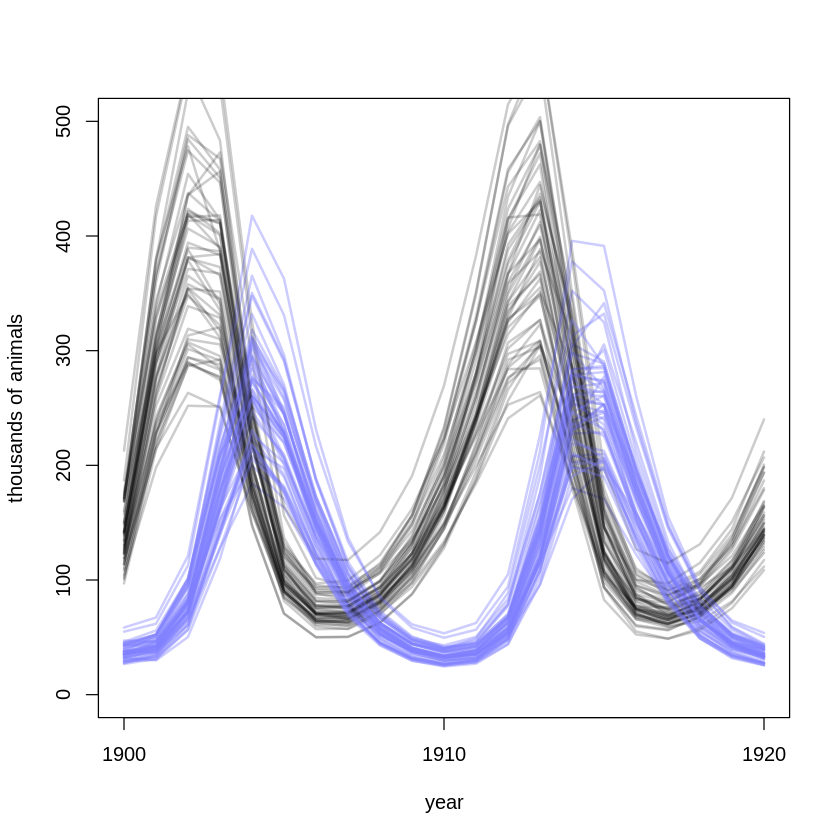

In [61]:
plot( NULL , pch=16 , xlim=c(1,21) , ylim=c(0,500) , xlab="year" ,
    ylab="thousands of animals" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
for ( s in 1:50 ) {
    lines( 1:21 , post$pop[s,,2] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:21 , post$pop[s,,1] , col=col.alpha(rangi2,0.4) , lwd=2 )
}

PRACTICE

16M1

In [1]:
library(rethinking)
options(mc.cores = parallel::detectCores())
data(Howell1)
d <- Howell1

# scale observed variables
d$w <- d$weight / mean(d$weight)
d$h <- d$height / mean(d$height)

Loading required package: rstan
Loading required package: ggplot2
Loading required package: StanHeaders
rstan (Version 2.18.2, GitRev: 2e1f913d3ca3)
For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)
Loading required package: parallel
rethinking (Version 1.88)


In [19]:
m16m1 <- ulam(
                alist(
                    w ~ dlnorm( mu , sigma ),
                    mu <- log(3.141593 * k * p^2 * h^s),
                    p ~ beta( 2 , 18 ),
                    k ~ exponential( 0.5 ),
                    s ~ dlnorm(3, 1),
                    sigma ~ exponential( 1 )
                ), data=d , chains=4 , cores=4
                , log_lik=TRUE
                )

Warning message:
“There were 1 transitions after warmup that exceeded the maximum treedepth. Increase max_treedepth above 10. See
http://mc-stan.org/misc/warnings.html#maximum-treedepth-exceeded”Warning message:
“Examine the pairs() plot to diagnose sampling problems
”

In [20]:
precis(m16m1)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2474899,0.05780581,0.1664996,0.3526803,665.1614,1.010771
k,5.6655724,2.67839753,2.3731739,10.6838692,712.6060,1.008027
s,2.3251154,0.02308290,2.2889846,2.3627275,1195.1114,1.002036
sigma,0.1262938,0.00377528,0.1204965,0.1324396,1070.4780,1.000400


Compare with fixed exponent model:

In [25]:
precis(m16.1)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2492784,0.059578374,0.1669559,0.3539750,455.0396,1.001068
k,5.7256500,2.742981689,2.4051589,10.7984640,470.3048,1.002981
sigma,0.2069270,0.006722424,0.1962012,0.2176472,695.1177,1.001053


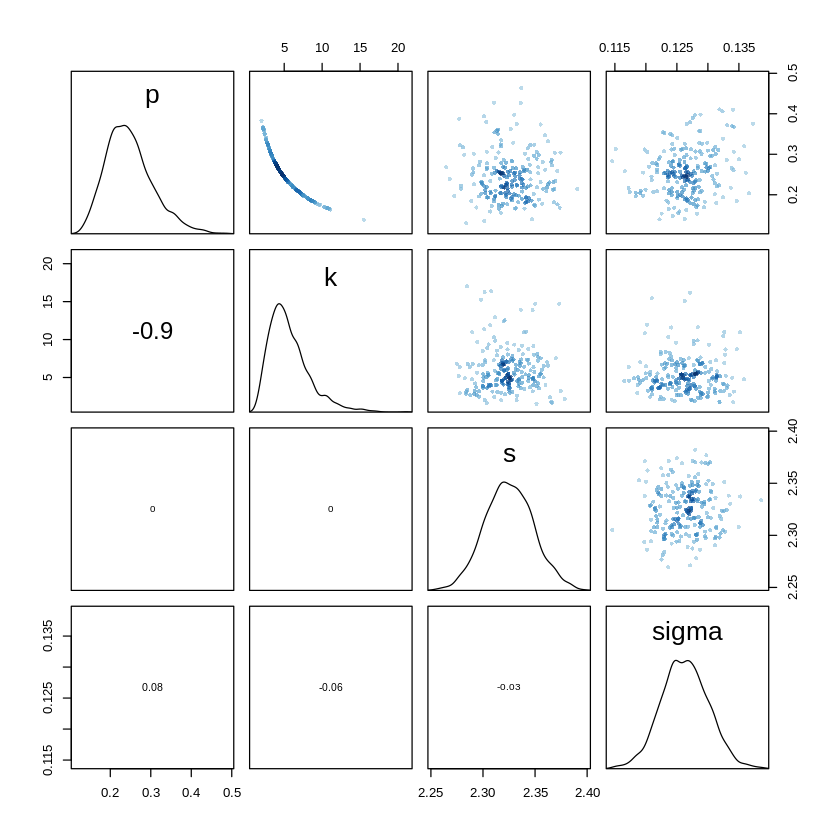

In [21]:
pairs(m16m1)

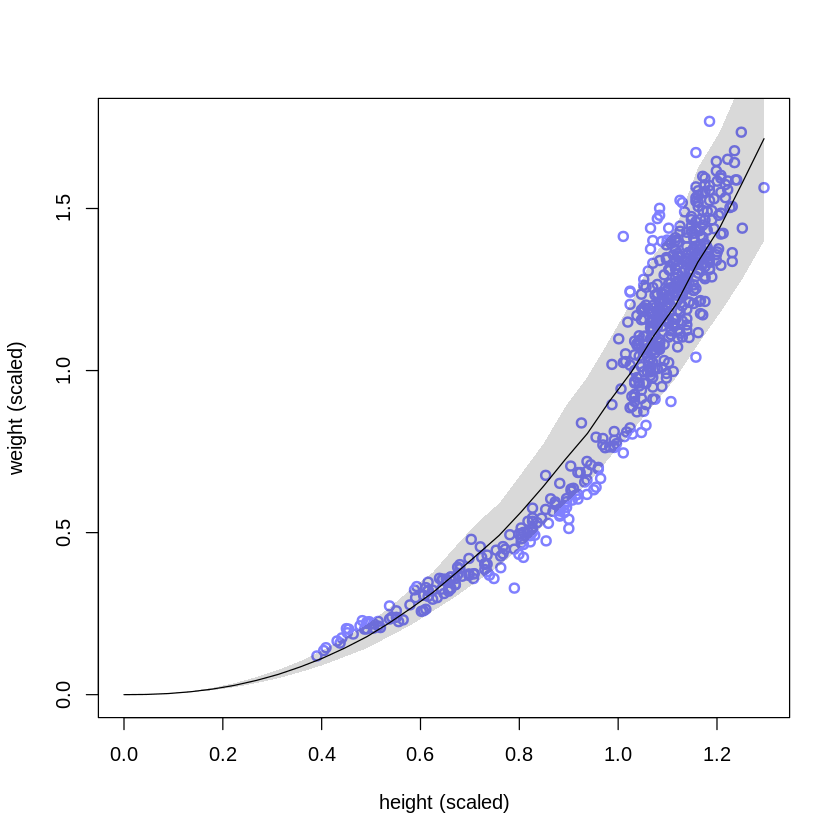

In [22]:
h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16m1 , data=list(h=h_seq) )
mu_mean <- apply( w_sim , 2 , mean )
w_CI <- apply( w_sim , 2 , PI )
plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
lines( h_seq , mu_mean )
shade( w_CI , h_seq )

We do not recover the exponent of 3, but rather get something between 2.3 and 2.4.  This is because the extra free parameter allows a closer fit of the model to the data, and weight probably experiences fractal scaling (real, not integer exponents) because bodies are not perfect platonic solids / geometric shapes. 

The new posterior predictive predictions make more of a compromise by better fitting the smaller (younger) people, but overestimating the weight of the medium height people and, in comparison to the model m16.1 underestimating the tallest people, though it fits these tall people data points well.

There are potentially several factors in play such as the scaling of a person's width (and hence volume and thus weight) with height and differences in density of body parts (tall people need to have taller skeletons, hence more bone; if this doesn't scale linearly with other body parts such as organs) that may mean that the true scaling exponent really isn't 3 (people are not 'Vitruvian cans'!).

Out of interst, we compare the WAIC / LOO scores below.

In [23]:
compare(m16.1, m16m1)

,WAIC,pWAIC,dWAIC,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16m1,-845.4830,3.550270,0.000,1.000000e+00,36.84282,NA
m16.1,-309.5559,4.358247,535.927,4.216206e-117,44.31407,54.58123


In [24]:
compare(m16.1, m16m1, func=LOO)

,LOO,pLOO,dLOO,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16m1,-845.4689,3.557310,0.0000,1.000000e+00,36.87721,NA
m16.1,-309.5163,4.378049,535.9526,4.162742e-117,44.36259,54.58763


Using the extra free parameter for the scaling exponent leads to a better fit and much better generalisation as measured by both WAIC and LOO measures, suggesting indeed that weight doesn't scale with height with an integer scaling exponent.

Interestingly, even though we added an extra free parameter, the effective number of parameters (pWAIC / pLOO) is lower, meaning that the non-linearity of the model doesn't lead to complete freedom for the extra parameter.  Allowing the free parameter of exponent enables the magnitude of sigma to be smaller and more certain (the sd of sigma is smaller too), demonstrating that the addition of the free parameter strengthens the estimates.

16M2


SAMPLING FOR MODEL 'd50751029317bdd6972284044d3d5378' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000127 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 1.27 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.840948 seconds (Warm-up)
Chain 1:                1.22995 seconds (Sampling)


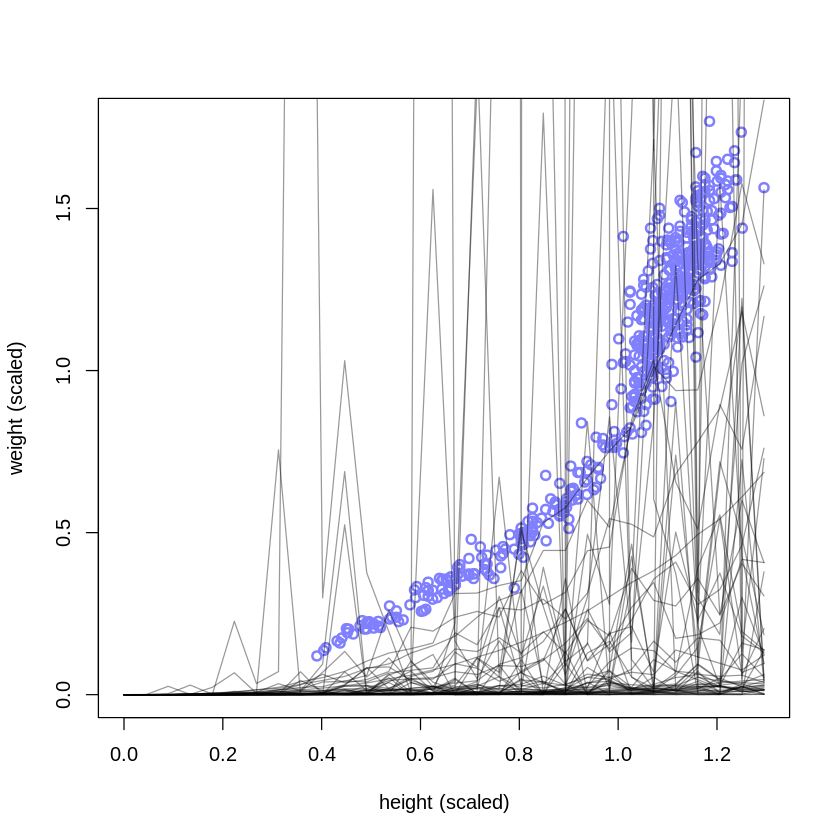

In [8]:
prior <- extract.prior(m16.1)

# h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
# w_sim <- sim( m16.1 , post=prior, data=list(h=h_seq), chains=4, cores=4)
# mu_mean <- apply( w_sim , 2 , mean )
# w_CI <- apply( w_sim , 2 , PI )
# plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
# lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
# lines( h_seq , mu_mean )
# shade( w_CI , h_seq )


h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16.1updateP , post=prior, data=list(h=h_seq), chains=4, cores=4)

plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
    lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
for ( i in 1:50 ) lines( h_seq, w_sim[i,], col=col.alpha("black",0.4) )

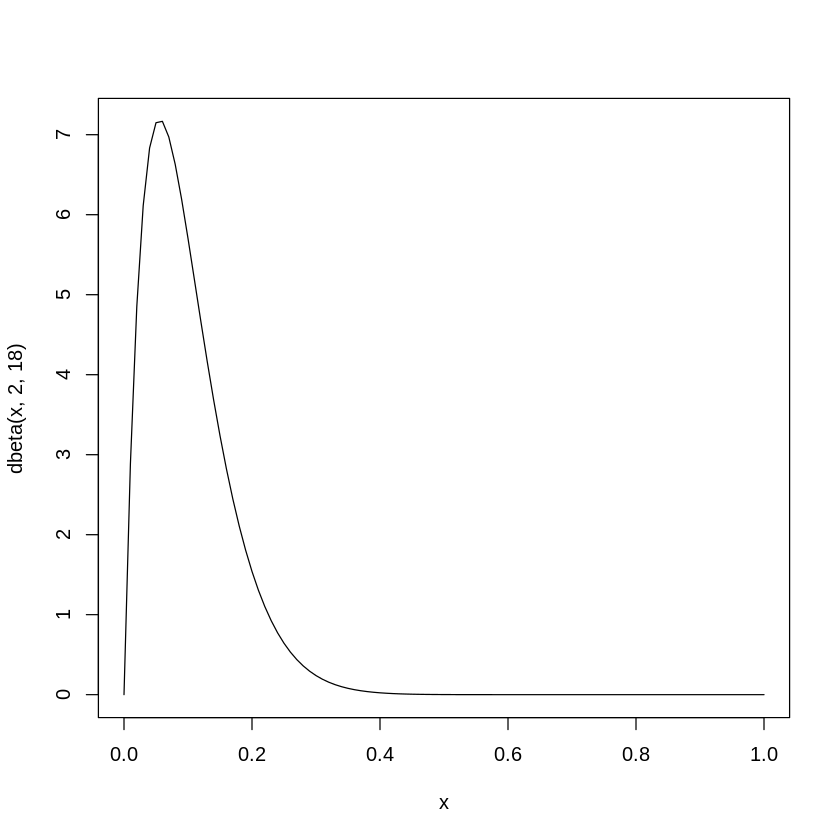

In [2]:
# p ~ beta( 2 , 18 ),
curve( dbeta( x , 2 , 18 ) , from=0 , to=1 )

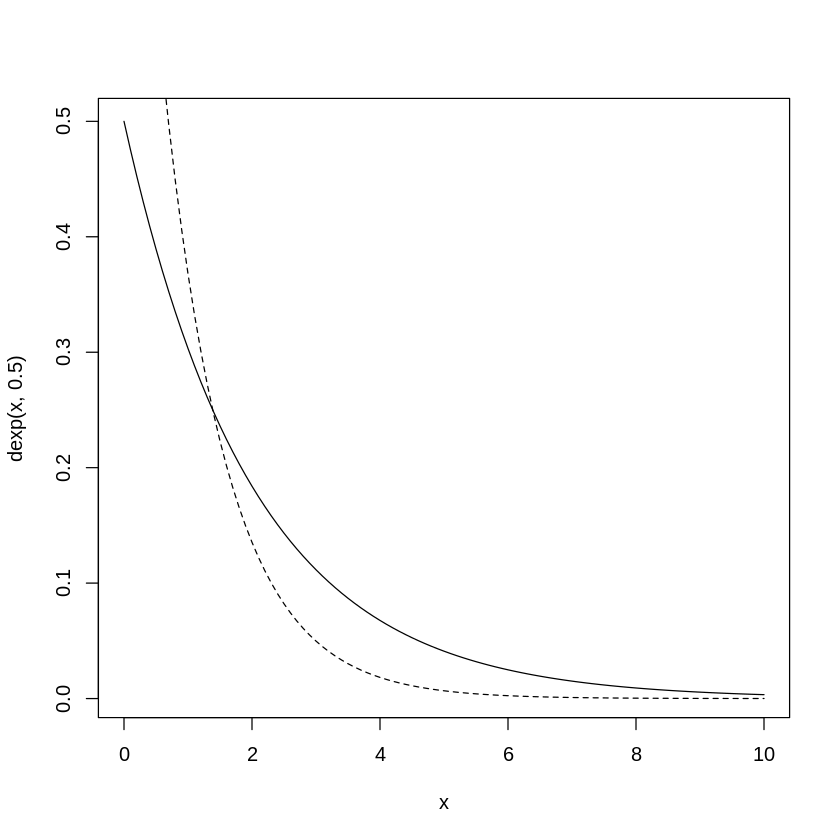

In [30]:
# k ~ exponential( 0.5 ),
# sigma ~ exponential( 1 )

curve( dexp( x , 0.5 ) , from=0 , to=10 )

curve( dexp( x , 1 ) , lty=2 , add=TRUE )

It is difficult to adjust the priors too much without 'data-snooping'; it is not really appropriate to run the model first, get some estimates, and then use the estimates as the mean/median values to update the priors.

Also, because the data are normalized, it makes it more difficult to use intuition to guess the parameters of the priors.

However, what we can demonstrate is the sensitivity of the predictions to an independent change in each prior, and see how much closer to the data we can get the prior distribution.

In [12]:
# Original Priors
# p ~ beta( 2 , 18 ),
# k ~ exponential( 0.5 ),
# sigma ~ exponential( 1 )

# We change the p parameter to a distribution that is more narrow around the previously estimated posterior for p (WARNING - data snooping in progress!!!)
m16.1updateP <- ulam(
            alist(
                w ~ dlnorm( mu , sigma ),
#                 exp(mu) <- 3.141593 * k * p^2 * h^3,   # Error in `[[<-`(`*tmp*`, left_symbol, value = list(type = left_type, dims = the_dims, : no such index at level 1
                mu <- log(3.141593 * k * p^2 * h^3),  # Need to re-write link this way to avoid error above.
                p ~ beta( 5 , 20 ),
                k ~ exponential( 0.5 ),
                sigma ~ exponential( 1 )
            ), data=d , chains=4 , cores=4
#             , log_lik=TRUE
        )

In [5]:
precis(m16.1updateP)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2832593,0.062996431,0.1937836,0.3897205,499.4939,1.000815
k,4.3472429,1.987126021,1.9715593,8.0561501,520.3638,1.000842
sigma,0.2069475,0.006228482,0.1972689,0.2172025,812.7116,1.002450



SAMPLING FOR MODEL 'c9f018c3aafc0a44478f9ddf59f7b2dd' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000121 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 1.21 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.85704 seconds (Warm-up)
Chain 1:                0.631355 seconds (Sampling)


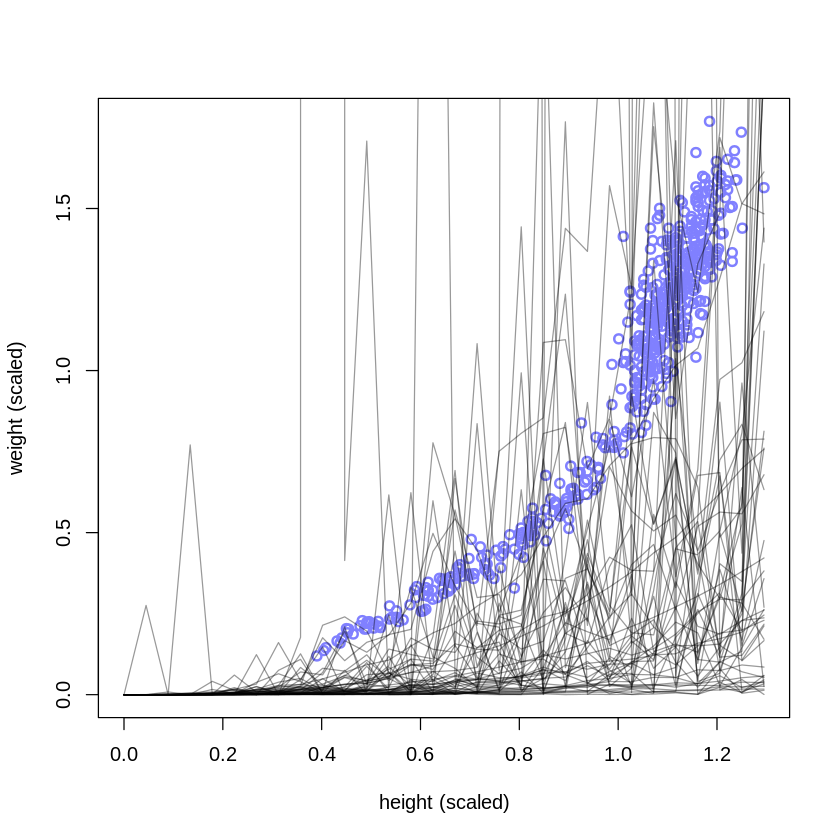

In [6]:
prior <- extract.prior(m16.1updateP)

h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16.1updateP , post=prior, data=list(h=h_seq), chains=4, cores=4)

plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
    lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
for ( i in 1:50 ) lines( h_seq, w_sim[i,], col=col.alpha("black",0.4) )

This has caused a few more lines to be around the data points, but doesn't seem an amazing improvement...

Now let's try adjusting k from 0.5 to 1/6 (which is closer to the posterior mean):

In [2]:
# Original Priors
# p ~ beta( 2 , 18 ),
# k ~ exponential( 0.5 ),
# sigma ~ exponential( 1 )

# Now let's try adjusting k from 0.5 to 1/6 (which is closer to the posterior mean):
m16.1updateK <- ulam(
            alist(
                w ~ dlnorm( mu , sigma ),
#                 exp(mu) <- 3.141593 * k * p^2 * h^3,   # Error in `[[<-`(`*tmp*`, left_symbol, value = list(type = left_type, dims = the_dims, : no such index at level 1
                mu <- log(3.141593 * k * p^2 * h^3),  # Need to re-write link this way to avoid error above.
                p ~ beta( 2 , 18 ),
                k ~ exponential( 0.17 ),
                sigma ~ exponential( 1 )
            ), data=d , chains=4 , cores=4
#             , log_lik=TRUE
        )

precis(m16.1updateK)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.1781372,0.049614341,0.1073317,0.2661366,504.6377,1.006265
k,11.8827631,6.712077615,4.2603649,26.1422079,460.9474,1.007710
sigma,0.2067354,0.006233297,0.1969782,0.2162058,577.7054,1.013884



SAMPLING FOR MODEL '36587f07a0ab0e95fd13b5a2de260121' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000112 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 1.12 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.824525 seconds (Warm-up)
Chain 1:                1.06701 seconds (Sampling)


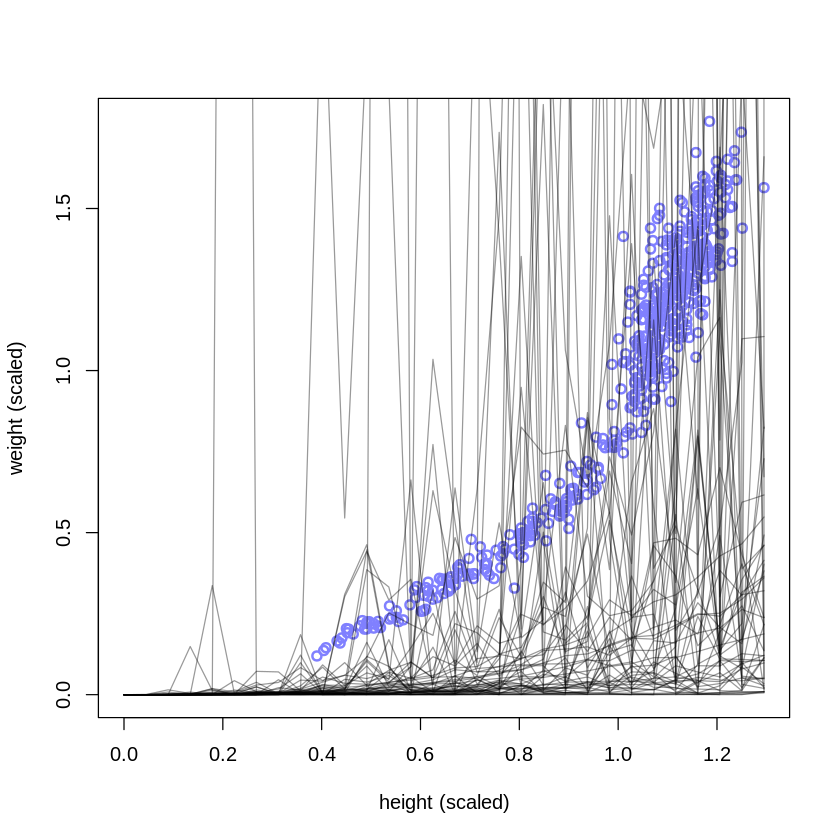

In [3]:
prior <- extract.prior(m16.1updateK)

h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16.1updateK , post=prior, data=list(h=h_seq), chains=4, cores=4)

plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
    lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
for ( i in 1:50 ) lines( h_seq, w_sim[i,], col=col.alpha("black",0.4) )

So changing the parameter in k so that the prior mean match the previous posterior mean leads to a few more lines hovering near the data than compared to changing p.

Now let's try changing the parameter of the prior distribution of sigma:

In [4]:
# Original Priors
# p ~ beta( 2 , 18 ),
# k ~ exponential( 0.5 ),
# sigma ~ exponential( 1 )

# Now let's try adjusting sigma parameter from 1 to 5 (which is closer to the posterior mean):
m16.1updateSigma <- ulam(
            alist(
                w ~ dlnorm( mu , sigma ),
#                 exp(mu) <- 3.141593 * k * p^2 * h^3,   # Error in `[[<-`(`*tmp*`, left_symbol, value = list(type = left_type, dims = the_dims, : no such index at level 1
                mu <- log(3.141593 * k * p^2 * h^3),  # Need to re-write link this way to avoid error above.
                p ~ beta( 2 , 18 ),
                k ~ exponential( 0.5 ),
                sigma ~ exponential( 5 )
            ), data=d , chains=4 , cores=4
#             , log_lik=TRUE
        )

precis(m16.1updateSigma)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2487696,0.057599417,0.1688399,0.3508421,556.0384,1.007440
k,5.6863074,2.634245898,2.4439650,10.5956425,564.0690,1.005653
sigma,0.2067934,0.006500141,0.1967805,0.2175016,638.0397,1.002496



SAMPLING FOR MODEL 'e43a9a4ddb1554b03d363f562fcababe' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000113 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 1.13 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.815825 seconds (Warm-up)
Chain 1:                0.823311 seconds (Sampling)

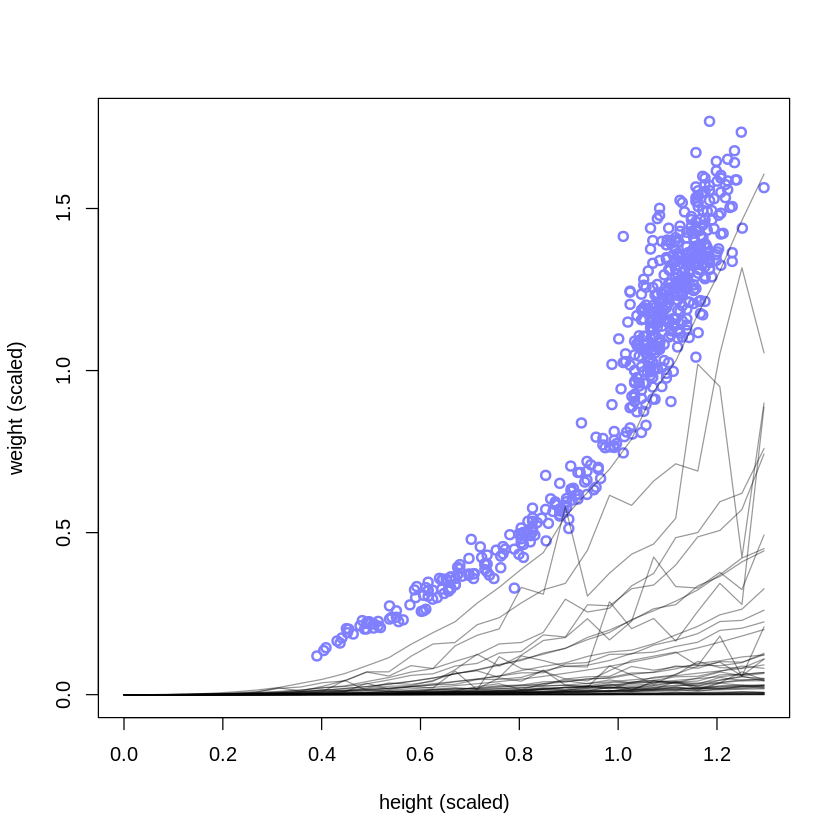

In [5]:
prior <- extract.prior(m16.1updateSigma)

h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16.1updateSigma , post=prior, data=list(h=h_seq), chains=4, cores=4)

plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
    lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
for ( i in 1:50 ) lines( h_seq, w_sim[i,], col=col.alpha("black",0.4) )

Changing the sigma parameter to match the m16.1 model (thereby reducing sigma) leads to a worse prior predictions.  Let's actually try to increase sigma to see what impact that has:

In [6]:
# Original Priors
# p ~ beta( 2 , 18 ),
# k ~ exponential( 0.5 ),
# sigma ~ exponential( 1 )

# Now let's try adjusting sigma parameter from 1 to 5 (which is closer to the posterior mean):
m16.1updateSigma2 <- ulam(
            alist(
                w ~ dlnorm( mu , sigma ),
#                 exp(mu) <- 3.141593 * k * p^2 * h^3,   # Error in `[[<-`(`*tmp*`, left_symbol, value = list(type = left_type, dims = the_dims, : no such index at level 1
                mu <- log(3.141593 * k * p^2 * h^3),  # Need to re-write link this way to avoid error above.
                p ~ beta( 2 , 18 ),
                k ~ exponential( 0.5 ),
                sigma ~ exponential( 0.5 )
            ), data=d , chains=4 , cores=4
#             , log_lik=TRUE
        )

precis(m16.1updateSigma2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2487548,0.056618849,0.1699784,0.3464817,435.9626,1.011029
k,5.6757361,2.718360104,2.5164240,10.4558232,457.8261,1.007043
sigma,0.2068930,0.006148729,0.1969505,0.2167673,669.2039,1.005541



SAMPLING FOR MODEL '46247916a275e7966f1a5a50af560bf1' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000233 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 2.33 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 1.09529 seconds (Warm-up)
Chain 1:                1.42792 seconds (Sampling)
C

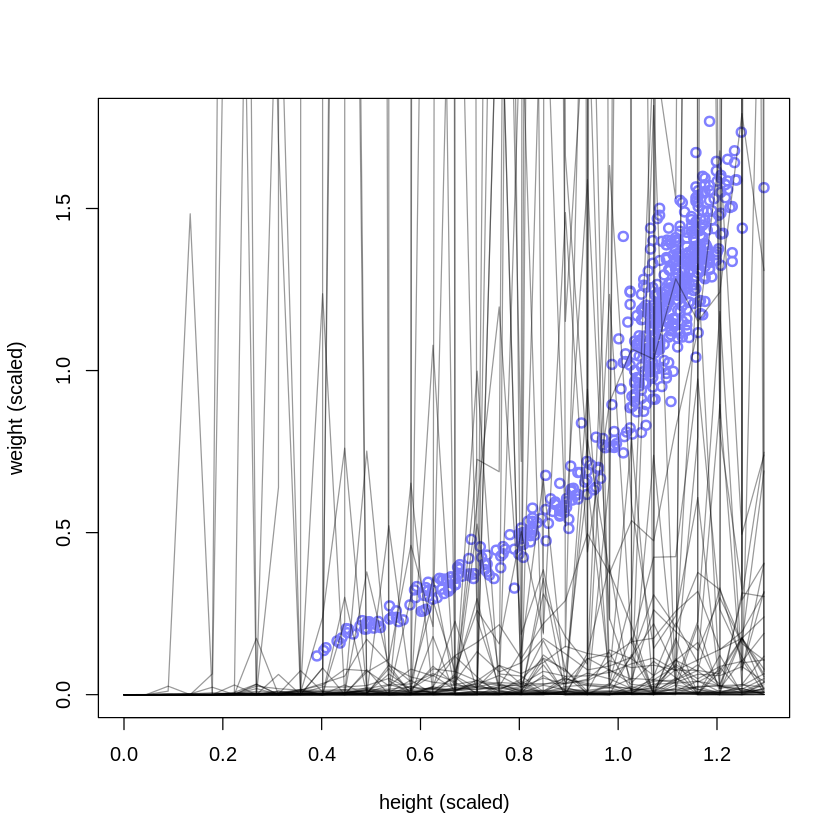

In [7]:
prior <- extract.prior(m16.1updateSigma2)

h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16.1updateSigma2 , post=prior, data=list(h=h_seq), chains=4, cores=4)

plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
    lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
for ( i in 1:50 ) lines( h_seq, w_sim[i,], col=col.alpha("black",0.4) )

Unsurprisingly, increasing sigma allows a greater varation of prior predictions, thus many more lines are nearer the data.

What happens if we do full on data snooping and try to match the means of the priors with the means of the posterior of the original model?  We try this below:

In [9]:
m16.1update <- ulam(
            alist(
                w ~ dlnorm( mu , sigma ),
#                 exp(mu) <- 3.141593 * k * p^2 * h^3,   # Error in `[[<-`(`*tmp*`, left_symbol, value = list(type = left_type, dims = the_dims, : no such index at level 1
                mu <- log(3.141593 * k * p^2 * h^3),  # Need to re-write link this way to avoid error above.
                p ~ beta( 5 , 20 ),
                k ~ exponential( 0.2 ),
                sigma ~ exponential( 5 )
            ), data=d , chains=4 , cores=4
#             , log_lik=TRUE
        )

In [10]:
precis(m16.1update)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2312156,0.063875242,0.1476183,0.3356070,510.9963,1.003006
k,6.9968907,4.020941499,2.6757615,13.7912310,632.9215,1.001314
sigma,0.2068433,0.006432596,0.1965996,0.2175125,743.9343,1.002644



SAMPLING FOR MODEL 'f12e8d20860e435aface2c461acd5dbe' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000113 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 1.13 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.968383 seconds (Warm-up)
Chain 1:                0.893408 seconds (Sampling)

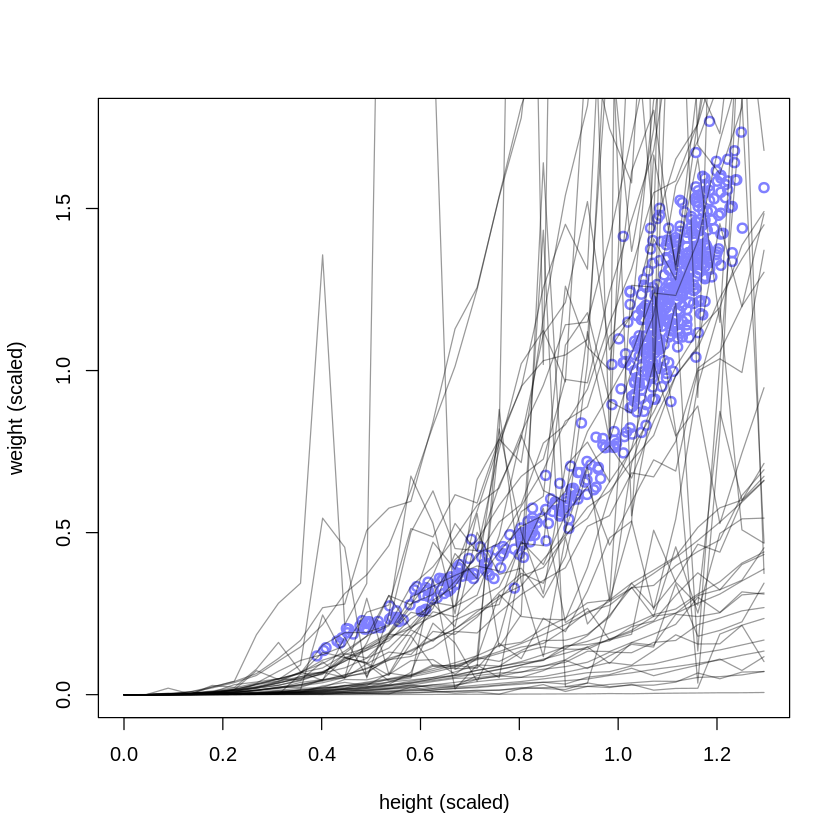

In [11]:
prior <- extract.prior(m16.1update)

h_seq <- seq( from=0 , to=max(d$h) , length.out=30 )
w_sim <- sim( m16.1update , post=prior, data=list(h=h_seq), chains=4, cores=4)

plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
    lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
for ( i in 1:50 ) lines( h_seq, w_sim[i,], col=col.alpha("black",0.4) )



# mu_mean <- apply( w_sim , 2 , mean )
# w_CI <- apply( w_sim , 2 , PI )
# plot( d$h , d$w , xlim=c(0,max(d$h)) , ylim=c(0,max(d$w)) , col=rangi2 ,
# lwd=2 , xlab="height (scaled)" , ylab="weight (scaled)" )
# lines( h_seq , mu_mean )
# shade( w_CI , h_seq )

16M3

In [51]:
library(rethinking)
options(mc.cores = parallel::detectCores())
data(Lynx_Hare)
# data(Lynx_Hare_model)
# cat(Lynx_Hare_model)

In [52]:
dat_list <- list(
                N = nrow(Lynx_Hare),
                pelts = Lynx_Hare[,2:3] )

In [ ]:
m16m3 <- stan( model_code=Lynx_Hare_model , data=dat_list , chains=3 , cores=3 , 
              control=list( adapt_delta=0.95 ) )

In [41]:
class(m16.1)

[1] "ulam"
attr(,"package")
[1] "rethinking"

In [42]:
class(m16m3)

[1] "stanfit"
attr(,"package")
[1] "rstan"

The code extract.prior doesn't work on stanfit objects, only ulam objects.  We thus have to make a choice on how to perform prior predictive simulation:

1) Manually, sample from the priors and do the calculations to get the outcome variables.  This seems like the long-winded error-prone way of doing this.  Can't there be a simpler method?

2) Try to use the model code from the stanfit object as an argument to the ulam function, and then use extract.prior as normal.  I don't know if this is possible without major re-working of the text, as ulam normally parses text into a form that stan uses to create the stanfit object; it doesn't necessarily work backwards...

3) Following advice from https://modernstatisticalworkflow.blogspot.com/2017/04/an-easy-way-to-simulate-fake-data-from.html, in particular: "We do this by only evaluating the likelihood if we tell it to. If a likelihood is not evaluated, then our posterior is equal to the prior. In this case, our posterior predictive draws are actually prior predictive draws—precisely the fake data we want."


In [4]:
# cat(Lynx_Hare_model)

functions {
  real[] dpop_dt( real t,                 // time
                real[] pop_init,          // initial state {lynx, hares}
                real[] theta,             // parameters
                real[] x_r, int[] x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  real<lower=0> pelts[N,2];    // measured populations
}
transformed data{
  real times_measured[N-1];    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  real<lower=0> theta[4];      // { bh, mh, ml, bl }
  real<lower=0> pop_init[2];   // initial population state
  real<lower=0> sigma[2];      // measurement errors
  real<lower=0,upper=1> p[2];

In [3]:
model2export <- "functions {
  real[] dpop_dt( real t,                 // time
                real[] pop_init,          // initial state {lynx, hares}
                real[] theta,             // parameters
                real[] x_r, int[] x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  real<lower=0> pelts[N,2];    // measured populations
  int<lower = 0, upper = 1> run_estimation; // a switch to evaluate the likelihood
}
transformed data{
  real times_measured[N-1];    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  real<lower=0> theta[4];      // { bh, mh, ml, bl }
  real<lower=0> pop_init[2];   // initial population state
  real<lower=0> sigma[2];      // measurement errors
  real<lower=0,upper=1> p[2];  // trap rate
}
transformed parameters {
  real pop[N, 2];
  pop[1,1] = pop_init[1];
  pop[1,2] = pop_init[2];
  pop[2:N,1:2] = integrate_ode_rk45(
    dpop_dt, pop_init, 0, times_measured, theta,
    rep_array(0.0, 0), rep_array(0, 0),
    1e-5, 1e-3, 5e2);
}
model {
  // priors
//  theta[{1,3}] ~ normal( 1 , 0.1 );    // bh,ml
//  theta[{2,4}] ~ normal( 0.05, 0.01 ); // mh,bl
//  sigma ~ exponential( 5 );
//  pop_init ~ lognormal( log(10) , 0.1 );
//  p ~ beta(4000,20000);
  theta[{1,3}] ~ normal( 1 , 0.5 );    // bh,ml
  theta[{2,4}] ~ normal( 0.05, 0.05 ); // mh,bl
  sigma ~ exponential( 1 );
  pop_init ~ lognormal( log(10) , 1 );
  p ~ beta(40,200);
  // observation model
  // connect latent population state to observed pelts
  // likelihood, which we only evaluate conditionally
  if(run_estimation==1){
      for ( t in 1:N )
        for ( k in 1:2 )
          pelts[t,k] ~ lognormal( log(pop[t,k]*p[k]) , sigma[k] );
  }
}
generated quantities {
  real pelts_pred[N,2];
  for ( t in 1:N )
    for ( k in 1:2 )
      pelts_pred[t,k] = lognormal_rng( log(pop[t,k]*p[k]) , sigma[k] );
}
"

In [5]:
cat(model2export, file='model_priorPredict.stan')
compiled_model <- stan_model("model_priorPredict.stan")

The following code crashes a lot when using the original priors in the book.  On running it in the terminal, the following error messages appear frequently:

"
[1] "Chain 2: Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:"                        
[2] "Chain 2: Exception: Max number of iterations exceeded (500).  (in 'model17abb2ebe9f_model_priorPredict' at line 37)"                            
[3] "Chain 2: If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,"
[4] "Chain 2: but if this warning occurs often then your model may be either severely ill-conditioned or misspecified."                              
[5] "Chain 2: "                                                                                                                                      
[6] "Error in sampler$call_sampler(args_list[[i]]) : "                                                                                               
[7] "  Exception: lognormal_rng: Location parameter is nan, but must be finite!  (in 'model17abb2ebe9f_model_priorPredict' at line 62)"              
error occurred during calling the sampler; sampling not done
"

In particular, the last line (number [7]) repeats many times for several different runs.  I think there are some NaN types or numerical errors creeping in - there is possibly some region of the prior space that is undefined for the pelts_pred variales.  When I use very informative / narrow priors, the number of errors reduces a lot, which would support this idea.

I did manage to run a few times without crashing and the results are below.

Have a look at the file: 'Chpt16_Practice_16M3.R' in the same folder as the notebooks and run that in Rstudio (or the terminal?) to be able to produce the charts without the Kernel crashing.

In [ ]:
# f <- rep(1,21)
# fake_data <- data.frame(f,f)
fake_data <- Lynx_Hare[,2:3]

sim_out <- sampling(compiled_model, data = list(N = 21, 
                                                # pelts should be real but fake data if we're simulating
                                                # new pelts
                                                pelts = fake_data,
                                                run_estimation = 0     # turn off estimation to instead do prior predictive simulation
                                                )
                   , chains=4, cores=4
                   , control=list(adapt_delta=0.99, max_treedepth=20)
                   , iter=2000
                   )

In [ ]:
# sim_out <- sampling(compiled_model, data = list(N = 21, pelts = fake_data, run_estimation = 0 )
#                    , chains=4, cores=4 , control=list(adapt_delta=0.99, max_treedepth=20) , iter=2000 )

In [24]:
# precis(sim_out, depth=3)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
theta[1],0.99334625,2.498501e-01,0.58267735,1.38395826,2045.0035,1.0013028
theta[2],0.05029144,2.415946e-02,0.01113641,0.08956305,1284.6848,1.0012488
theta[3],0.99953934,2.508253e-01,0.60392643,1.40175372,2625.7274,1.0016954
theta[4],0.05083416,2.399939e-02,0.01285770,0.09029877,1590.9567,1.0016574
pop_init[1],11.35636882,6.070496e+00,4.36104686,22.74092380,2704.2399,1.0004449
pop_init[2],11.34469453,6.105624e+00,4.56367552,22.45824081,2695.1664,1.0007407
sigma[1],0.49887253,4.993736e-01,0.02680086,1.41461353,3958.2787,0.9997450
sigma[2],0.49958191,4.919373e-01,0.02854057,1.45915809,3700.0792,0.9994324
p[1],0.16684782,7.693353e-03,0.15488649,0.17917441,2825.3677,1.0002744


In [5]:
library(dplyr)

fake_data_matrix  <- sim_out %>% 
  as.data.frame %>% 
  select(contains("pelts_pred"))

# summary_tbl <- apply(fake_data_matrix[1:5,], 1, summary)
# summary_tbl

head(fake_data_matrix)

fake_data_matrix$'pelts_pred[1,2]'


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



"pelts_pred[1,1]","pelts_pred[2,1]","pelts_pred[3,1]","pelts_pred[4,1]","pelts_pred[5,1]","pelts_pred[6,1]","pelts_pred[7,1]","pelts_pred[8,1]","pelts_pred[9,1]","pelts_pred[10,1]",⋯,"pelts_pred[12,2]","pelts_pred[13,2]","pelts_pred[14,2]","pelts_pred[15,2]","pelts_pred[16,2]","pelts_pred[17,2]","pelts_pred[18,2]","pelts_pred[19,2]","pelts_pred[20,2]","pelts_pred[21,2]"
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1.637315,1.1230777,3.4208509,5.7149752,3.1731086,1.6042788,1.2448830,0.7469427,2.850705,7.595733,⋯,0.8203450,1.2011885,9.4562340,13.6302559,5.0800928,0.8712840,1.493027,2.063823,6.0799719,6.70787471
1.252441,2.0924802,10.0098405,6.0590729,2.2356244,1.1557975,0.9971403,3.1748142,10.164339,5.976771,⋯,1.4877180,7.3804114,59.2308222,14.1076340,0.7998661,0.2962151,2.408061,3.098189,9.5083582,4.43895324
1.255514,8.9867844,3.6875738,1.8136956,0.7962556,0.7618525,2.8142306,8.8377242,3.941657,1.530697,⋯,5.1435235,2.4444615,0.8720918,0.5133236,0.6050062,1.4825138,1.736062,2.474331,6.4610045,1.64808436
2.724725,1.0187261,7.8959307,41.6234981,22.6596085,0.8562385,7.7374497,1.3814044,0.493919,1.272467,⋯,1.5606724,1.4193939,3.2479574,4.1880251,11.2045302,31.5232710,9.573055,1.275836,0.8151262,1.85725611
1.051870,0.2911342,0.2613183,0.4310612,16.8770398,178.8309325,91.6028599,43.4898686,23.847328,10.412112,⋯,0.1926104,0.9790685,3.2439322,8.5566610,22.6579459,97.3550626,364.168252,8.088054,0.2144011,0.03108019
1.251271,0.2777568,0.1143609,0.2839491,25.6976541,37.8590736,8.2580081,3.8315884,1.371757,0.562462,⋯,60.5862787,127.7659216,168.8809469,1.8206001,0.1607349,2.0448609,7.556494,11.243880,19.4972763,21.12487133


[1] 1.796973e+00 1.982570e+00 5.056215e+00 2.016682e+00 1.444708e+00
   [6] 1.698226e+00 2.327827e+00 9.041349e-01 5.801882e-01 8.533987e-01
  [11] 4.120373e+00 8.549275e+00 2.882096e-01 9.017904e-01 1.359648e+00
  [16] 6.315182e-01 4.321788e+00 3.358987e+00 2.420793e+00 3.341997e+00
  [21] 2.989966e+00 8.726391e-01 2.811035e+00 9.569975e-01 4.497114e-01
  [26] 1.247531e+00 1.093098e+00 1.217843e+00 1.186538e+00 3.386379e+00
  [31] 1.656047e+01 2.647814e+00 1.696821e+00 1.355618e+00 1.281127e+00
  [36] 1.230717e+00 1.277128e+01 7.429031e+00 2.107563e+00 1.369720e+00
  [41] 1.521566e+00 9.059490e-01 4.455086e-01 1.063505e+00 1.213874e+00
  [46] 6.673488e+00 1.573988e+00 8.733157e-01 7.504456e+00 1.583108e+00
  [51] 1.274012e+00 2.905070e+00 1.290878e+00 1.227922e+00 1.462815e+00
  [56] 3.880676e-01 3.223819e+00 4.404867e+00 3.118694e+00 1.370446e+00
  [61] 3.604192e+00 2.048878e+00 1.344743e+00 2.096319e+00 1.108717e+00
  [66] 6.204548e-01 1.300949e+00 6.515108e+00 1.877476e+00 3.501832e+00
  [71] 2.780972e+00 1.357987e+00 2.654362e+00 1.795726e+00 1.850035e+00
  [76] 1.557104e+01 1.639288e-01 1.056753e+00 5.245096e-01 1.262136e+00
  [81] 9.138533e-01 3.082644e+00 2.387450e+00 1.810580e+00 1.028933e+00
  [86] 2.683147e+00 5.726463e-01 3.091315e+00 2.034023e+00 1.547592e+00
  [91] 3.073573e+00 1.540246e+00 1.223169e+00 2.182926e+00 5.866543e+00
  [96] 1.771772e+00 1.688313e+00 2.695411e+00 1.945367e+00 1.177352e+00
 [101] 9.775051e-01 3.255631e+00 1.985797e+00 5.900823e-01 4.684577e-01
 [106] 1.004778e+00 2.554185e+00 2.397691e+00 7.113799e-01 2.333439e-01
 [111] 4.828458e+00 1.078941e+00 1.599847e+00 1.061115e+00 4.124707e-01
 [116] 1.036874e+00 7.228250e-02 1.082627e+00 5.307518e-01 4.558024e-01
 [121] 1.952780e+00 2.630472e+00 7.137597e-01 3.871382e+00 5.671413e+00
 [126] 4.674318e+00 9.086448e-01 1.362208e+00 3.742884e+00 2.158401e+00
 [131] 2.601044e+00 1.277744e+00 4.417646e+00 2.482829e+03 2.178885e+00
 [136] 1.459633e+00 3.661713e-01 5.873591e+00 3.982272e+00 2.573273e+00
 [141] 3.453444e+00 2.793954e+00 6.030300e-01 1.516555e+00 5.727064e-01
 [146] 1.473919e+00 1.400134e+00 9.621124e-01 1.653665e+00 7.461583e+00
 [151] 2.092071e+00 1.666598e+00 1.464902e+00 1.657381e+00 2.457309e+00
 [156] 1.066682e+00 1.235581e+00 4.629223e-01 5.937658e-01 1.707103e+00
 [161] 2.154148e+00 5.700704e+00 2.379976e+00 4.710075e+00 1.988284e+00
 [166] 4.915968e+00 2.093488e+00 1.949754e+00 1.272887e+00 1.860352e+00
 [171] 1.409505e+00 5.254541e-01 2.751936e+01 4.949081e+00 4.872386e+00
 [176] 1.877804e+00 1.520428e+00 1.515568e+00 1.037186e+00 2.401717e+00
 [181] 1.993019e+00 7.556466e-01 8.573142e-01 4.132769e-01 2.726926e+00
 [186] 1.743302e+00 9.198973e-01 7.015879e-01 4.966509e-01 7.157667e-01
 [191] 5.666880e+00 9.409725e-01 1.042045e+00 1.392342e+00 1.390939e+00
 [196] 1.264693e+00 1.058871e+00 6.428717e-01 3.189019e+00 1.159097e+00
 [201] 5.600521e-01 1.306710e+00 1.358776e+01 2.449489e+00 1.998161e+00
 [206] 1.220481e+00 2.341059e+00 2.278026e+00 7.781422e+00 7.396542e-01
 [211] 2.288328e+00 3.057511e+00 2.022998e+00 1.046606e+00 3.675861e+00
 [216] 1.358854e+00 3.865687e+00 1.067954e+00 4.270209e+00 1.410568e+00
 [221] 1.900563e+00 1.336833e+00 1.759468e+00 1.903340e+00 1.570568e+00
 [226] 7.661560e-01 1.773661e+00 7.006663e+00 2.702813e+00 1.318733e+00
 [231] 2.131137e+00 1.735157e+00 4.437136e-01 1.121662e+00 1.926831e+00
 [236] 6.241902e-01 1.530272e+00 1.145866e+00 2.031997e+00 2.168038e-01
 [241] 7.595483e-01 1.724825e+00 2.279361e+00 2.384364e+00 8.269924e-01
 [246] 5.552444e+01 3.960909e+00 1.610238e+00 6.000377e-01 7.573152e-01
 [251] 1.102560e+00 2.310427e+00 2.252996e+00 6.887555e+01 3.130364e+00
 [256] 1.443472e+00 1.078095e+00 2.307844e+00 8.282987e-01 8.074330e-01
 [261] 1.849324e+00 1.325938e+00 1.344462e+00 3.528738e+00 1.083912e+00
 [266] 9.987353e-01 1.908272e+00 7.271679e-01 2.563181e+00 2.627552e+00
 [271] 2.277639e+00 2.452735e+00 9.822800e-01 5.224271e-01 4.942175e-01
 [276] 1.150104e+00 9.880506e-01 1.341265e+

In [6]:
prior <- data.frame(fake_data_matrix)
prior[1,22:42]
prior[22]

pelts_pred.1.2.,pelts_pred.2.2.,pelts_pred.3.2.,pelts_pred.4.2.,pelts_pred.5.2.,pelts_pred.6.2.,pelts_pred.7.2.,pelts_pred.8.2.,pelts_pred.9.2.,pelts_pred.10.2.,⋯,pelts_pred.12.2.,pelts_pred.13.2.,pelts_pred.14.2.,pelts_pred.15.2.,pelts_pred.16.2.,pelts_pred.17.2.,pelts_pred.18.2.,pelts_pred.19.2.,pelts_pred.20.2.,pelts_pred.21.2.
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1.796973,8.412111,15.97357,12.58102,1.806543,2.071231,2.137538,4.30751,9.87192,5.903758,⋯,0.820345,1.201188,9.456234,13.63026,5.080093,0.871284,1.493027,2.063823,6.079972,6.707875


pelts_pred.1.2.
<dbl>
1.7969735
1.9825703
5.0562151
2.0166824
1.4447081
1.6982259
2.3278274
0.9041349
0.5801882


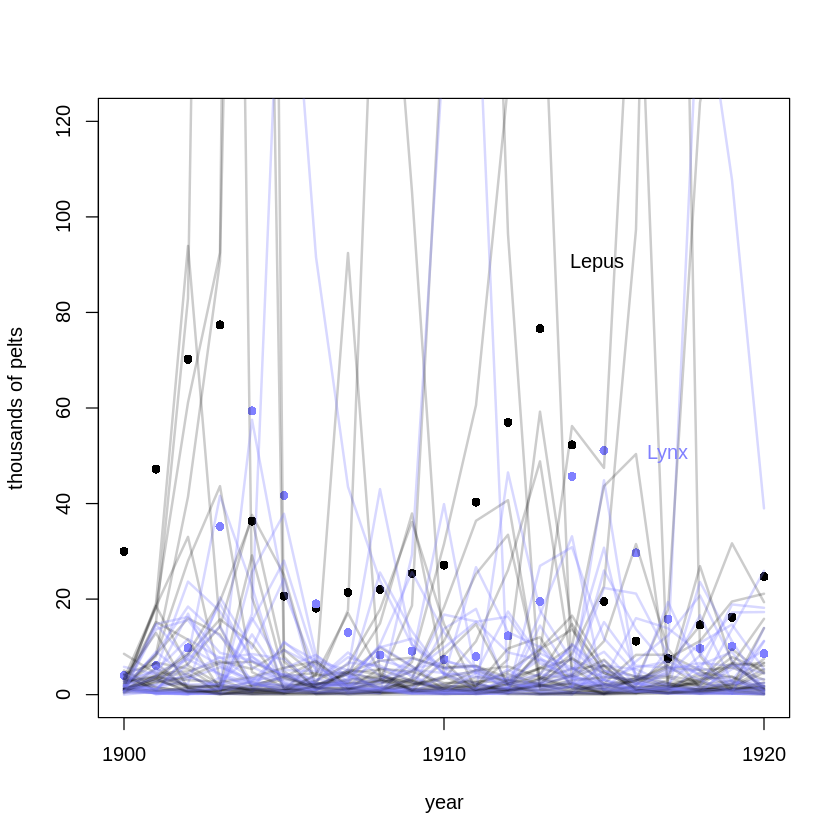

In [7]:
pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:30 ) {
#     lines( 1:21 , prior$pelts_pred[s,,2] , col=col.alpha("black",0.2) , lwd=2 )
#     lines( 1:21 , prior$pelts_pred[s,,1] , col=col.alpha(rangi2,0.3) , lwd=2 )
    lines( 1:21 , prior[s,22:42] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:21 , prior[s,1:21] , col=col.alpha(rangi2,0.3) , lwd=2 )

}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

It's difficult to answer the question by varying the parameters of the priors in a notebook, because the Kernel crashes.  See the R script Chpt16_Practice_16M3.R in the same directory as this notebook to run in Rstudio and see the charts.

WARNING DATA SNOOPING (looking at data and varying prior parameters to try to match it), ALSO the following argument is based on only 30 samples from the prior (but this is not so bad, as if you include many more, it is difficult to see the dispersion in the charts):

The typical criticism of the baseline prior simulation is that most of the distribution of the priors predicts too low a number of pelts, with only a few 'peaks' that reach up to the values of the data (see the figure above).

Therefore, the question is, which parameters can be varied to increase the weight of the prior distribution to cover values more similar to the data, i.e. in this case, to increase the value of the sample lines in the figure above?

Using Rstudio (because the Kernel keeps crashing in this notebook), we ran the code above and produced sevreal figures, varying an individual parameter of one of the priors, one at a time, around the baseline case.  The figures produced suggest that varying the following parameters had the greatest ability to increase the prior values to match more closely the data:

p - reducing both parameters in the beta distribution makes the prior more uncertain, e.g. from beta(40, 200) to beta(4, 20)

p - increasing success parameter (the first parameter), e.g. from beta(40, 200) to beta(80, 200)

pop_init - reducing standard deviation, e.g. from lognormal(log(10), 1) to lognormal(log(10), 0.5).  Note that increasing the standard deviation e.g. to lognormal(log(10), 2) leads to all samples having numerical errors, so no prior samples can be taken (so don't do this).

sigma - reducing parameter in exponential, so that exp distribution has larger mean / median, e.g. exp(1) to exp(0.5).

theta[{1,3}] - increasing mu / mean of normal dist, e.g. from normal(1, 0.5) to normal(2, 0.5).

Note, changing theta[{2,4}] (by increasing the mu, or increasing/decreasing the sd of the normal dist) did not result in any obvious improvement of the prior for the specific simulation runs we saw.  The baseline distribution of theta[2] and theta[4] are normal(0.05, 0.05), which perversely should have a significant part of the distribution with negative values, which are impossible, given that the parameter stands for the death rate of the hares (mh) and the birth rate of the lynx (bl).  A more reasonable 'physical' distribution would be ~ normal(0.05, 0.025) to reduce the amount of negative values.

We therefore make the following adjustments to the prior, and will sample from the prior and then use this prior to estimate the posterior:

p ~ beta(8, 20),

pop_init ~ lognormal(log(10), 0.5),

sigma ~ exp(1), # note we choose to keep this constant because we hope that by changing all the other parameters, we don't need to rely on this random variation of measurement error to shift the prior to explore the appropriate outcome space.

theta[{1,3}] ~ normal(2, 0.5),

theta[{2,4}] ~ normal(0.05, 0.025)

In [35]:
model2export <- "functions {
  real[] dpop_dt( real t,                 // time
                real[] pop_init,          // initial state {lynx, hares}
                real[] theta,             // parameters
                real[] x_r, int[] x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  real<lower=0> pelts[N,2];    // measured populations
  int<lower = 0, upper = 1> run_estimation; // a switch to evaluate the likelihood
}
transformed data{
  real times_measured[N-1];    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  real<lower=0> theta[4];      // { bh, mh, ml, bl }
  real<lower=0> pop_init[2];   // initial population state
  real<lower=0> sigma[2];      // measurement errors
  real<lower=0,upper=1> p[2];  // trap rate
}
transformed parameters {
  real pop[N, 2];
  pop[1,1] = pop_init[1];
  pop[1,2] = pop_init[2];
  pop[2:N,1:2] = integrate_ode_rk45(
    dpop_dt, pop_init, 0, times_measured, theta,
    rep_array(0.0, 0), rep_array(0, 0),
    1e-5, 1e-3, 5e2);
}
model {
  // priors
  theta[{1,3}] ~ normal( 2 , 0.5 );    // bh,ml
  theta[{2,4}] ~ normal( 0.05, 0.025 ); // mh,bl
  sigma ~ exponential( 1 );
  pop_init ~ lognormal( log(10) , 0.5 );
  p ~ beta(8,20);
  // observation model
  // connect latent population state to observed pelts
  // likelihood, which we only evaluate conditionally
  if(run_estimation==1){
      for ( t in 1:N )
        for ( k in 1:2 )
          pelts[t,k] ~ lognormal( log(pop[t,k]*p[k]) , sigma[k] );
  }
}
generated quantities {
  real pelts_pred[N,2];
  for ( t in 1:N )
    for ( k in 1:2 )
      pelts_pred[t,k] = lognormal_rng( log(pop[t,k]*p[k]) , sigma[k] );
}
"

In [36]:
cat(model2export, file='model_priorPredict.stan')

In [37]:
compiled_model <- stan_model("model_priorPredict.stan")

In [ ]:
# f <- rep(1,21)
# fake_data <- data.frame(f,f)
fake_data <- Lynx_Hare[,2:3]

sim_out <- sampling(compiled_model, data = list(N = 21, 
                                                # pelts should be real but fake data if we're simulating
                                                # new pelts
                                                pelts = fake_data,
                                                run_estimation = 0     # turn off estimation to instead do prior predictive simulation
                                                )
                   , chains=4, cores=4
                   , control=list(adapt_delta=0.99, max_treedepth=20)
                   , iter=2000
                   )

In [ ]:
library(dplyr)

fake_data_matrix  <- sim_out %>% 
  as.data.frame %>% 
  select(contains("pelts_pred"))

# summary_tbl <- apply(fake_data_matrix[1:5,], 1, summary)
# summary_tbl

head(fake_data_matrix)

fake_data_matrix$'pelts_pred[1,2]'

In [ ]:
prior <- data.frame(fake_data_matrix)
prior[1,22:42]
prior[22]

In [ ]:
pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:30 ) {
#     lines( 1:21 , prior$pelts_pred[s,,2] , col=col.alpha("black",0.2) , lwd=2 )
#     lines( 1:21 , prior$pelts_pred[s,,1] , col=col.alpha(rangi2,0.3) , lwd=2 )
    lines( 1:21 , prior[s,22:42] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:21 , prior[s,1:21] , col=col.alpha(rangi2,0.3) , lwd=2 )

}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

Again, had the problem with the Kernel dying, so we run it again in Rstudio and save the figure of the new prior as 'NewPrior.png'.

We indeed find that the new prior distribution is much more likely to cover the area of the data.  Of course, this is data snooping though, so is not necessarily a great way to come up with ideas for a better prior, but without a lot of intuition of the impact of the priors, or strong theoretical justifications for specific priors, this may be what we have to do.

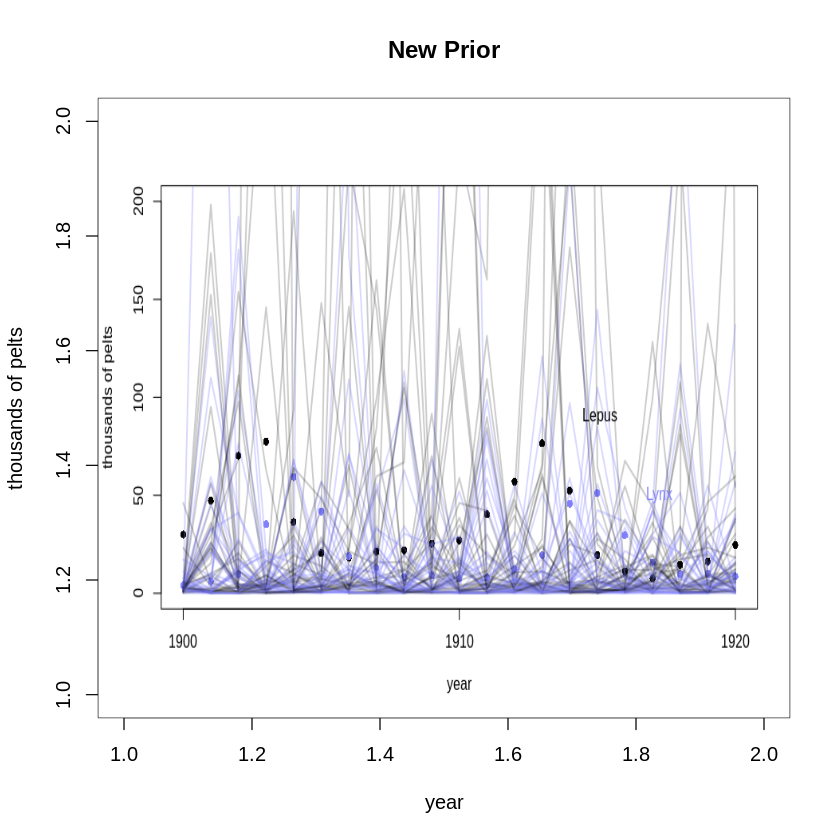

In [32]:
library(png)

#Replace the directory and file information with your info
ima <- readPNG("/home/rer/Documents/Stats, Machine Learning and AI/Statistical Rethinking/Rcode/NewPrior.png")
#Set up the plot area
plot(1:2, type='n', main="New Prior" , xlab="year", ylab="thousands of pelts")

rasterImage(ima, lim$usr[1], lim$usr[3], lim$usr[2], lim$usr[4])

OK, now let's use this new prior distribution to estimtae the model:

In [42]:
# dat <- Lynx_Hare[,2:3]

sim_out <- sampling(compiled_model, data = list(N = 21, 
                                                # pelts should be real but fake data if we're simulating
                                                # new pelts
                                                pelts = pelts,
                                                run_estimation = 1     # turn off estimation to instead do prior predictive simulation
                                                )
                   , chains=4, cores=4
                   , control=list(adapt_delta=0.99, max_treedepth=20)
                   , iter=2000
                   )

In [39]:
library(dplyr)

data_matrix  <- sim_out %>% 
  as.data.frame %>% 
  select(contains("pelts_pred"))

# head(data_matrix)

# data_matrix$'pelts_pred[1,2]'


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



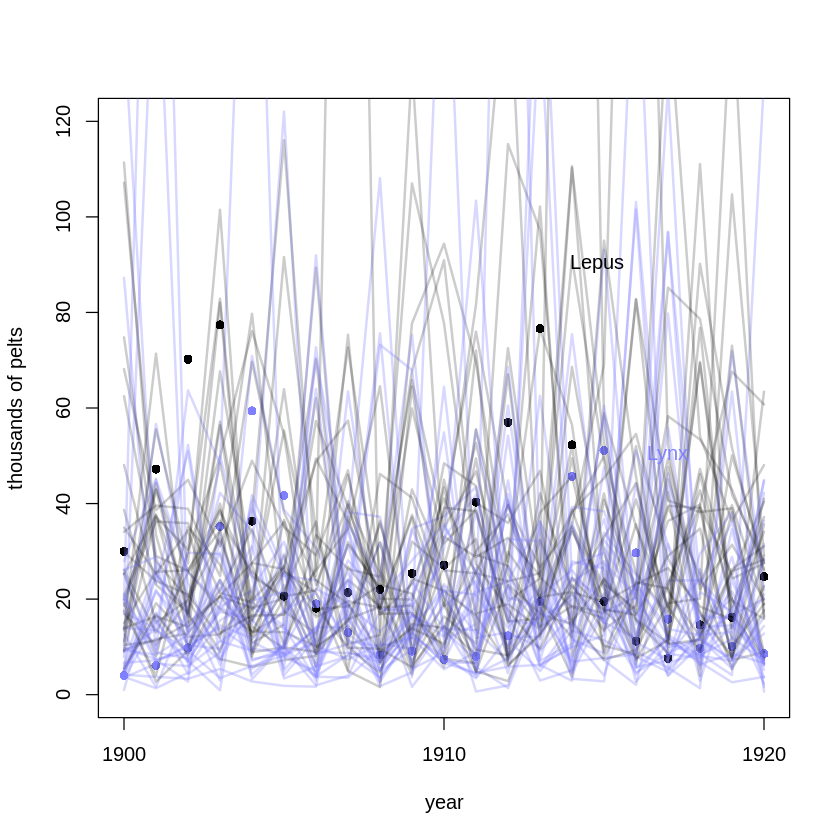

In [41]:
post <- data.frame(data_matrix)
# post[1,22:42]
# post[22]

pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:30 ) {
#     lines( 1:21 , prior$pelts_pred[s,,2] , col=col.alpha("black",0.2) , lwd=2 )
#     lines( 1:21 , prior$pelts_pred[s,,1] , col=col.alpha(rangi2,0.3) , lwd=2 )
    lines( 1:21 , post[s,22:42] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:21 , post[s,1:21] , col=col.alpha(rangi2,0.3) , lwd=2 )

}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

OK, this looks a mess and it seems that there hasn't been convergence to the posterior.  Is this because the priors are more regularizing, so that the model has not sufficiently learnt from the data?

To investigate this, we run for more iterations.

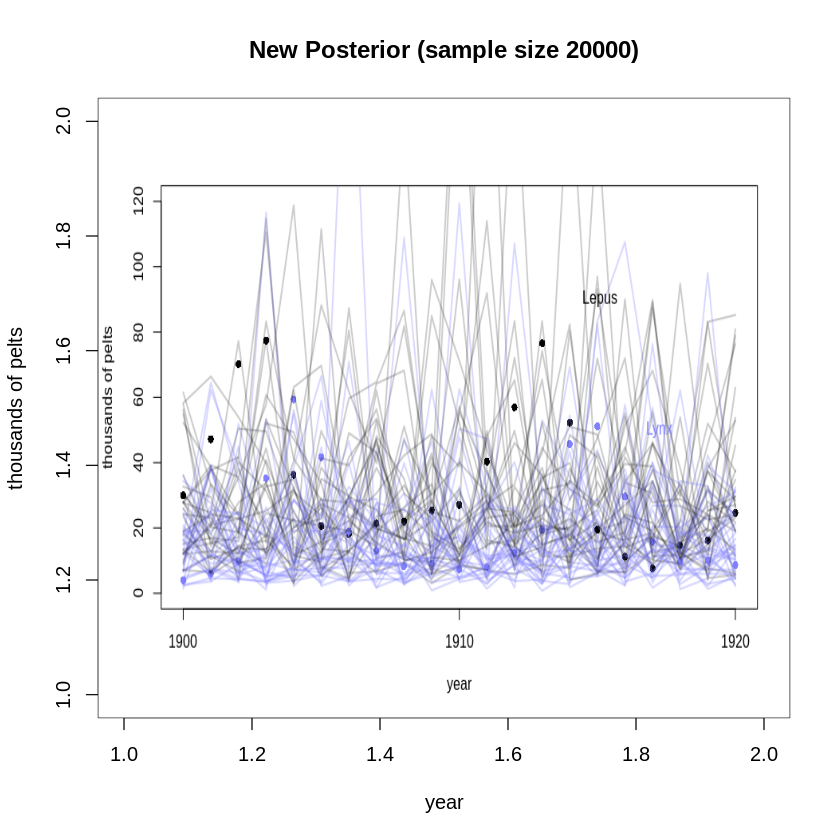

In [50]:
library(png)

#Replace the directory and file information with your info
ima <- readPNG("/home/rer/Documents/Stats, Machine Learning and AI/Statistical Rethinking/Rcode/NewPosteriorSampleSize20000.png")
#Set up the plot area
plot(1:2, type='n', main="New Posterior (sample size 20000)" , xlab="year", ylab="thousands of pelts")

rasterImage(ima, lim$usr[1], lim$usr[3], lim$usr[2], lim$usr[4])

Not sure whether it's the process that doesn't work, or the possibility that the new priors somehow make convergence too difficult, either because they are too regularizing, or that perhaps they are too diffuse in some dimensions that lead to numerical errors or NaN regions of outcome space???

I will run the same process with the original priors (which is a different method to that in the book) and see if we get the same outcome.

In [46]:
model2export <- "functions {
  real[] dpop_dt( real t,                 // time
                real[] pop_init,          // initial state {lynx, hares}
                real[] theta,             // parameters
                real[] x_r, int[] x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  real<lower=0> pelts[N,2];    // measured populations
}
transformed data{
  real times_measured[N-1];    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  real<lower=0> theta[4];      // { bh, mh, ml, bl }
  real<lower=0> pop_init[2];   // initial population state
  real<lower=0> sigma[2];      // measurement errors
  real<lower=0,upper=1> p[2];  // trap rate
}
transformed parameters {
  real pop[N, 2];
  pop[1,1] = pop_init[1];
  pop[1,2] = pop_init[2];
  pop[2:N,1:2] = integrate_ode_rk45(
    dpop_dt, pop_init, 0, times_measured, theta,
    rep_array(0.0, 0), rep_array(0, 0),
    1e-5, 1e-3, 5e2);
}
model {
  // priors
  theta[{1,3}] ~ normal( 1 , 0.5 );    // bh,ml
  theta[{2,4}] ~ normal( 0.05, 0.05 ); // mh,bl
  sigma ~ exponential( 1 );
  pop_init ~ lognormal( log(10) , 1 );
  p ~ beta(40,200);
  // observation model
  // connect latent population state to observed pelts
  for ( t in 1:N )
    for ( k in 1:2 )
      pelts[t,k] ~ lognormal( log(pop[t,k]*p[k]) , sigma[k] );
}
generated quantities {
  real pelts_pred[N,2];
  for ( t in 1:N )
    for ( k in 1:2 )
      pelts_pred[t,k] = lognormal_rng( log(pop[t,k]*p[k]) , sigma[k] );
}
"

In [48]:
cat(model2export, file='model_original.stan')

In [49]:
compiled_model <- stan_model("model_original.stan")

In [53]:
sim_out <- sampling(compiled_model, data = list(N = 21, 
                                                # pelts should be real but fake data if we're simulating
                                                # new pelts
                                                pelts = pelts,
                                                run_estimation = 1     # turn on estimation to get posterior
                        )
                        , chains=4, cores=4
                        , control=list(adapt_delta=0.99, max_treedepth=20)
                        , iter=2000
                        )

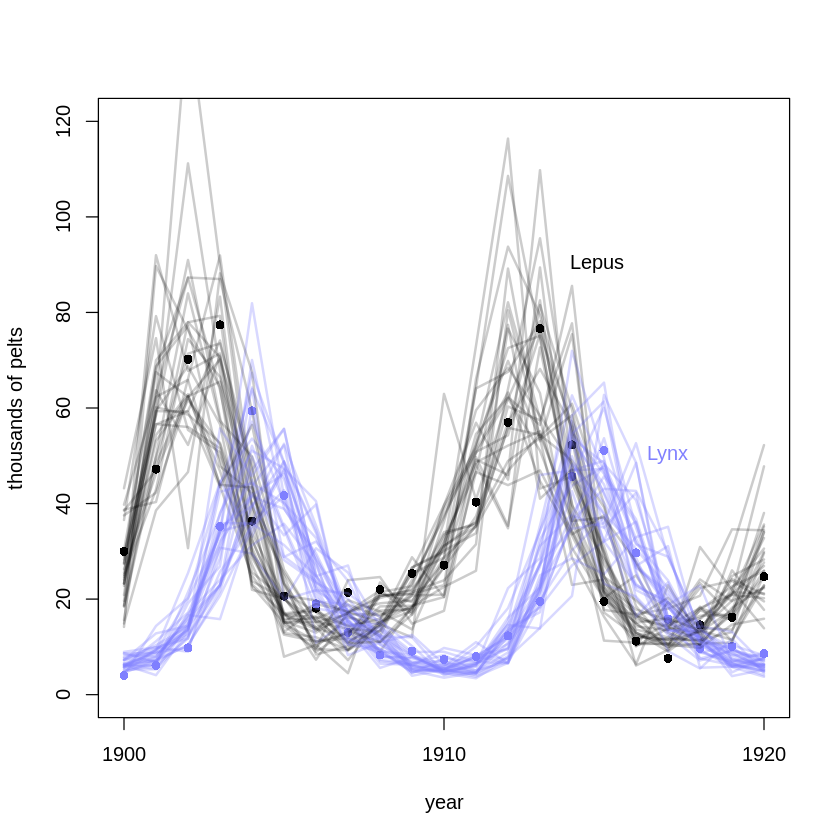

In [57]:
library(dplyr)

data_matrix  <- sim_out %>% 
  as.data.frame %>% 
  select(contains("pelts_pred"))

post <- data.frame(data_matrix)
# post[1,22:42]
# post[22]

pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:30 ) {
#     lines( 1:21 , prior$pelts_pred[s,,2] , col=col.alpha("black",0.2) , lwd=2 )
#     lines( 1:21 , prior$pelts_pred[s,,1] , col=col.alpha(rangi2,0.3) , lwd=2 )
    lines( 1:21 , post[s,22:42] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:21 , post[s,1:21] , col=col.alpha(rangi2,0.3) , lwd=2 )

}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

OK, so this demonstrates that the process does work, and it must be something about the supposed 'better' priors that I had chosen that mess up the estimation...

Well, this demonstrates that choosing priors by trying to match them to the data isn't necessarily a good strategy...

Can I think of a better prior than the one in the book, using theoretical arguments alone?

16H1

In [1]:
library(rethinking)
options(mc.cores = parallel::detectCores())
rstan_options(auto_write = TRUE)
data(Panda_nuts)
d <- Panda_nuts
head(d)

Loading required package: rstan
Loading required package: ggplot2
Loading required package: StanHeaders
rstan (Version 2.18.2, GitRev: 2e1f913d3ca3)
For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)
Loading required package: parallel
rethinking (Version 1.88)


chimpanzee,age,sex,hammer,nuts_opened,seconds,help
<int>,<int>,<fct>,<fct>,<int>,<dbl>,<fct>
11,3,m,G,0,61,N
11,3,m,G,0,37,N
18,4,f,wood,0,20,N
18,4,f,G,0,14,y
18,4,f,L,0,13,N
11,4,m,Q,0,24,N


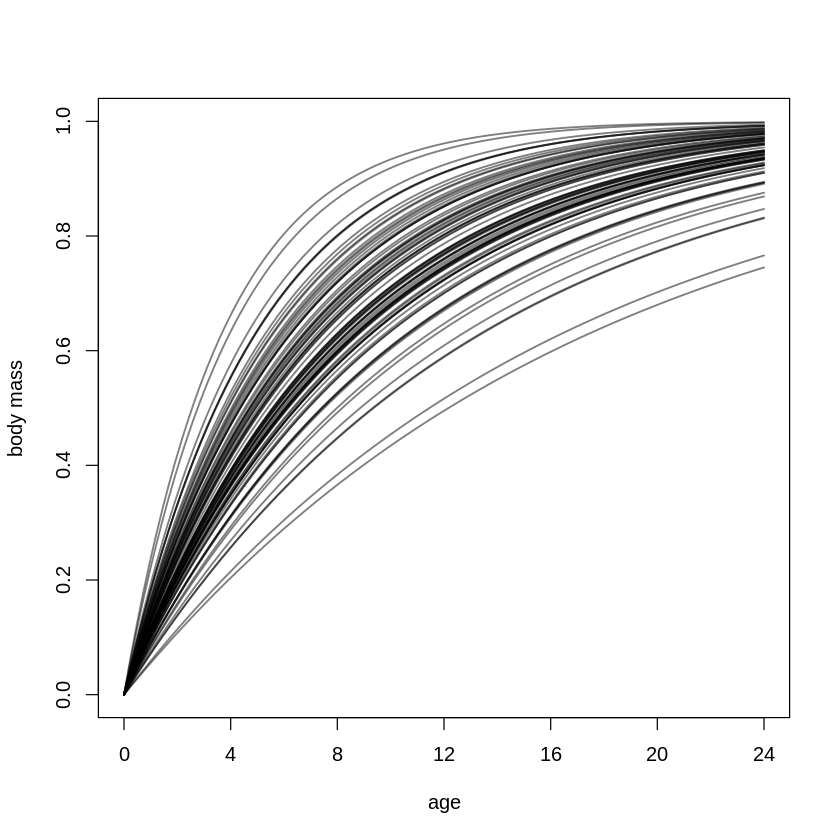

In [30]:
N <- 1e4
phi <- rlnorm( N , log(1) , 0.1 )
k <- rlnorm( N , log(2), 0.25 )
theta <- rlnorm( N , log(5) , 0.25 )

# relative grow curve
plot( NULL , xlim=c(0,1.5) , ylim=c(0,1) , xaxt="n" , xlab="age" ,
ylab="body mass" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
for ( i in 1:80 ) curve( (1-exp(-k[i]*x)) , add=TRUE , col=grau() , lwd=1.5 )

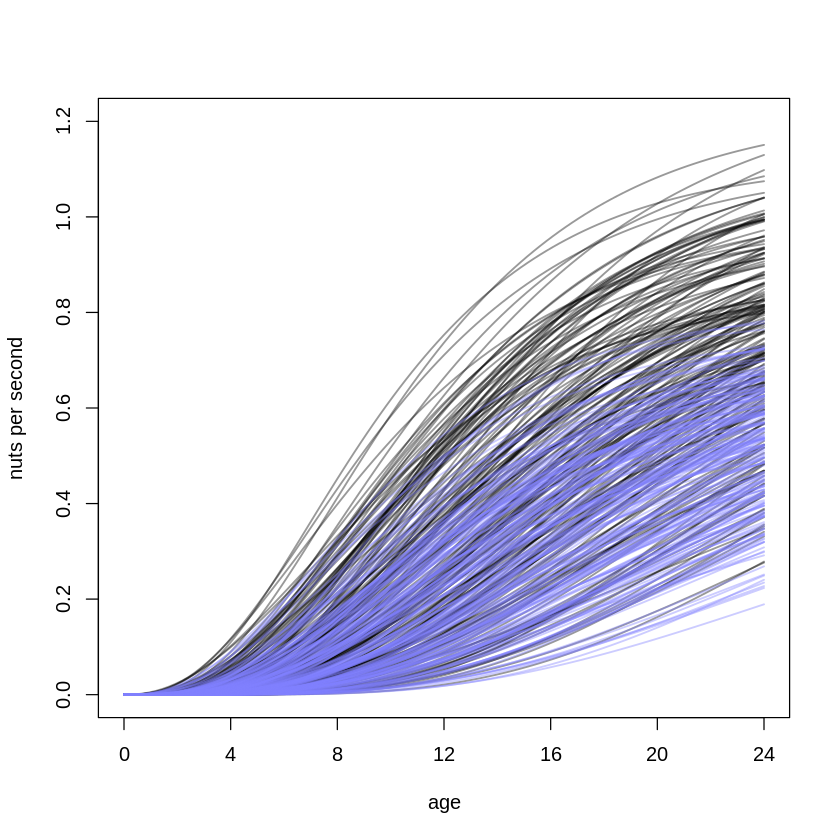

In [40]:
N <- 1e4
phi <- rlnorm( N , log(1) , 0.1 )
k <- rlnorm( N , log(2), 0.25 )
theta <- rlnorm( N , log(5) , 0.25 )


# implied rate of nut opening curve (Males - black)
plot( NULL , xlim=c(0,1.5) , ylim=c(0,1.2) , xaxt="n" , xlab="age" ,
ylab="nuts per second" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
for ( i in 1:200 ) curve( phi[i]*(1-exp(-k[i]*x))^theta[i] , add=TRUE ,
col=col.alpha("black",0.4) , lwd=1.5 )


# implied rate of nut opening curve (Females - purple)
phi <- rlnorm( N , log(0.7) , 0.1 )
for ( i in 1:200) curve( phi[i]*(1-exp(-k[i]*x))^theta[i] , add=TRUE ,
col=col.alpha(rangi2,0.4) , lwd=1.5 )

In [26]:
dat_list <- list(
                  n = as.integer( Panda_nuts$nuts_opened ),
                  age = Panda_nuts$age / max(Panda_nuts$age),
                  gid = ifelse(Panda_nuts$sex=='m', 1L, 2L),    # Males have gid=1, females gid=2.  We define this way for simpler prior in model below.
                  phiMu = c(1, 0.7),   # We use this in phi ~ lognorm(log(phiMu), 0.1), with phiMu=1 for gid=1 (i.e. males) and phiMu=0.7 for gid=2 (i.e. females)
                  seconds = Panda_nuts$seconds )

In [4]:
# # This is the wrong model - this just has a 1-d phi parameter

# m16H1 <- ulam(
#               alist(
#                     n ~ poisson( lambda ),
#                     lambda <- seconds*phi*(1-exp(-k*age))^theta,
#                 #   phi ~ lognormal( log(1) , 0.1 ),           # This was the original gender neutral prior.  Instead, we replace with gender specific prior below:
#                     phi ~ lognormal( log(phiMu[gid]) , 0.1 ),    # This enables males to have distribution with larger mean/median phi than females.  Phi[gid] represents α * (β * M_max[gid])^θ, where males and femals have different M_max values.
#                     k ~ lognormal( log(2) , 0.25 ),
#                     theta ~ lognormal( log(5) , 0.25 )
#               ), data=dat_list , chains=4 , cores=4 )

In [5]:
# precis(m16H1)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi,0.9135188,0.009481418,0.8983012,0.9290151,920.1825,1.001354
k,5.5873666,0.452806143,4.8651279,6.3168025,632.8775,1.008176
theta,8.8969384,1.676768598,6.5261195,11.7909615,579.1796,1.008798


In [3]:
# # This is the wrong model - this has an 84-d phi parameter (one component for each sample data row)

# m16H1b <- ulam(
#     alist(
#       n ~ poisson( lambda ),
#       lambda <- seconds*phi[gid]*(1-exp(-k*age))^theta,
#       #   phi ~ lognormal( log(1) , 0.1 ),           # This was the original gender neutral prior.  Instead, we replace with gender specific prior below:
#       vector[84]: phi ~ lognormal( log(phiMu[gid]) , 0.1 ),    # This enables males to have distribution with larger mean/median phi than females.  Phi[gid] represents α * (β * M_max[gid])^θ, where males and femals have different M_max values.
#       k ~ lognormal( log(2) , 0.25 ),
#       theta ~ lognormal( log(5) , 0.25 )
#     ), data=dat_list , chains=4 , cores=4 )

In [6]:
# head(precis(m16H1b, depth=2))

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi[1],0.9961532,0.05207970,0.9161477,1.0830403,1265.628,1.0005023
phi[2],0.5916407,0.04672285,0.5219043,0.6710526,1942.560,0.9998708
phi[3],0.7030535,0.07042220,0.5978888,0.8206325,3067.925,1.0011962
phi[4],0.7026953,0.07108892,0.5952353,0.8229138,3464.844,0.9990911
phi[5],0.7029863,0.06909584,0.5975492,0.8212649,2716.185,0.9995493
phi[6],1.0043497,0.10166400,0.8493932,1.1763648,4289.108,0.9986173


In [3]:
# # This is the correct model with the wrong prior - it just has the same shape of prior for both genders...  How can we have different priors for phi[1] and phi[2]?

# m16H1c <- ulam(
#   alist(
#     n ~ poisson( lambda ),
#     lambda <- seconds*phi[gid]*(1-exp(-k*age))^theta,
#     phi[gid] ~ lognormal( log(1) , 0.1 ),           # The prior is the same, but allows the posterior of phi to be gender specific
# #     phi[gid] ~ lognormal( phiMu[gid] , 0.1 ),           # This causes problems with dimensions not matching up apparently
#     k ~ lognormal( log(2) , 0.25 ),
#     theta ~ lognormal( log(5) , 0.25 )
#   ), data=dat_list , chains=4 , cores=4 )

In [4]:
# precis(m16H1c, depth=2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi[1],0.9965121,0.05222298,0.9165026,1.0835608,721.2470,1.0015280
phi[2],0.5936596,0.04729526,0.5218570,0.6727945,1357.9343,0.9996429
k,5.1817782,0.59146651,4.2183472,6.1179347,670.1261,1.0020618
theta,7.6224571,1.67995749,5.1659890,10.5217225,690.7862,1.0042040


In [7]:
dat_list

$n
 [1]  0  0  0  0  0  0  0  0  3  0  0 58  4 21  9  2 30 19 13  6 11  1  2  0  1
[26]  0  0  0  0  0  4  0  0  8 10 11  1  4  2  1  0  0 36  4 16 77 41 22 49 37
[51] 31 11  5  8  0  1  0 30 13 15  0  4 10  5 51  3  4 50 36  6  3  4  7 41 27
[76] 30 17 14 16  7  5  8 24 25

$age
 [1] 0.1875 0.1875 0.2500 0.2500 0.2500 0.2500 0.2500 0.3125 0.3125 0.3125
[11] 0.3125 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750
[21] 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750 0.3750
[31] 0.4375 0.4375 0.4375 0.4375 0.4375 0.4375 0.4375 0.5000 0.5000 0.5000
[41] 0.5000 0.5000 0.5000 0.5000 0.5000 0.5000 0.5000 0.5000 0.5000 0.5000
[51] 0.5000 0.5000 0.5000 0.5000 0.5000 0.5625 0.5625 0.5625 0.5625 0.5625
[61] 0.6250 0.6875 0.7500 0.8125 0.8125 0.8125 0.8125 0.8750 0.8750 0.8750
[71] 0.8750 0.8750 0.8750 0.9375 0.9375 0.9375 0.9375 0.9375 0.9375 0.9375
[81] 0.9375 0.9375 1.0000 1.0000

$gid
 [1] 1 1 2 2 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 1 1 1 1 2
[39] 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1
[77] 1 1 1 1 1 1 1 1

$phiMu
[1] 1.0 0.7

$seconds
 [1]  61.0  37.0  20.0  14.0  13.0  24.0  30.5 135.0  24.0  13.0  34.0  66.5
[13]   5.0  24.0  20.0   6.0  42.0  43.0  26.5  14.0  27.0  12.0  17.0   4.0
[25]  17.0  17.0  15.0  12.0  23.0  47.0  23.0  16.0  13.5  16.0  23.5  33.0
[37]   3.0  12.0  10.5  12.0   7.5  32.0  38.0   9.0  13.0  59.0  40.0  36.0
[49]  51.0  60.0  71.0  14.0  10.0  33.0  11.0   4.5  17.0  47.0  24.0  34.5
[61]   2.5  13.0  10.0  13.0  43.0   6.0   6.5  50.0  48.0  14.5   8.5  15.0
[73]  17.0  56.5  33.0  36.0  42.0  23.0  20.0  12.0  12.5  13.0  20.0  36.0

In [51]:
# This is the correct model with the correct prior

m16H1d <- ulam(
                alist(
                      n ~ poisson( lambda ),
                      lambda <- seconds*phi[gid]*(1-exp(-k*age))^theta,
                  #    phi[gid] ~ lognormal( log(1) , 0.1 ),           # The prior is the same, but allows the posterior of phi to be gender specific
                      phi[gid] ~ lognormal( log(phiMu) , 0.1 ),           # This enables males to have distribution with larger mean/median phi than females.  Phi[gid] represents α * (β * M_max[gid])^θ, where males and femals have different M_max values.
                      k ~ lognormal( log(2) , 0.25 ),
                      theta ~ lognormal( log(5) , 0.25 )
                ), data=dat_list , chains=4 , cores=4
                , log_lik=TRUE, iter=4000
                )

In [53]:
precis(m16H1d, depth=2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi[1],1.0870113,0.07284483,0.9857235,1.2110925,2127.388,1.001738
phi[2],0.6137704,0.05075940,0.5371732,0.6991728,3231.499,1.000949
k,4.4844305,0.70930908,3.3338431,5.5976355,1876.503,1.001923
theta,6.2233481,1.61745749,3.9205941,9.0415499,2068.708,1.001395


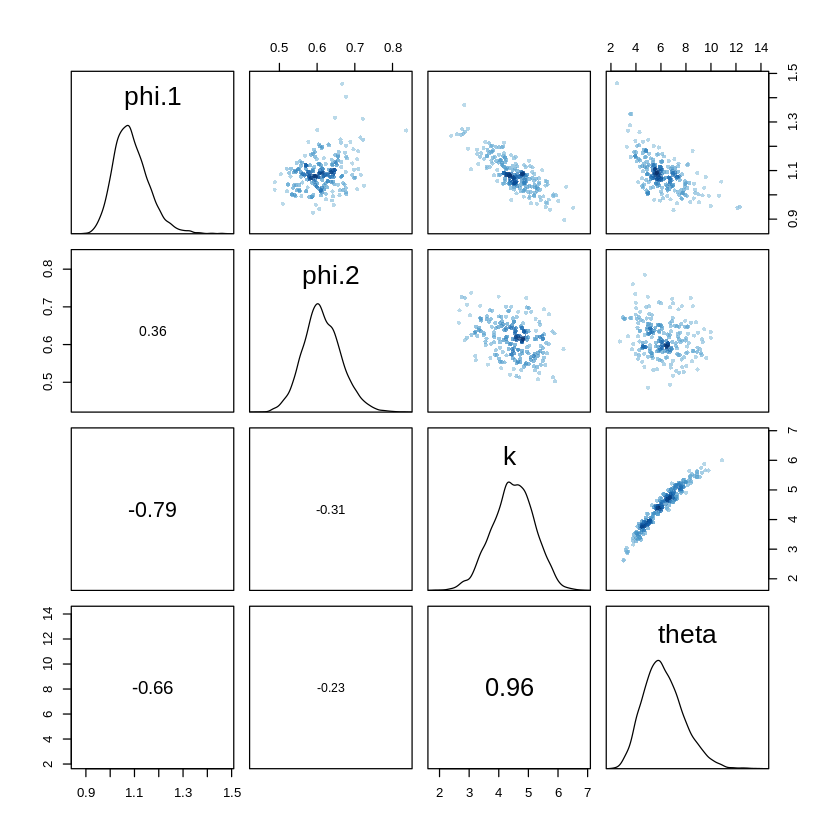

In [92]:
pairs(m16H1d)

In [10]:
compare(m16.4, m16H1d)

,WAIC,pWAIC,dWAIC,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H1d,737.4997,18.28669,0.00000,1.000000e+00,80.61694,NA
m16.4,822.7449,19.76143,85.24529,3.084751e-19,99.89749,34.7758


In [11]:
compare(m16.4, m16H1d, func=LOO)

Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”

,LOO,pLOO,dLOO,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H1d,737.8156,18.44465,0.00000,1.00000e+00,81.22314,NA
m16.4,823.1637,19.97078,85.34808,2.93022e-19,100.65122,34.82224


The gender specific model is significantly better at better out-of-sample predictions, and has a lower effective parameter even though it has an extra parameter.

In [47]:
( k <- LOOPk(m16.4) )

Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”

[1]  0.303592961  0.184980493  0.067498931  0.030358225  0.023715310
 [6]  0.093961307  0.134440878  0.701099441  0.059118055  0.034977057
[11]  0.150447486  0.828752173  0.128354518  0.314375848  0.169723122
[16]  0.143391587  0.392148097  0.261782266  0.216328461  0.147032404
[21]  0.181298825  0.011387291  0.025802641 -0.021698290  0.036896661
[26]  0.050107202  0.039071946  0.022511660  0.083191886  0.188874367
[31] -0.042812734 -0.034439935 -0.050559685  0.113690617  0.208575473
[36] -0.046651999 -0.096689759 -0.114351585 -0.113804235 -0.087420205
[41] -0.116786337  0.111443440  0.389622260 -0.108089377  0.228900770
[46]  0.977429649  0.466178846  0.195101748  0.520037517  0.260370466
[51]  0.008767752  0.150930690 -0.039072040  0.004610847 -0.083491445
[56] -0.077837419  0.023150585  0.007875767 -0.009130885  0.014603305
[61] -0.105544118 -0.101626022 -0.178117289 -0.013458783  0.075311388
[66] -0.062876127 -0.055140591  0.005350508  0.081413838  0.015681087
[71] -0.021478367  0.047732100  0.033494450  0.154979090  0.072909799
[76]  0.073114414  0.266222951  0.070202602  0.096426727  0.023670744
[81]  0.039220173  0.027206604 -0.019701535  0.076169056

In [48]:
( k <- LOOPk(m16H1d) )

Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”

[1]  0.206493523  0.064551012  0.013852691 -0.006946808 -0.010417362
 [6]  0.001713305  0.049902667  0.553963377 -0.008413620 -0.029653938
[11]  0.107301296  0.947009995  0.098956498  0.386944350  0.151784811
[16]  0.105493067  0.446727269  0.237006336  0.195228742  0.134521666
[21]  0.174422201 -0.067006796 -0.048391122 -0.113325612 -0.040996646
[26] -0.018045652 -0.038309766 -0.059812448  0.025651318  0.161814095
[31] -0.050001958 -0.039530915 -0.055712190  0.063509303  0.038295106
[36]  0.008377381 -0.067210919 -0.067435177 -0.083087187 -0.073569306
[41] -0.094025565  0.114162946  0.304652227 -0.089552958  0.188135698
[46]  0.762588753  0.355651421  0.127690983  0.393121407  0.164211772
[51]  0.041745675  0.116840808 -0.066676663  0.014199779 -0.071841930
[56] -0.018289343  0.111499781  0.037078812 -0.038961964 -0.001633574
[61] -0.049642272  0.068612885  0.029246664  0.055350451 -0.014233292
[66] -0.096810265 -0.094196344 -0.040869785 -0.106187084 -0.150977212
[71] -0.195737982 -0.125947338 -0.136138945  0.003634182 -0.087190596
[76] -0.079463662  0.114295121 -0.091067139 -0.122247468 -0.152745967
[81] -0.124594846 -0.149897721 -0.075165194  0.056053995

In [ ]:
prior <- extract.prior(m16H1d)

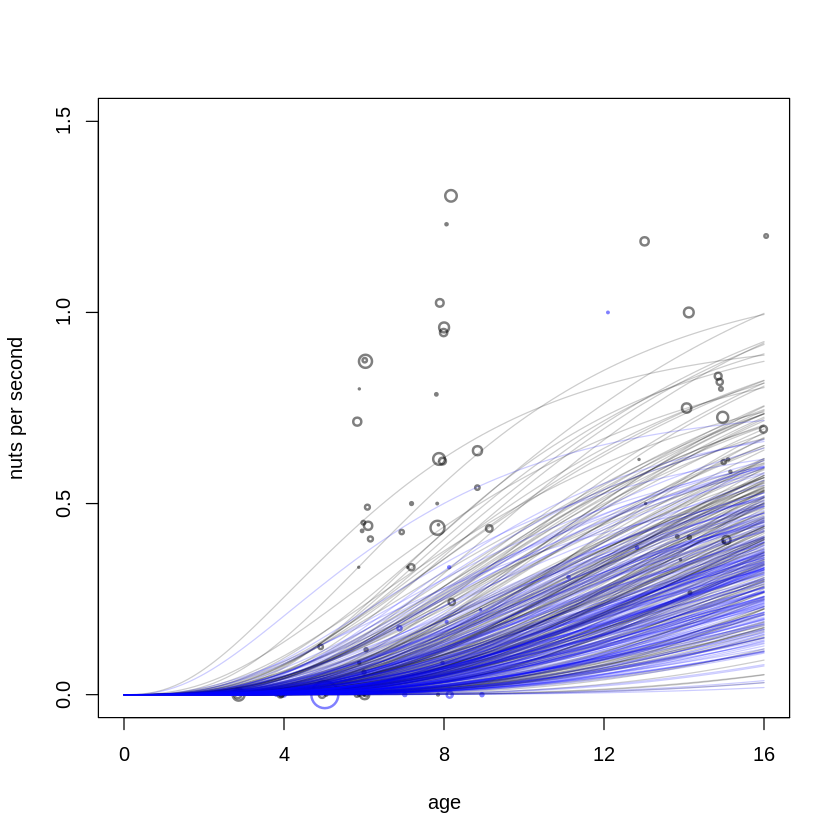

In [32]:
# prior <- extract.prior(m16H1d)

plot( NULL , xlim=c(0,1) , ylim=c(0,1.5) , xlab="age" ,
ylab="nuts per second" , xaxt="n" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
# raw data
pts <- dat_list$n / dat_list$seconds
point_size <- normalize( dat_list$seconds )
points( jitter(dat_list$age) , pts , col=ifelse(dat_list$gid==1,grau(),rangi2) , lwd=2 , cex=point_size*3 )
# 30 prior curves
for ( i in 1:200 ) with( prior , curve( phi[i,1]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("black",0.2) ) )   # For males
for ( i in 1:200 ) with( prior , curve( phi[i,2]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("blue",0.2) ) )   # For females

In [ ]:
post <- extract.samples(m16H1d)

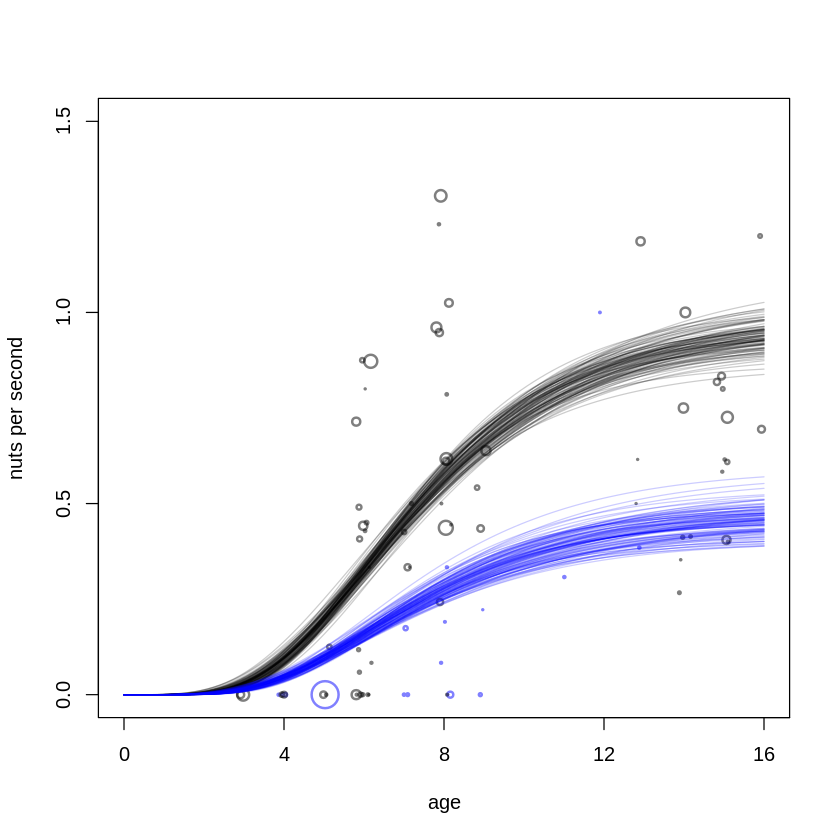

In [31]:
# post <- extract.samples(m16H1e)

plot( NULL , xlim=c(0,1) , ylim=c(0,1.5) , xlab="age" ,
ylab="nuts per second" , xaxt="n" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
# raw data
pts <- dat_list$n / dat_list$seconds
point_size <- normalize( dat_list$seconds )
points( jitter(dat_list$age) , pts , col=ifelse(dat_list$gid==1,grau(),rangi2) , lwd=2 , cex=point_size*3 )
# 30 posterior curves
for ( i in 1:100 ) with( post , curve( phi[i,1]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("black",0.2) ) )   # For males
for ( i in 1:100 ) with( post , curve( phi[i,2]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("blue",0.2) ) )   # For females

After this data-snooping, perhaps we should have increased the nutcracking ability of the males and females, i.e. set phiMu <- c(1.3, 1)?

In [41]:
dat_list <- list(
                  n = as.integer( Panda_nuts$nuts_opened ),
                  age = Panda_nuts$age / max(Panda_nuts$age),
                  gid = ifelse(Panda_nuts$sex=='m', 1L, 2L),    # Males have gid=1, females gid=2.  We define this way for simpler prior in model below.
                  phiMu = c(1.3, 1),   # We use this in phi ~ lognorm(log(phiMu), 0.1), with phiMu=1 for gid=1 (i.e. males) and phiMu=0.7 for gid=2 (i.e. females)
                  phiSD = c(0.13, 0.1 ),     # We now allow gender specific dispersions
                  seconds = Panda_nuts$seconds )

m16H1e <- ulam(
                alist(
                      n ~ poisson( lambda ),
                      lambda <- seconds*phi[gid]*(1-exp(-k*age))^theta,
                  #    phi[gid] ~ lognormal( log(1) , 0.1 ),           # The prior is the same, but allows the posterior of phi to be gender specific
                      phi[gid] ~ lognormal( log(phiMu) , phiSD ),           # This enables males to have distribution with larger mean/median phi than females.  Phi[gid] represents α * (β * M_max[gid])^θ, where males and femals have different M_max values.
                      k ~ lognormal( log(2) , 0.25 ),
                      theta ~ lognormal( log(5) , 0.25 )
                ), data=dat_list , chains=4 , cores=4
                , log_lik=TRUE, iter=2000
                )

recompiling to avoid crashing R session


In [42]:
precis(m16H1e, depth=2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi[1],1.0560126,0.07299055,0.9559413,1.1805246,913.7127,1.002165
phi[2],0.6064305,0.05094953,0.5306406,0.6899638,1849.9317,1.000782
k,4.7244858,0.73087561,3.4994441,5.8614343,772.4838,1.003426
theta,6.7106150,1.75791449,4.1570933,9.7766455,844.6535,1.002304


In [43]:
compare(m16H1e, m16H1d, m16.4)

,WAIC,pWAIC,dWAIC,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H1d,737.4997,18.28669,0.00000,1.000000e+00,80.61694,NA
m16H1e,772.6147,21.73310,35.11510,2.370576e-08,86.21485,8.957021
m16.4,822.7449,19.76143,85.24529,3.084751e-19,99.89749,34.775803


In [44]:
compare(m16H1e, m16H1d, m16.4, func=LOO)

Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”

,LOO,pLOO,dLOO,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H1d,737.8156,18.44465,0.00000,1.000000e+00,81.22314,NA
m16H1e,771.9636,21.40751,34.14800,3.844652e-08,86.38790,8.61038
m16.4,823.1637,19.97078,85.34808,2.930220e-19,100.65122,34.82224


This suggests the new data-snooped prior phiMu values are not as good as the original ones...


SAMPLING FOR MODEL '20e5722e923e958296c6f44b3e33fda2' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 4.4e-05 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.44 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.192121 seconds (Warm-up)
Chain 1:                0.154102 seconds (Sampling)


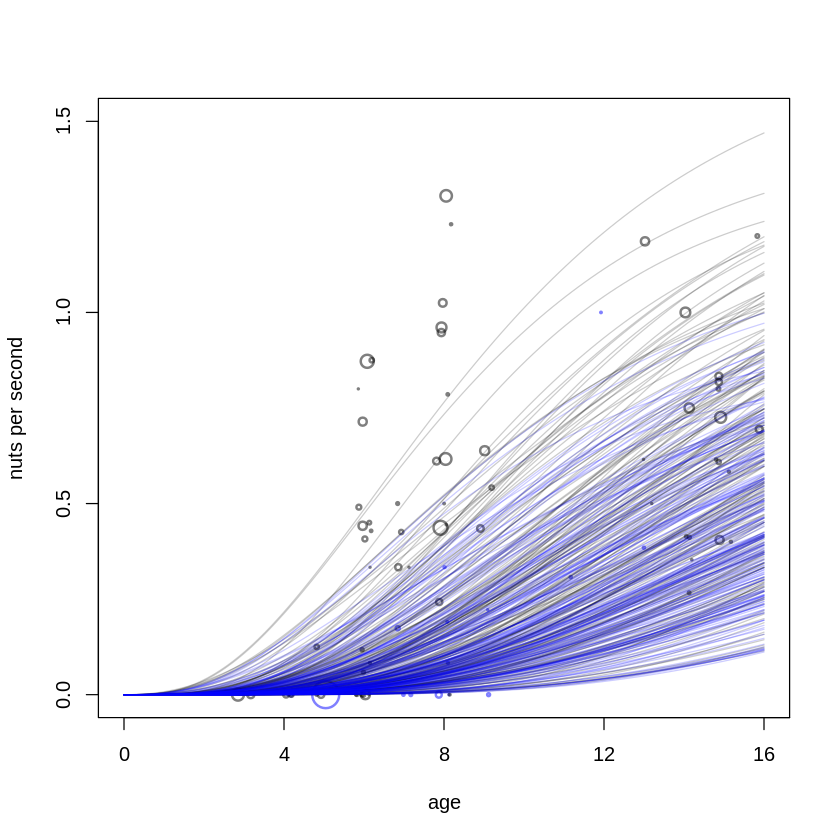

In [45]:
prior <- extract.prior(m16H1e)

plot( NULL , xlim=c(0,1) , ylim=c(0,1.5) , xlab="age" ,
ylab="nuts per second" , xaxt="n" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
# raw data
pts <- dat_list$n / dat_list$seconds
point_size <- normalize( dat_list$seconds )
points( jitter(dat_list$age) , pts , col=ifelse(dat_list$gid==1,grau(),rangi2) , lwd=2 , cex=point_size*3 )
# 30 prior curves
for ( i in 1:200 ) with( prior , curve( phi[i,1]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("black",0.2) ) )   # For males
for ( i in 1:200 ) with( prior , curve( phi[i,2]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("blue",0.2) ) )   # For females

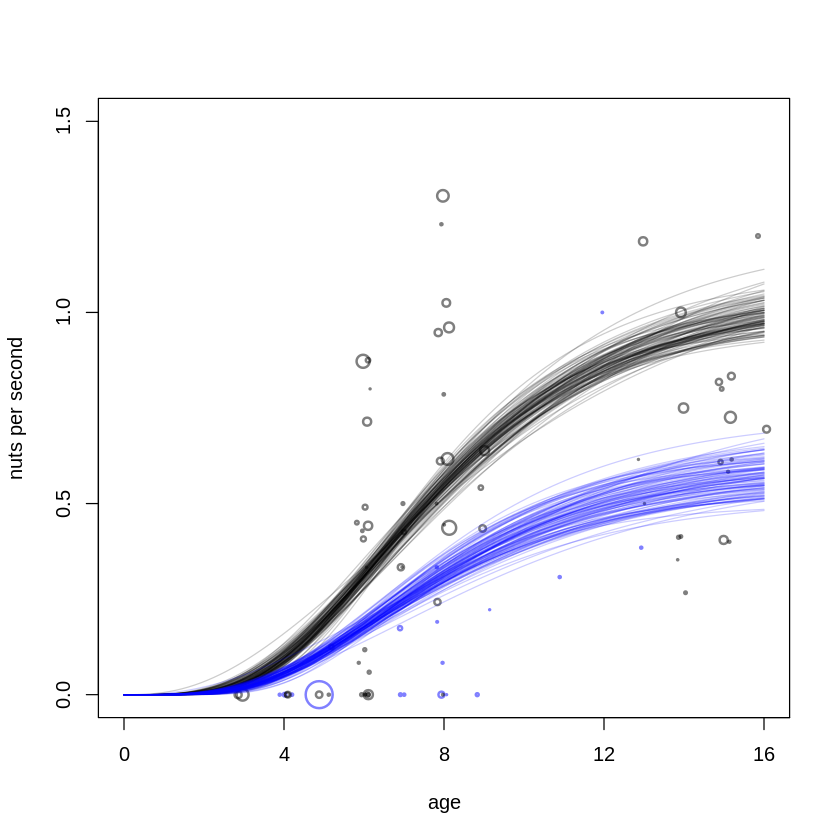

In [46]:
post <- extract.samples(m16H1e)

plot( NULL , xlim=c(0,1) , ylim=c(0,1.5) , xlab="age" ,
ylab="nuts per second" , xaxt="n" )
at <- c(0,0.25,0.5,0.75,1,1.25,1.5)
axis( 1 , at=at , labels=round(at*max(Panda_nuts$age)) )
# raw data
pts <- dat_list$n / dat_list$seconds
point_size <- normalize( dat_list$seconds )
points( jitter(dat_list$age) , pts , col=ifelse(dat_list$gid==1,grau(),rangi2) , lwd=2 , cex=point_size*3 )
# 30 posterior curves
for ( i in 1:100 ) with( post , curve( phi[i,1]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("black",0.2) ) )   # For males
for ( i in 1:100 ) with( post , curve( phi[i,2]*(1-exp(-k[i]*x))^theta[i] , add=TRUE , col=col.alpha("blue",0.2) ) )   # For females

16H2

I disagree with the book's definition (section 16.3.1 on page 535) of k as: "k is a parameter that measures the rate of skill gain with age."

k is a rate parameter associating age of chimpanzee with mass, so k in effective determines how quickly chimpanzees mature.

We choose to vary this parameter by chimpanzee, because it is reasonably intuitive to believe that different chimps will mature at different rates, and also because it has a clearer physical meaning than compared to phi, which corresponds to the combination of several parameters (phi = α * ( β * M_max )^θ).

Note that we build on the previous question by keeping the gender dependence of phi, which led to better predictive power (as measured in LOO / WAIC scores) compared to the gender blind phi.

In [53]:
sort(unique(Panda_nuts$chimpanzee))

[1]  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22

In [83]:
data(Panda_nuts)

dat_list <- list(
                  id = Panda_nuts$chimpanzee,
                  n = as.integer( Panda_nuts$nuts_opened ),
                  age = Panda_nuts$age / max(Panda_nuts$age),
                  gid = ifelse(Panda_nuts$sex=='m', 1L, 2L),    # Males have gid=1, females gid=2.  We define this way for simpler prior in model below.
                  phiMu = c(1, 0.7),   # We use this in phi ~ lognorm(log(phiMu), 0.1), with phiMu=1 for gid=1 (i.e. males) and phiMu=0.7 for gid=2 (i.e. females)
                  seconds = Panda_nuts$seconds )

In [59]:
m16H2 <- ulam(
                alist(
                      n ~ poisson( lambda ),
                      lambda <- seconds*phi[gid]*(1-exp(-k[id]*age))^theta,
                    
#                      phi[gid] ~ lognormal( log(1) , 0.1 ),           # The prior is the same, but allows the posterior of phi to be gender specific
                      phi[gid] ~ lognormal( log(phiMu) , 0.1 ),        # This enables males to have distribution with larger mean/median phi than females.  Phi[gid] represents α * (β * M_max[gid])^θ, where males and femals have different M_max values.
                      theta ~ lognormal( log(5) , 0.25 ),
#                      k ~ lognormal( log(2) , 0.25 ),                 # This suggests log(k) has normal(log(2), 0.25) dist
                      k[id] ~ lognormal( log(k_bar) , k_sd ),          # Partial pooling: log(k[id]) ~ normal(log(k_bar, k_sd)
                      k_bar ~ lognormal( log(2), 1 ),                # log(k_bar) ~ normal(log(2), 0.2) 
                      k_sd ~ exponential(1)
                    
                ), data=dat_list , chains=4 , cores=4
                , log_lik=TRUE, iter=4000
                )

In [60]:
precis(m16H2, depth=2) #, pars=c("phi", "k_bar", "k_sd", "theta"))

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi[1],0.9812710,0.07647217,0.8675883,1.1102390,2056.4620,1.0012210
phi[2],0.7018878,0.06780323,0.5997236,0.8150862,5398.8246,1.0004936
theta,5.7860046,1.38161677,3.8603050,8.1916223,816.9851,1.0045274
k[1],1.8857334,0.87665290,0.6191418,3.3987394,1782.4086,1.0021594
k[2],2.8209771,0.78768113,1.7268473,4.0840993,1924.1929,1.0011062
k[3],2.5996986,0.61418177,1.6519485,3.6349412,1321.4097,1.0017946
k[4],1.8253315,0.59085468,0.9545006,2.8337735,1416.0164,1.0018111
k[5],3.9159364,4.20839023,1.9940098,7.4516519,1777.1989,1.0019524
k[6],4.6753107,6.28674277,2.7705760,8.4209963,1648.9850,1.0011529


In [61]:
precis(m16H1d, depth=2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi[1],1.0870113,0.07284483,0.9857235,1.2110925,2127.388,1.001738
phi[2],0.6137704,0.05075940,0.5371732,0.6991728,3231.499,1.000949
k,4.4844305,0.70930908,3.3338431,5.5976355,1876.503,1.001923
theta,6.2233481,1.61745749,3.9205941,9.0415499,2068.708,1.001395


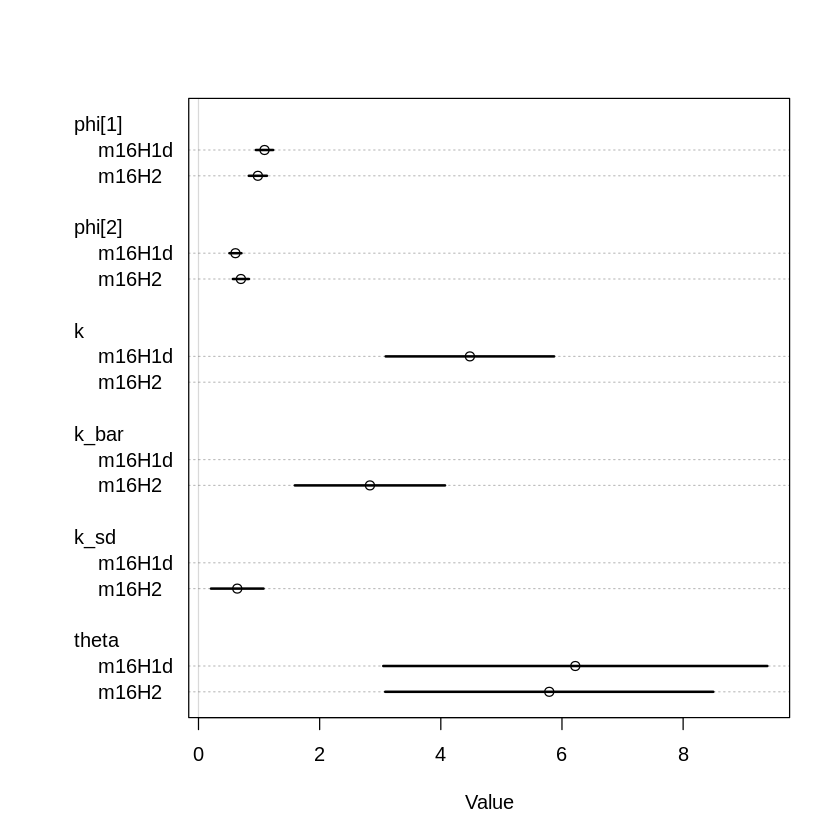

In [62]:
plot(coeftab(m16H2, m16H1d), par=c("phi[1]", "phi[2]", "k", "k_bar", "k_sd", "theta"))

In [64]:
compare(m16H1d, m16H2)

,WAIC,pWAIC,dWAIC,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H2,479.1481,27.34348,0.0000,1.000000e+00,40.14150,NA
m16H1d,777.6351,22.32012,298.4871,1.528817e-65,86.45004,76.70844


In [65]:
compare(m16H1d, m16H2, func=LOO)

Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”Warning message in log(z):
“NaNs produced”

,LOO,pLOO,dLOO,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H2,488.4888,32.01385,0.0000,1.000000e+00,40.99014,NA
m16H1d,777.7076,22.35637,289.2188,1.573711e-63,86.92680,76.96596


The big story of partial pooling of k is the big change between the non-multilevel model version of k ~ 4.5 (model m16H1d) and the multilevel model with parial pooling with k_bar ~ 2.8.  I don't understand why it's so different - see the different distributions below.  The only thing is that partial pooling allows better regularization.  The estimates of k and k_bar are sensitive to the sd of their priors, but the most recent runs of long iterations (=4000) suggests that when you take into account the posterior sd, the parameter estimates do overlap somewhat, so the difference is not necessarily that significant (look at the precis(coeftab()) code above to compare k and k_bar).

The predictive ability of the multilevel model is much better than the non-multilevel model as measured by WAIC and LOO.

The reason that k_bar can be lower than most of the individual k[id]'s is due to the positive skewness of the lognormal distribution (see below):

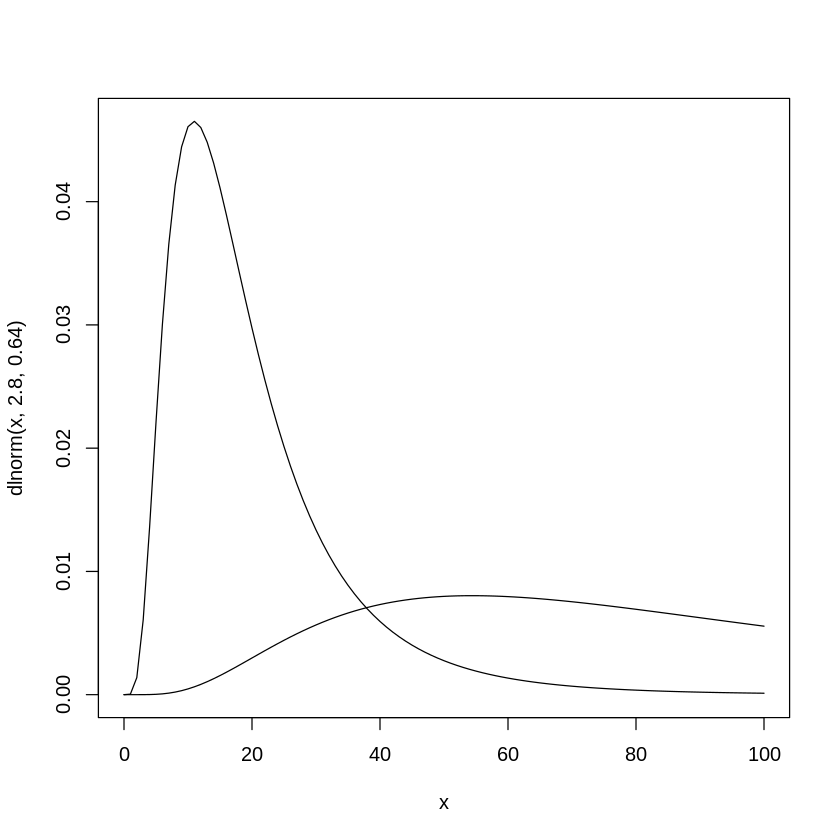

In [63]:
# N <- 1e5
# k <- rlnorm( N , log(2), 0.25 )
# dens(k)

# analytical calculation
curve( dlnorm( x , 2.8 , 0.64 ) , from=0 , to=100 )

curve( dlnorm( x , 4.5 , 0.71 ) , add=TRUE )

In [68]:
m16H2phi <- ulam(
                alist(
                      n ~ poisson( lambda ),
                      lambda <- seconds*phi[id]*(1-exp(-k*age))^theta,
                    
#                      phi ~ lognormal( log(1) , 0.1 ),           # The prior is the same, but allows the posterior of phi to be gender specific
                      phi[id] ~ lognormal( log(phi_bar) , phi_sd ),    # Partial pooling
                      phi_bar ~ lognormal( log(1), 0.1 ),
                      phi_sd ~ exponential(10),
                      theta ~ lognormal( log(5) , 0.25 ),
                      k ~ lognormal( log(2) , 0.25 )
                    
                ), data=dat_list , chains=4 , cores=4
                , log_lik=TRUE
                )

recompiling to avoid crashing R session


In [70]:
precis(m16H2phi, depth=2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi[1],0.5805805,0.40747362,0.14201622,1.3436353,2016.6736,1.002515
phi[2],0.7047451,0.35416102,0.25831233,1.3161908,1155.9625,1.001279
phi[3],0.5358825,0.23589582,0.23649010,0.9578349,927.6998,1.001835
phi[4],0.3713365,0.20860975,0.11563278,0.7299486,1068.3480,1.001370
phi[5],1.1639844,0.45190835,0.56950574,1.9681963,1353.6296,1.001883
phi[6],1.4295207,0.25655238,1.05545637,1.8641594,458.3989,1.004249
phi[7],0.4705089,0.20841073,0.20303124,0.8643807,950.9776,1.001242
phi[8],0.8671569,0.41301370,0.36613517,1.5783519,1591.8841,1.001026
phi[9],3.8982079,0.92156601,2.54845942,5.5081199,321.2362,1.005744


In [77]:
precis(m16.4)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi,0.8680025,0.0408919,0.8055999,0.9352304,2540.475,1.001652
k,5.9316360,0.5702760,5.0066582,6.8688602,2292.099,1.000623
theta,9.7131188,2.0425713,6.7947866,13.3370758,2418.657,1.000530


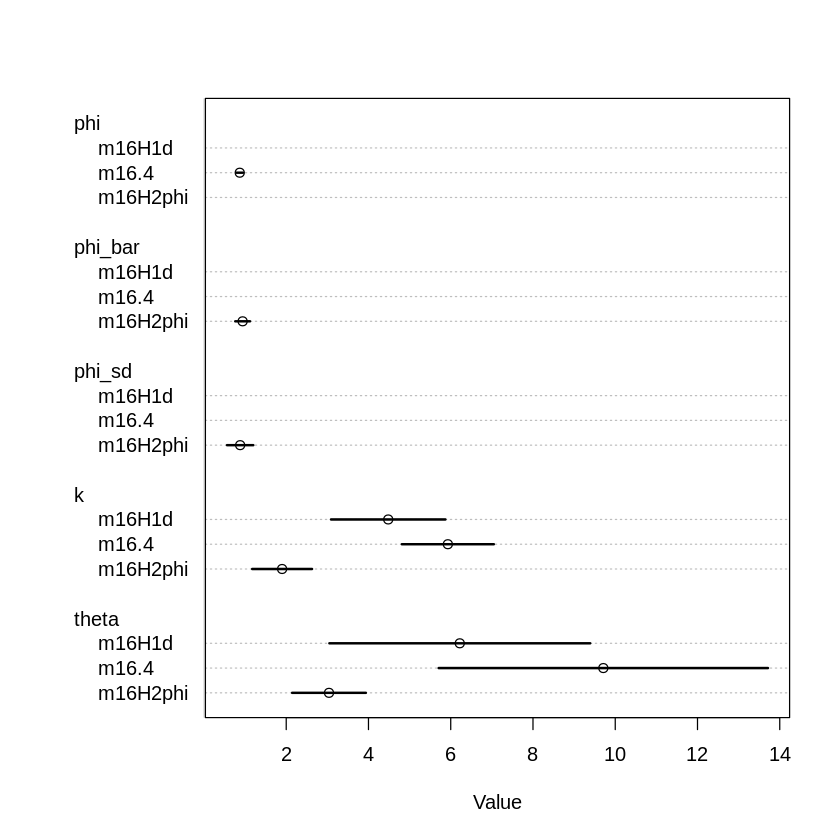

In [81]:
plot(coeftab(m16H2phi, m16.4, m16H1d), par=c("phi", "phi_bar", "phi_sd", "k", "theta"))

Note that the k here is more similar to the multilevel model m16H2.

Why don't we try partial pooling for both phi and k..?

In [88]:
m16H2both <- ulam(
                alist(
                      n ~ poisson( lambda ),
                      lambda <- seconds*phi[id]*(1-exp(-k[id]*age))^theta,
                    
#                      phi ~ lognormal( log(1) , 0.1 ),           # The prior is the same, but allows the posterior of phi to be gender specific
                      phi[id] ~ lognormal( log(phi_bar) , phi_sd ),    # Partial pooling
                      phi_bar ~ lognormal( log(1), 0.1 ),
                      phi_sd ~ exponential(10),
                      theta ~ lognormal( log(5) , 0.25 ),
#                      k ~ lognormal( log(2) , 0.25 ),                 # This suggests log(k) has normal(log(2), 0.25) dist
                      k[id] ~ lognormal( log(k_bar) , k_sd ),          # Partial pooling: log(k[id]) ~ normal(log(k_bar, k_sd)
                      k_bar ~ lognormal( log(2), 1 ),                # log(k_bar) ~ normal(log(2), 0.2) 
                      k_sd ~ exponential(1)
                    
                ), data=dat_list , chains=4 , cores=4
                , log_lik=TRUE, iter=4000
                , control=list(adapt_delta=0.99, max_treedepth=20)
                )

recompiling to avoid crashing R session
Warning message:
“There were 36 divergent transitions after warmup. Increasing adapt_delta above 0.99 may help. See
http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”Warning message:
“There were 4 chains where the estimated Bayesian Fraction of Missing Information was low. See
http://mc-stan.org/misc/warnings.html#bfmi-low”Warning message:
“Examine the pairs() plot to diagnose sampling problems
”

In [93]:
precis(m16H2both)

44 vector or matrix parameters hidden. Use depth=2 to show them.


,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
phi_bar,0.96945545,0.07787179,0.85210902,1.1007465,1065.0669,1.003327
phi_sd,0.09924372,0.07631501,0.01060753,0.2391569,174.4971,1.033846
theta,5.69201535,1.32539257,3.86277902,8.0329741,868.0920,1.004115
k_bar,2.68489265,0.63113338,1.74207855,3.7277008,1215.8966,1.001464
k_sd,0.67142370,0.22334523,0.40434995,1.0712814,658.4767,1.007197


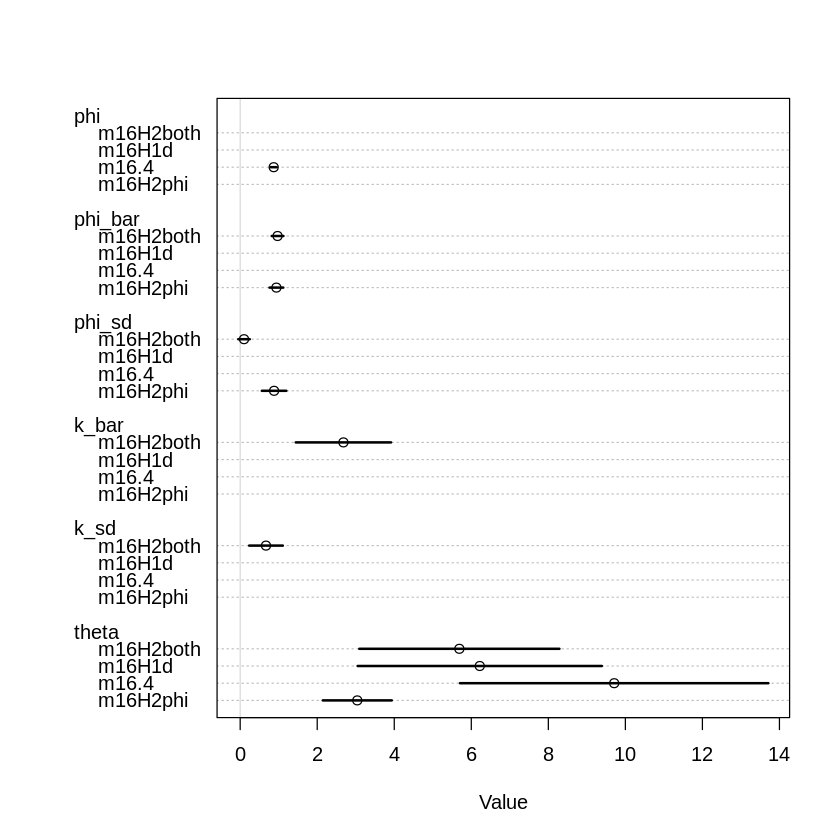

In [90]:
plot(coeftab(m16H2phi, m16.4, m16H1d, m16H2both), par=c("phi", "phi_bar", "phi_sd", "k_bar", "k_sd", "theta"))

16H3

In [ ]:
library(rethinking)
options(mc.cores = parallel::detectCores())
data(Lynx_Hare)

dat_ar1 <- list(
                L = Lynx_Hare$Lynx[2:21],
                L_lag1 = Lynx_Hare$Lynx[1:20],
                H = Lynx_Hare$Hare[2:21],
                H_lag1 = Lynx_Hare$Hare[1:20] )

dat_ar1

In [6]:
m16H3 <- ulam(
                alist(
                    L ~ lognormal( log(mu_L), sigma_L ),
                    H ~ lognormal( log(mu_H), sigma_H ),
                    mu_L  <- a_L + b_LL * L_lag1 + b_LH * H_lag1,
                    mu_H  <- a_H + b_HH * H_lag1 - minus_b_HL * L_lag1,
#                     c(a_L, a_H) ~ exponential( 10 ),     # a_L and a_H are the values of mu_L and mu_H if there were no L_lag1 and H_lag1 (i.e. no Lynx of Hares in the previous time period).  One would think the a_H and a_L should therefore be 0, unless we have migration into the area.  Clearly, though should be positive, bounded below by 0.
                    c(a_L, a_H) ~ lognormal( log(0.1), 0.5 ),     # a_L and a_H are the values of mu_L and mu_H if there were no L_lag1 and H_lag1 (i.e. no Lynx of Hares in the previous time period).  One would think the a_H and a_L should therefore be 0, unless we have migration into the area.  Clearly, though should be positive, bounded below by 0.
#                     c(b_LL, b_HH, b_LH) ~ lognormal(log(1), 1),    # b_LL and b_HH must be positive otherwise would have oscillation every period.  b_LH is likely to be positive as an increase in hares should cause a lagged increase in lynx.
                    c(b_LL, b_HH) ~ lognormal(log(1), 1),    # b_LL and b_HH must be positive otherwise would have oscillation every period.
#                     b_HL ~ normal(0, 1),            # These may be negative as more Lynx should lead to a reduction in Hares.
#                     b_LH ~ normal(0, 1),            # Let the data decide this relationship...
                    minus_b_HL ~ lognormal(log(2), 1),   # This is negative as more Lynx should lead to a reduction in Hares.  Cannot do -(b_HL), so rename parameter minus_b_HL and assume it's positive, so use -ve operator on this parameter in the link function
                    b_LH ~ lognormal(log(0.5), 1),    # 
                    
                    sigma_L ~ exponential(0.5),
                    sigma_H ~ exponential(0.5)
                )
                , data=dat_ar1, chains=4, cores=4
                , log_lik=TRUE
                , control=list(adapt_delta=0.99)
            )

In [7]:
precis(m16H3)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a_H,0.1188908,0.06609186,0.04497598,0.2416667,2082.8620,0.9989385
a_L,0.1101125,0.06393219,0.04176475,0.2182564,1607.1872,0.9991287
b_HH,1.2281913,0.15599606,1.00273439,1.4997968,1167.5432,1.0016805
b_LL,0.4987369,0.09160151,0.36099212,0.6452319,1217.1692,0.9995400
minus_b_HL,0.2204318,0.08125185,0.09698619,0.3561149,987.9983,1.0000187
b_LH,0.2357741,0.04642574,0.16635891,0.3151694,1237.2567,1.0000786
sigma_L,0.3241256,0.05676925,0.24833177,0.4226835,1366.7895,1.0017004
sigma_H,0.4649078,0.08225628,0.35342151,0.6104839,1575.2544,1.0013095


minus_b_HL is +ve, so b_HL is -ve, i.e. b_HL = 0.23 here.

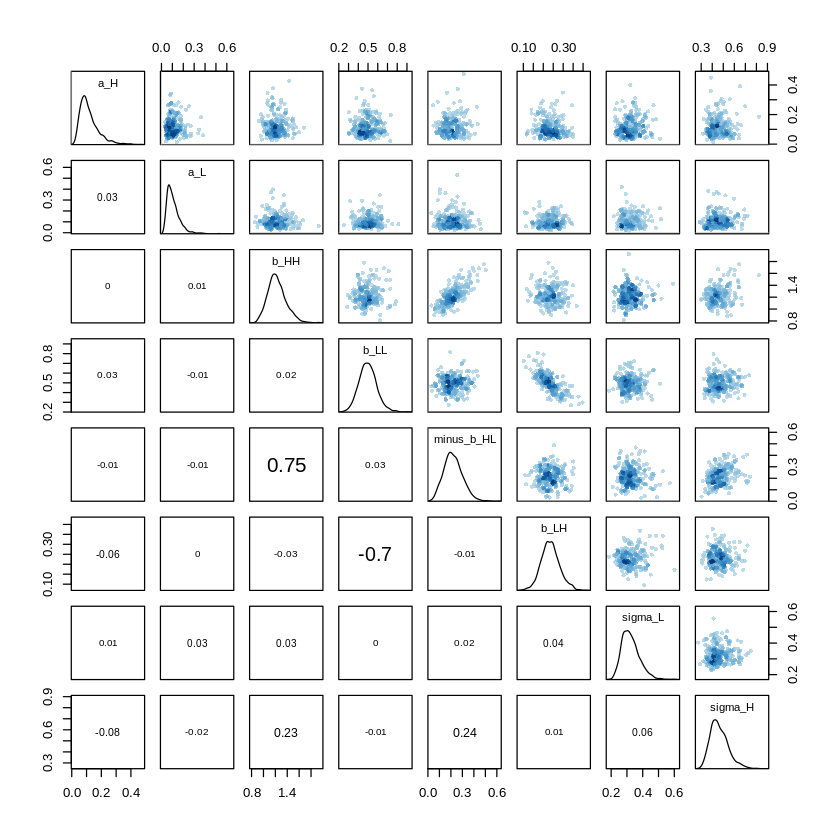

In [8]:
pairs(m16H3)

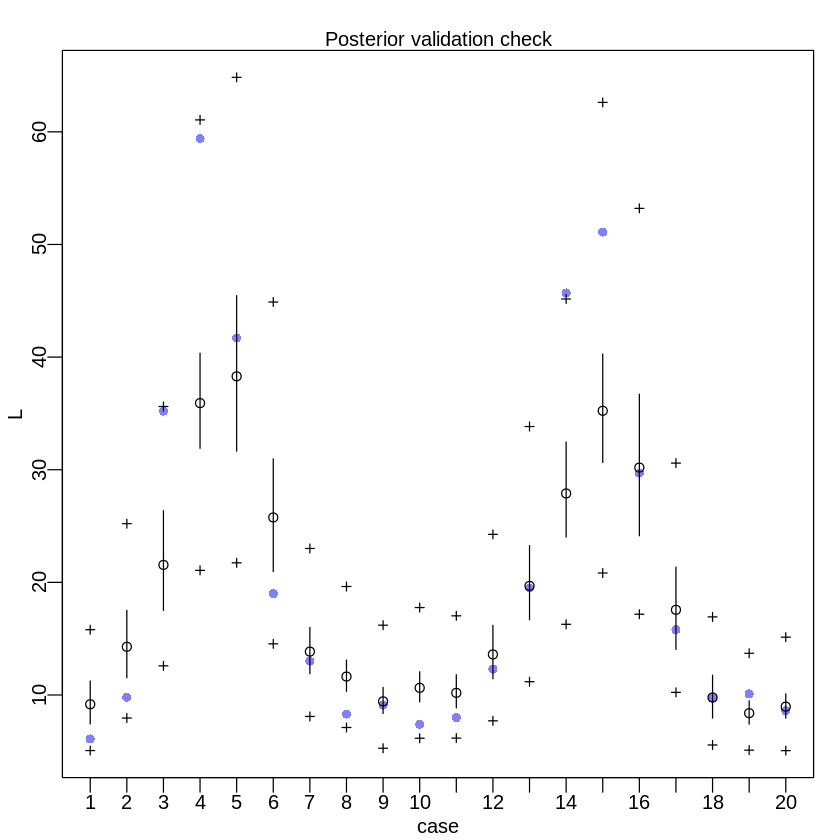

In [9]:
postcheck(m16H3)

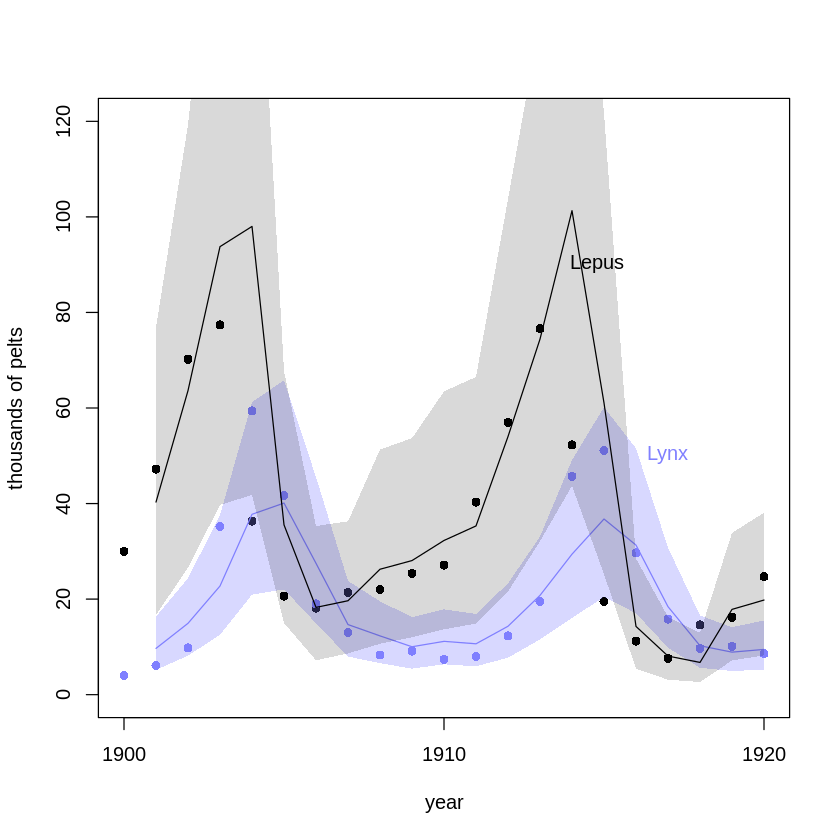

In [10]:
post <- extract.samples(m16H3)

# sim <- sim( m16H3 , data=list(H_lag1=dat_ar1$H_lag1, L_lag1=dat_ar1$L_lag1) )   # Not sure how to get both H and L from this
link <- link( m16H3 , data=list(H_lag1=dat_ar1$H_lag1, L_lag1=dat_ar1$L_lag1) )   # This gives mu_L and mu_H, but not sigma_L and sigma_H, so need to get these from post instead.

N <- length(post$sigma_L)
M <- length(link$mu_L)/ N

L_dat <- matrix(nrow=N, ncol=M)
H_dat <- matrix(nrow=N, ncol=M)

for (col in 1:M) {
    L_dat[, col] <- rlnorm(N, log(link$mu_L[,col]), post$sigma_L)
    H_dat[, col] <- rlnorm(N, log(link$mu_H[,col]), post$sigma_H)
}



L_mean <- apply( L_dat , 2 , mean )
L_CI <- apply( L_dat , 2 , PI )
H_mean <- apply( H_dat , 2 , mean )
H_CI <- apply( H_dat , 2 , PI )

pelts = Lynx_Hare[,2:3]
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

lines( 2:21 , L_mean, col=rangi2 )
shade( L_CI , 2:21 , col=col.alpha(rangi2, 0.3) )
lines( 2:21 , H_mean )
shade( H_CI , 2:21 )

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

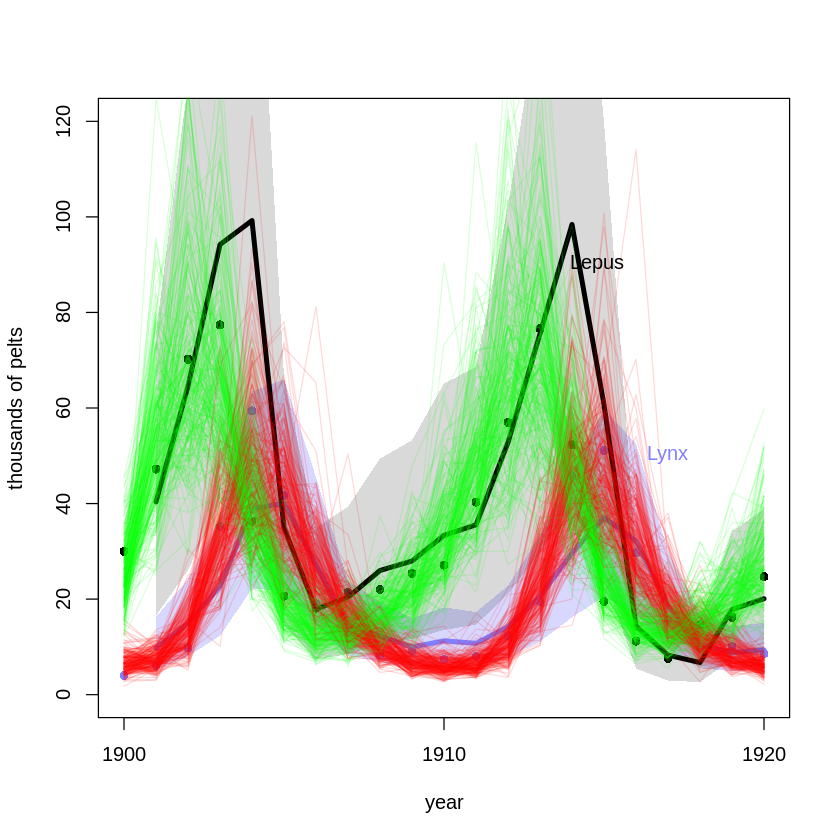

In [11]:
post_m16.5 <- extract.samples(m16.5)

post <- extract.samples(m16H3)
link <- link( m16H3 , data=list(H_lag1=dat_ar1$H_lag1, L_lag1=dat_ar1$L_lag1) )   # This gives mu_L and mu_H, but not sigma_L and sigma_H, so need to get these from post instead.
N <- length(post$sigma_L)
M <- length(link$mu_L)/ N
L_dat <- matrix(nrow=N, ncol=M)
H_dat <- matrix(nrow=N, ncol=M)
for (col in 1:M) {
    L_dat[, col] <- rlnorm(N, log(link$mu_L[,col]), post$sigma_L)
    H_dat[, col] <- rlnorm(N, log(link$mu_H[,col]), post$sigma_H)
}
L_mean <- apply( L_dat , 2 , mean )
L_CI <- apply( L_dat , 2 , PI )
H_mean <- apply( H_dat , 2 , mean )
H_CI <- apply( H_dat , 2 , PI )

pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# The AR(1) model
lines( 2:21 , L_mean, col=rangi2 ,lwd=4 )
shade( L_CI , 2:21 , col=col.alpha(rangi2, 0.3) )
lines( 2:21 , H_mean, lwd=4 )
shade( H_CI , 2:21 )

# The Lotka-Volterra model
for ( s in 1:250 ) {
    lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.15) , lwd=1 )
    lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("red",0.15) , lwd=1 )
}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

The Lokta-Volterra model appears to be a leading model, whereas (unsurprisingly) the AR(1) tends to lag the data.

Perhaps there is less variation / uncertainty in the L-K model as judged by comparing the shaded regions with the spread of the posterior prediction lines, but it's not quite a fair test because of the different representation (89% CI shaded region vs lines).

The L-V model seems to be a better model for prediction the future than the AR(1) model that tends to track the past, but the non-linear L-V model is more complicated and I'm guessing probably harder to estimate (in terms of convergence to the posterior???) than the linear AR(1) model.



In [42]:
compare(m16.5, m16H3gq)

Warning message in compare(m16.5, m16H3gq):
“Not all model fits of same class.
This is usually a bad idea, because it implies they were fit by different algorithms.
Check yourself, before you wreck yourself.”

Error in check_pars(allpars, pars) : no parameter log_lik


ERROR: Error in check_pars(allpars, pars): no parameter log_lik


In [ ]:
compare(m16.5, m16H3gq, func=LOO)

In [28]:
# Try using generated quantities to calculate the predicted pelts in ulam

library(rethinking)
options(mc.cores = parallel::detectCores())
data(Lynx_Hare)

dat_ar1gq <- list(                
                L = Lynx_Hare$Lynx[2:21],
                L_lag1 = Lynx_Hare$Lynx[1:20],
                H = Lynx_Hare$Hare[2:21],
                H_lag1 = Lynx_Hare$Hare[1:20] ,
                R = length(Lynx_Hare$Hare[1:20])
                )

m16H3gq <- ulam(
      alist(
          L ~ lognormal( log(mu_L), sigma_L ),
          H ~ lognormal( log(mu_H), sigma_H ),
   
          # Cannot define mu_L and mu_H as gq> (generated quantities) as parser error occurs...
          transpars> mu_L  <- a_L + b_LL * L_lag1 + b_LH * H_lag1,
          transpars> mu_H  <- a_H + b_HH * H_lag1 - minus_b_HL * L_lag1,
          
#          c(a_L, a_H) ~ exponential( 10 ),     # a_L and a_H are the values of mu_L and mu_H if there were no L_lag1 and H_lag1 (i.e. no Lynx of Hares in the previous time period).  One would think the a_H and a_L should therefore be 0, unless we have migration into the area.  Clearly, though should be positive, bounded below by 0.
          c(a_L, a_H) ~ lognormal( log(0.1), 0.5 ),     # a_L and a_H are the values of mu_L and mu_H if there were no L_lag1 and H_lag1 (i.e. no Lynx of Hares in the previous time period).  One would think the a_H and a_L should therefore be 0, unless we have migration into the area.  Clearly, though should be positive, bounded below by 0.
#          c(b_LL, b_HH, b_LH) ~ lognormal(log(1), 1),    # b_LL and b_HH must be positive otherwise would have oscillation every period.  b_LH is likely to be positive as an increase in hares should cause a lagged increase in lynx.
          c(b_LL, b_HH) ~ lognormal(log(1), 1),    # b_LL and b_HH must be positive otherwise would have oscillation every period.
#          b_HL ~ normal(0, 1),            # These may be negative as more Lynx should lead to a reduction in Hares.
#          b_LH ~ normal(0, 1),            # Let the data decide this relationship...
          minus_b_HL ~ lognormal(log(2), 1),   # This is negative as more Lynx should lead to a reduction in Hares.  Cannot do -(b_HL), so rename parameter minus_b_HL and assume it's positive, so use -ve operator on this parameter in the link function
          b_LH ~ lognormal(log(0.5), 1),    # 

          sigma_L ~ exponential(0.5),
          sigma_H ~ exponential(0.5),
          
          gq> vector[R]:pelts_pred_L <- lognormal_rng( log(mu_L[i]), sigma_L ),
          gq> vector[R]:pelts_pred_H <- lognormal_rng( log(mu_H[i]), sigma_H )
      )
      , data=dat_ar1gq, chains=4, cores=4
      , log_lik=TRUE
      , control=list(adapt_delta=0.99)
)

In [18]:
precis(m16H3gq, 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a_H,0.1194164,0.06439379,0.04629622,0.2348624,1605.495,1.0001721
a_L,0.1118983,0.06455355,0.04270994,0.2158095,1106.427,1.0017658
b_HH,1.2281880,0.14941281,1.01772256,1.4880981,1180.984,1.0018025
b_LL,0.5043535,0.08720693,0.37520017,0.6477924,1150.570,0.9999848
minus_b_HL,0.2222425,0.07819445,0.10917032,0.3591425,1070.214,1.0041455
b_LH,0.2325775,0.04598355,0.16355041,0.3090993,1406.129,0.9984269
sigma_L,0.3237865,0.05641565,0.24631542,0.4229760,1447.817,0.9991469
sigma_H,0.4661583,0.08514633,0.35318016,0.6171616,1332.138,1.0014258
pelts_pred_H[1],41.1181577,23.48220317,16.73085120,78.1024184,1548.372,1.0019561


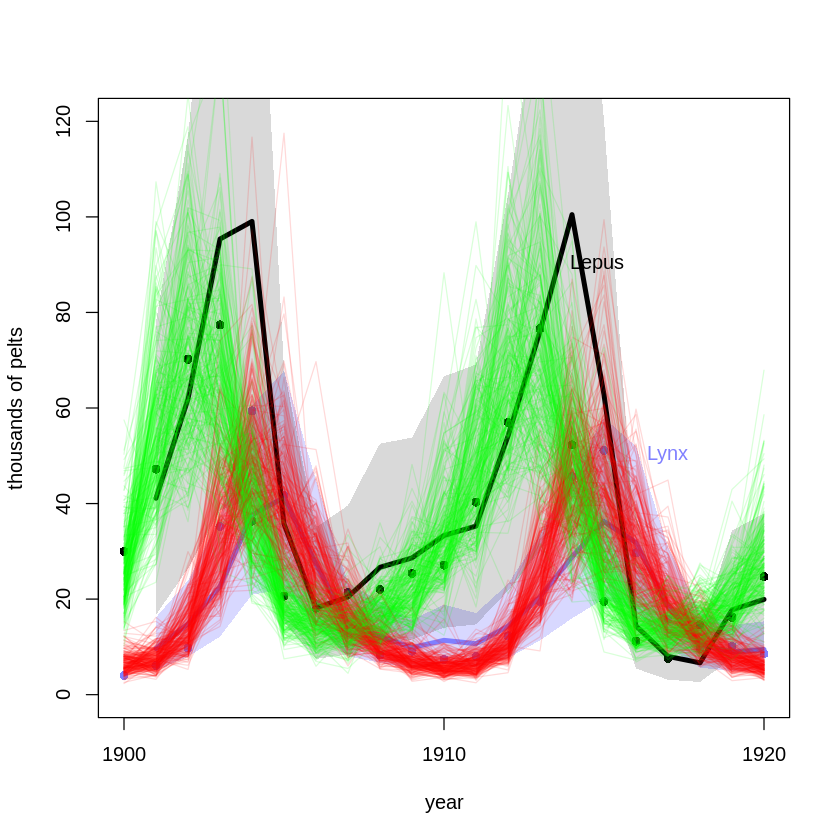

In [17]:
post_m16.5 <- extract.samples(m16.5)

post <- extract.samples(m16H3gq)

# Now the mu are generated in the posterior because we defined them as transpars> (perhaps it would be better to define as gq> if possible)
#link <- link( m16H3gq , data=list(H_lag1=dat_ar1gq$H_lag1, L_lag1=dat_ar1gq$L_lag1), R=dat_ar1gq$R )   # This gives mu_L and mu_H, but not sigma_L and sigma_H, so need to get these from post instead.
# N <- length(post$sigma_L)
# M <- length(post$mu_L)/ N
# L_dat <- matrix(nrow=N, ncol=M)
# H_dat <- matrix(nrow=N, ncol=M)
# for (col in 1:M) {
#     L_dat[, col] <- rlnorm(N, log(link$mu_L[,col]), post$sigma_L)
#     H_dat[, col] <- rlnorm(N, log(link$mu_H[,col]), post$sigma_H)
# }
# L_mean <- apply( L_dat , 2 , mean )
# L_CI <- apply( L_dat , 2 , PI )
# H_mean <- apply( H_dat , 2 , mean )
# H_CI <- apply( H_dat , 2 , PI )

L_mean <- apply( post$pelts_pred_L , 2 , mean )
L_CI <- apply( post$pelts_pred_L , 2 , PI )
H_mean <- apply( post$pelts_pred_H , 2 , mean )
H_CI <- apply( post$pelts_pred_H , 2 , PI )

pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# The AR(1) model
lines( 2:21 , L_mean, col=rangi2 ,lwd=4 )
shade( L_CI , 2:21 , col=col.alpha(rangi2, 0.3) )
lines( 2:21 , H_mean, lwd=4 )
shade( H_CI , 2:21 )

# The Lotka-Volterra model
for ( s in 1:250 ) {
    lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.15) , lwd=1 )
    lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("red",0.15) , lwd=1 )
}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

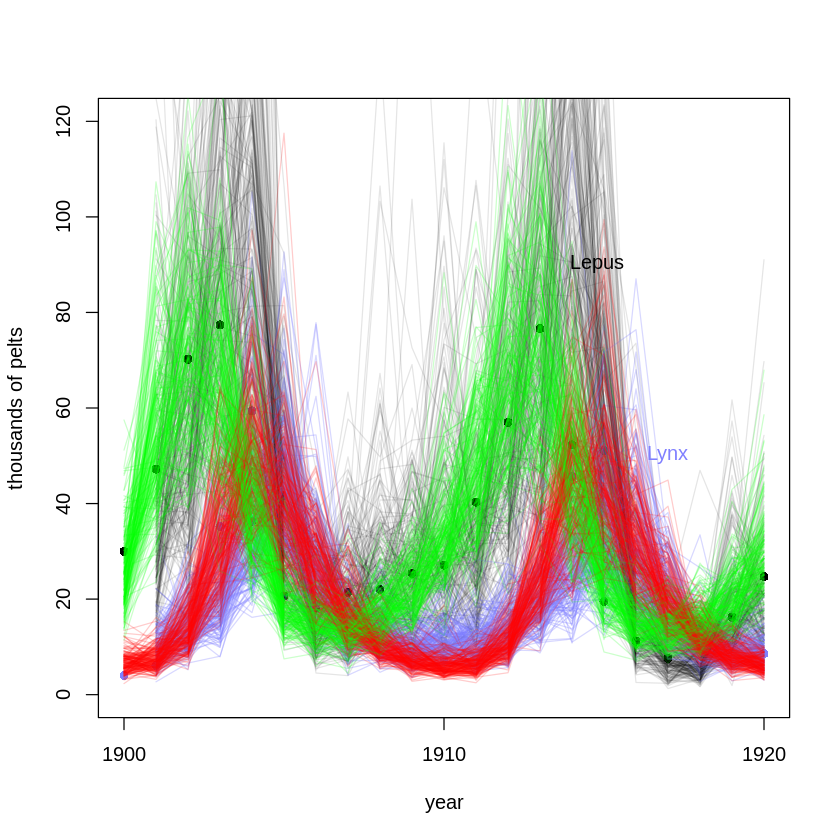

In [40]:
# Lines version of the AR(1) model above, i.e. without mean and shaded CI regions

post_m16.5 <- extract.samples(m16.5)

post <- extract.samples(m16H3gq)

pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# The AR(1) model
for ( s in 1:200 ) {
    lines( 2:21 , post$pelts_pred_L[s,] , col=col.alpha(rangi2,0.3) , lwd=1 )
    lines( 2:21 , post$pelts_pred_H[s,] , col=col.alpha(grau(),0.1) , lwd=1 )
}


# The Lotka-Volterra model
for ( s in 1:200 ) {
    lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.2) , lwd=1 )
    lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("red",0.2) , lwd=1 )
}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

16H4

In [8]:
library(rethinking)
options(mc.cores = parallel::detectCores())
data(Lynx_Hare)

dat_ar2 <- list(                
                L = Lynx_Hare$Lynx[3:21],
                L_lag1 = Lynx_Hare$Lynx[2:20],
                L_lag2 = Lynx_Hare$Lynx[1:19],
                H = Lynx_Hare$Hare[3:21],
                H_lag1 = Lynx_Hare$Hare[2:20] ,
                H_lag2 = Lynx_Hare$Hare[1:19] ,
                R = 19L
                )

dat_ar2

$L
 [1]  9.8 35.2 59.4 41.7 19.0 13.0  8.3  9.1  7.4  8.0 12.3 19.5 45.7 51.1 29.7
[16] 15.8  9.7 10.1  8.6

$L_lag1
 [1]  6.1  9.8 35.2 59.4 41.7 19.0 13.0  8.3  9.1  7.4  8.0 12.3 19.5 45.7 51.1
[16] 29.7 15.8  9.7 10.1

$L_lag2
 [1]  4.0  6.1  9.8 35.2 59.4 41.7 19.0 13.0  8.3  9.1  7.4  8.0 12.3 19.5 45.7
[16] 51.1 29.7 15.8  9.7

$H
 [1] 70.2 77.4 36.3 20.6 18.1 21.4 22.0 25.4 27.1 40.3 57.0 76.6 52.3 19.5 11.2
[16]  7.6 14.6 16.2 24.7

$H_lag1
 [1] 47.2 70.2 77.4 36.3 20.6 18.1 21.4 22.0 25.4 27.1 40.3 57.0 76.6 52.3 19.5
[16] 11.2  7.6 14.6 16.2

$H_lag2
 [1] 30.0 47.2 70.2 77.4 36.3 20.6 18.1 21.4 22.0 25.4 27.1 40.3 57.0 76.6 52.3
[16] 19.5 11.2  7.6 14.6

$R
[1] 19

In [21]:
m16H4 <- ulam(
      alist(
          L ~ lognormal( log(mu_L), sigma_L ),
          H ~ lognormal( log(mu_H), sigma_H ),
   
          # Cannot define mu_L and mu_H as gq> (generated quantities) as parser error occurs...
          transpars> mu_L  <- a_L + b_LL * L_lag1 + b_LH * H_lag1 + b_LLL * L_lag2 + b_LHH * H_lag2,
          transpars> mu_H  <- a_H + b_HH * H_lag1 - minus_b_HL * L_lag1 + b_HHH * H_lag2 + b_HLL * L_lag2,
          
#          c(a_L, a_H) ~ exponential( 10 ),     # a_L and a_H are the values of mu_L and mu_H if there were no L_lag1 and H_lag1 (i.e. no Lynx of Hares in the previous time period).  One would think the a_H and a_L should therefore be 0, unless we have migration into the area.  Clearly, though should be positive, bounded below by 0.
          c(a_L, a_H) ~ lognormal( log(0.1), 0.5 ),     # a_L and a_H are the values of mu_L and mu_H if there were no L_lag1 and H_lag1 (i.e. no Lynx of Hares in the previous time period).  One would think the a_H and a_L should therefore be 0, unless we have migration into the area.  Clearly, though should be positive, bounded below by 0.
#          c(b_LL, b_HH, b_LH) ~ lognormal(log(1), 1),    # b_LL and b_HH must be positive otherwise would have oscillation every period.  b_LH is likely to be positive as an increase in hares should cause a lagged increase in lynx.
          c(b_LL, b_HH) ~ lognormal(log(1), 1),    # b_LL and b_HH must be positive otherwise would have oscillation every period.
#          b_HL ~ normal(0, 1),            # These may be negative as more Lynx should lead to a reduction in Hares.
#          b_LH ~ normal(0, 1),            # Let the data decide this relationship...
          minus_b_HL ~ lognormal(log(2), 1),   # This is negative as more Lynx should lead to a reduction in Hares.  Cannot do -(b_HL), so rename parameter minus_b_HL and assume it's positive, so use -ve operator on this parameter in the link function
          b_LH ~ lognormal(log(0.5), 1),    # 

          # 2nd lag coeffs
          # It's not so obvious whether these coeffs should be positive or negative.
          # For example, if the H_lag2 is marginally reduced, that would imply that, given the same H_lag1, the population is growing at a faster rate so H should be larger.  This 2nd lag coefficient should probably be negative then, or at least have a prior that doesn't restrict the coefficient from being negative.
          c(b_LLL, b_LHH, b_HHH, b_HLL) ~ normal(0, 0.5),   # Second order effect, so we reduce sd to regularize more
          
          sigma_L ~ exponential(0.5),
          sigma_H ~ exponential(0.5),
          
          gq> vector[R]:pelts_pred_L <- lognormal_rng( log(mu_L[i]), sigma_L ),
          gq> vector[R]:pelts_pred_H <- lognormal_rng( log(mu_H[i]), sigma_H )
      )
      , data=dat_ar2, chains=4, cores=4
      , log_lik=TRUE
      , control=list(adapt_delta=0.99)
)

recompiling to avoid crashing R session


In [22]:
precis(m16H4)

76 vector or matrix parameters hidden. Use depth=2 to show them.


,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a_H,0.11235460,0.05946363,0.04417107,0.22137307,1832.0715,0.9985187
a_L,0.11074246,0.05938465,0.04294853,0.22015525,1971.1182,1.0013171
b_HH,0.98577978,0.20859141,0.65611228,1.31361243,939.6330,1.0000426
b_LL,0.75342666,0.26555563,0.32633769,1.19108565,685.5645,1.0004251
minus_b_HL,0.78284203,0.34794465,0.28432909,1.39450801,778.3632,0.9998439
b_LH,0.28699450,0.11779460,0.11150833,0.48539026,910.1067,0.9995844
b_HLL,0.41709247,0.16042917,0.18288063,0.69562697,1094.9023,1.0003367
b_HHH,0.22688132,0.29238195,-0.20486683,0.71668238,793.0981,1.0000258
b_LHH,-0.08261742,0.19099751,-0.40496592,0.21843121,755.4798,0.9990619


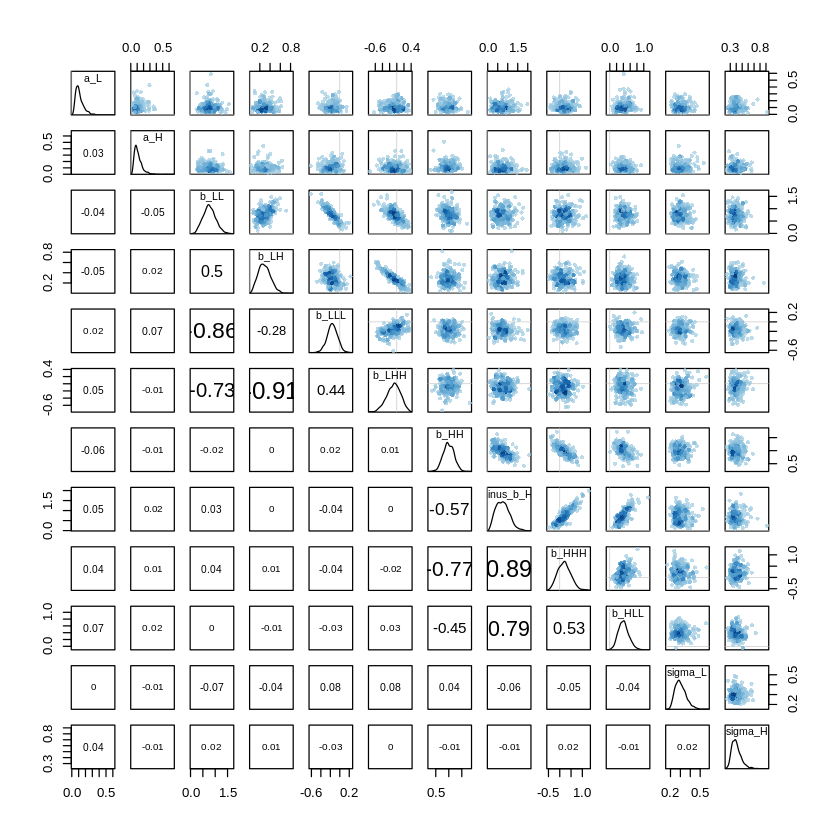

In [15]:
pairs(m16H4, pars=c("a_L", "a_H", "b_LL", "b_LH", "b_LLL", "b_LHH", "b_HH", "minus_b_HL", "b_HHH", "b_HLL", "sigma_L", "sigma_H") )

Let's just compare the AR(2) and AR(1) models using WAIC and LOO...

In [29]:
compare(m16H3gq, m16H4)

Warning message in compare(m16H3gq, m16H4):
“Different numbers of observations found for at least two models.
Information criteria only valid for comparing models fit to exactly same observations.
Number of observations for each model:
m16H3gq 20 
m16H4 19 
”Warning message in waic_ptw1 - waic_ptw2:
“longer object length is not a multiple of shorter object length”

,WAIC,pWAIC,dWAIC,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H3gq,41238.90,18900.64,0.000,1,10963.76,NA
m16H4,48487.81,22673.04,7248.913,0,11782.42,14696.35


In [30]:
compare(m16H3gq, m16H4, func=LOO)

Warning message in compare(m16H3gq, m16H4, func = LOO):
“Different numbers of observations found for at least two models.
Information criteria only valid for comparing models fit to exactly same observations.
Number of observations for each model:
m16H3gq 20 
m16H4 19 
”Warning message:
“Some Pareto k diagnostic values are too high. See help('pareto-k-diagnostic') for details.
”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaNs produced”Warning message in log(z):
“NaN

,LOO,pLOO,dLOO,weight,SE,dSE
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16H3gq,9412.413,2987.393,0.0000,1.000000e+00,1144.946,NA
m16H4,10010.264,3434.268,597.8508,1.507853e-130,1122.126,1344.308


OK so these are not fair tests because the m16H3gq has an extra data point to try and fit, however that should put the M16H3gq model at a disadvantage.  Yet, it does better at predicting despite the fewer effective parameters.  Thus the WAIC and LOO measures suggest the simpler AR(1) model does a better job at general prediction...

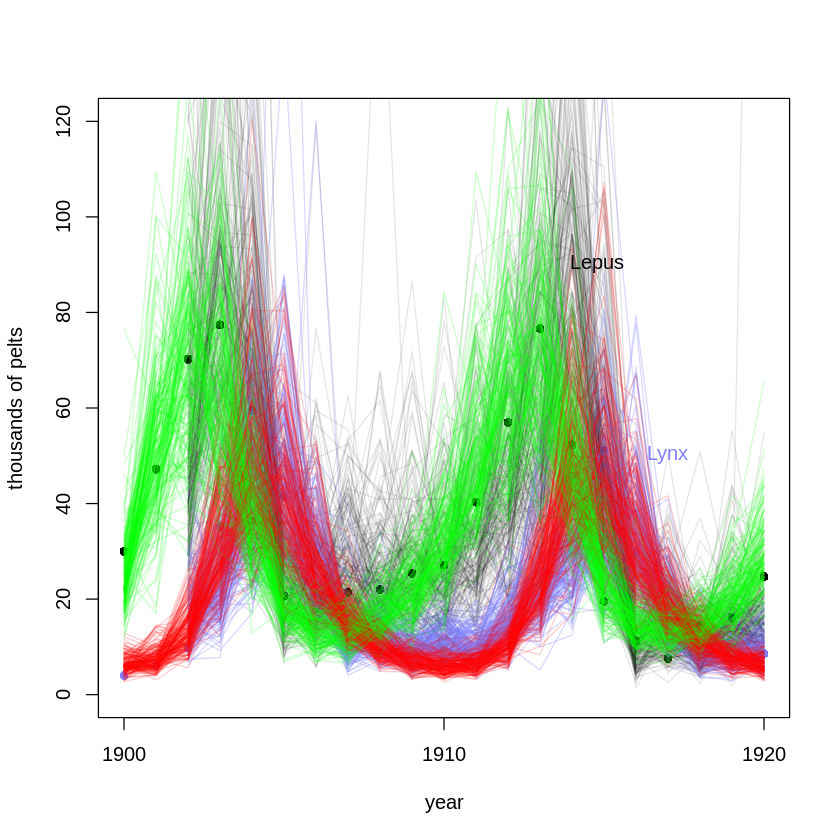

In [26]:
# Lines version of the AR(1) model above, i.e. without mean and shaded CI regions

post_m16.5 <- extract.samples(m16.5)

post <- extract.samples(m16H4)

pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# The AR(2) model
for ( s in 1:200 ) {
    lines( 3:21 , post$pelts_pred_L[s,] , col=col.alpha(rangi2,0.3) , lwd=1 )
    lines( 3:21 , post$pelts_pred_H[s,] , col=col.alpha(grau(),0.1) , lwd=1 )
}


# The Lotka-Volterra model
for ( s in 1:200 ) {
    lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.2) , lwd=1 )
    lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("red",0.2) , lwd=1 )
}

# text labels
text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=2 , col=rangi2 )

We should do the Lynx and Hare separately for improve the clarity...

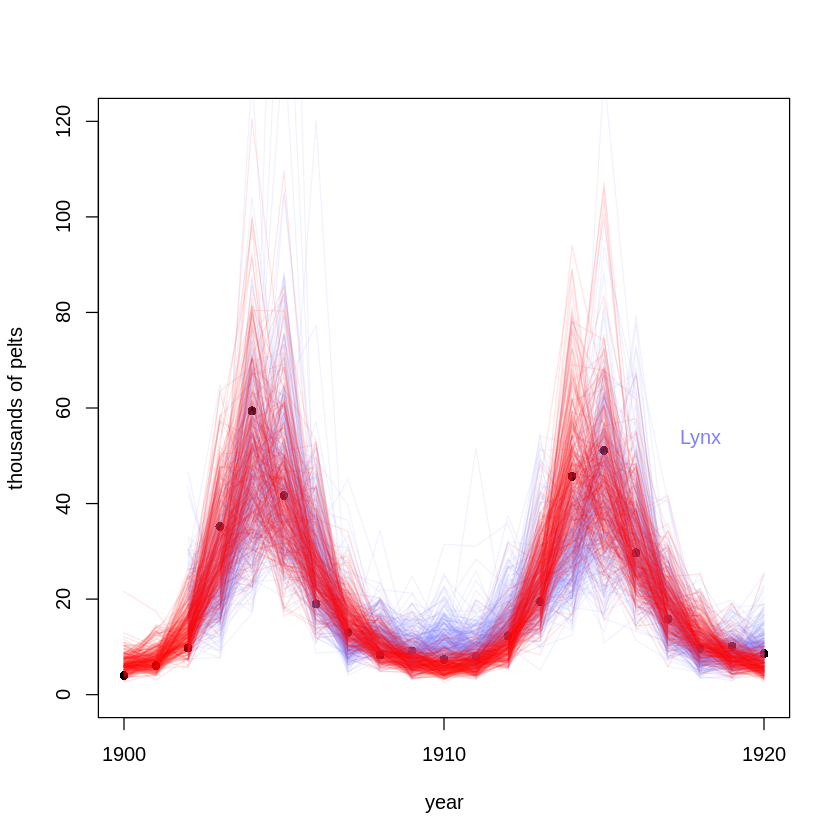

In [48]:
# Lynx: AR(2) vs ODE (Lotka-Volterra) model

post_m16.5 <- extract.samples(m16.5)

post <- extract.samples(m16H4)

pelts <- dat_list$pelts
plot( 1:21 , pelts[,1] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
# points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# The AR(2) model
for ( s in 1:300 ) {
    lines( 3:21 , post$pelts_pred_L[s,] , col=col.alpha(rangi2,0.1) , lwd=1 )
#     lines( 3:21 , post$pelts_pred_H[s,] , col=col.alpha(grau(),0.1) , lwd=1 )
}


# The Lotka-Volterra model
for ( s in 1:300 ) {
#     lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.2) , lwd=1 )
    lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("red",0.1) , lwd=1 )
}

# text labels
# text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=3 , col=rangi2 )

What about comparing AR(1) and AR(2):

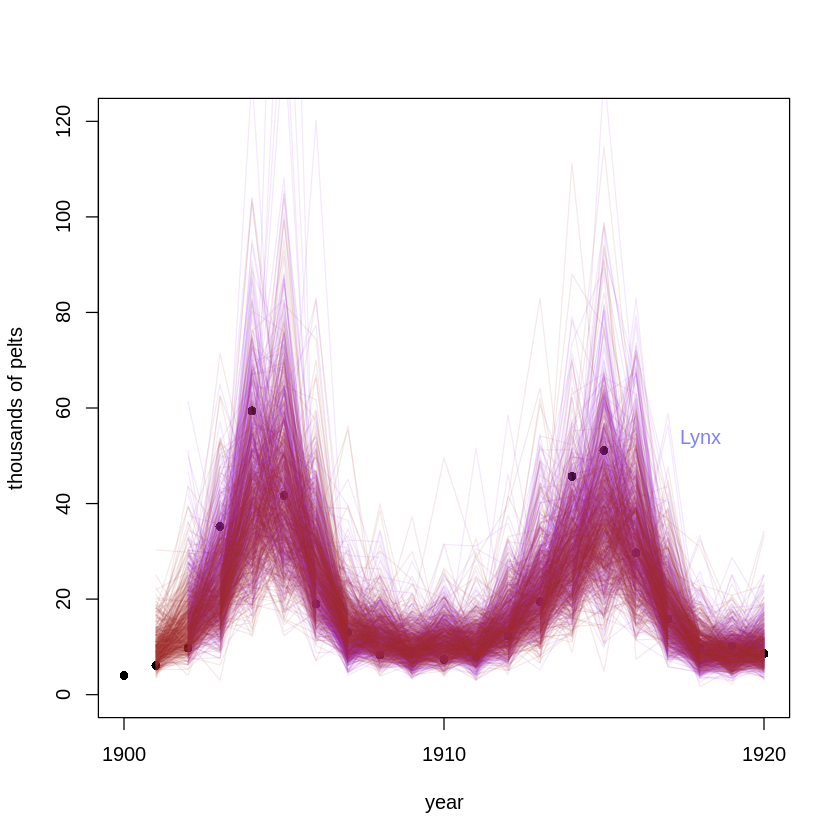

In [62]:
# Lynx: AR(1) vs AR(2) model

# post_m16.5 <- extract.samples(m16.5)
post_m16H3 <- extract.samples(m16H3gq)
post <- extract.samples(m16H4)

pelts <- dat_list$pelts
plot( 1:21 , pelts[,1] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
# points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )

# The AR(2) model
for ( s in 1:500 ) {
    lines( 3:21 , post$pelts_pred_L[s,] , col=col.alpha("purple",0.1) , lwd=1 )
#     lines( 3:21 , post$pelts_pred_H[s,] , col=col.alpha(grau(),0.1) , lwd=1 )
}


# The AR(1) model
for ( s in 1:500 ) {
    lines( 2:21 , post_m16H3$pelts_pred_L[s,] , col=col.alpha("brown",0.1) , lwd=1 )
#     lines( 2:21 , post_m16H3$pelts_pred_H[s,] , col=col.alpha("yellow",0.1) , lwd=1 )
}

# text labels
# text( 17 , 90 , "Lepus" , pos=2 )
text( 19 , 50 , "Lynx" , pos=3 , col=rangi2 )

The AR(2) seems to have a bit more variance, but it's difficult to appreciate in these line charts.  Let's try a chart with mean and shaded confidence intervals:

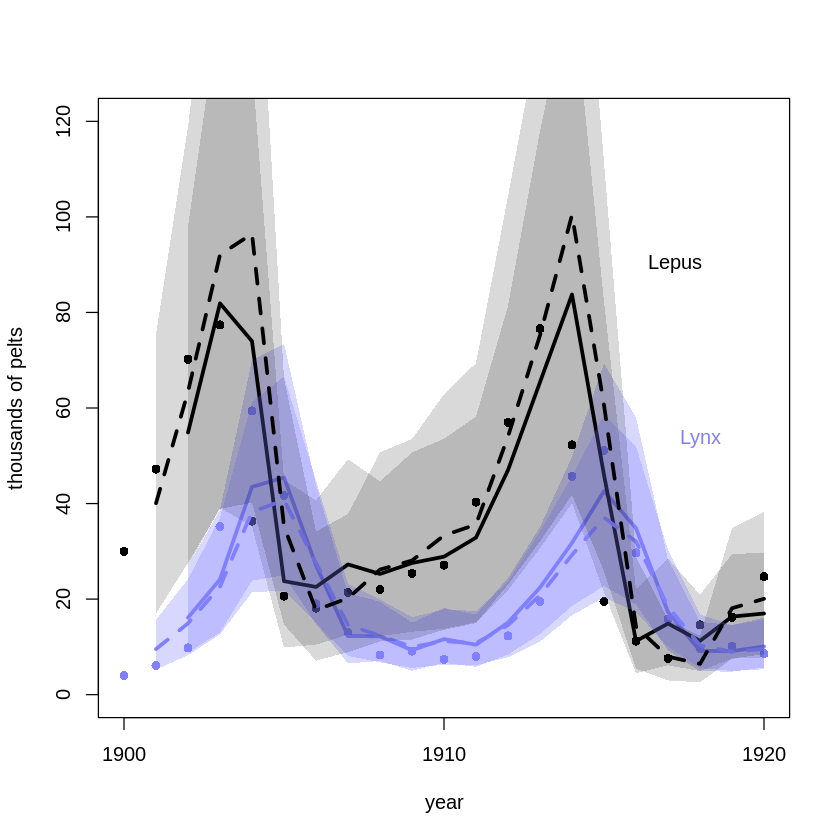

In [71]:
pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,120) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )


# The AR(2) model
post <- extract.samples(m16H4)
L_mean <- apply( post$pelts_pred_L , 2 , mean )
L_CI <- apply( post$pelts_pred_L , 2 , PI )
H_mean <- apply( post$pelts_pred_H , 2 , mean )
H_CI <- apply( post$pelts_pred_H , 2 , PI )

lines( 3:21 , L_mean, col=rangi2 ,lwd=3 )
shade( L_CI , 3:21 , col=col.alpha(rangi2, 0.3) )
lines( 3:21 , H_mean, lwd=3 )
shade( H_CI , 3:21 )


# The AR(1) model
post <- extract.samples(m16H3gq)
L_mean <- apply( post$pelts_pred_L , 2 , mean )
L_CI <- apply( post$pelts_pred_L , 2 , PI )
H_mean <- apply( post$pelts_pred_H , 2 , mean )
H_CI <- apply( post$pelts_pred_H , 2 , PI )

lines( 2:21 , L_mean, col=rangi2 ,lwd=3, lty=2 )
shade( L_CI , 2:21 , col=col.alpha(rangi2, 0.3) )
lines( 2:21 , H_mean, lwd=3, lty=2 )
shade( H_CI , 2:21 )



# # The Lotka-Volterra model
# for ( s in 1:250 ) {
#     lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.15) , lwd=1 )
#     lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("red",0.15) , lwd=1 )
# }

# text labels
text( 17 , 90 , "Lepus" , pos=4 )
text( 19 , 50 , "Lynx" , pos=3 , col=rangi2 )

There's a lot going on in the chart above.  The dashed lines refer to the means of the AR(1) model and the solid lines the means of the AR(2).  The shaded areas are the 89$ confidence intervals.  Let's just look at the Lynx first:

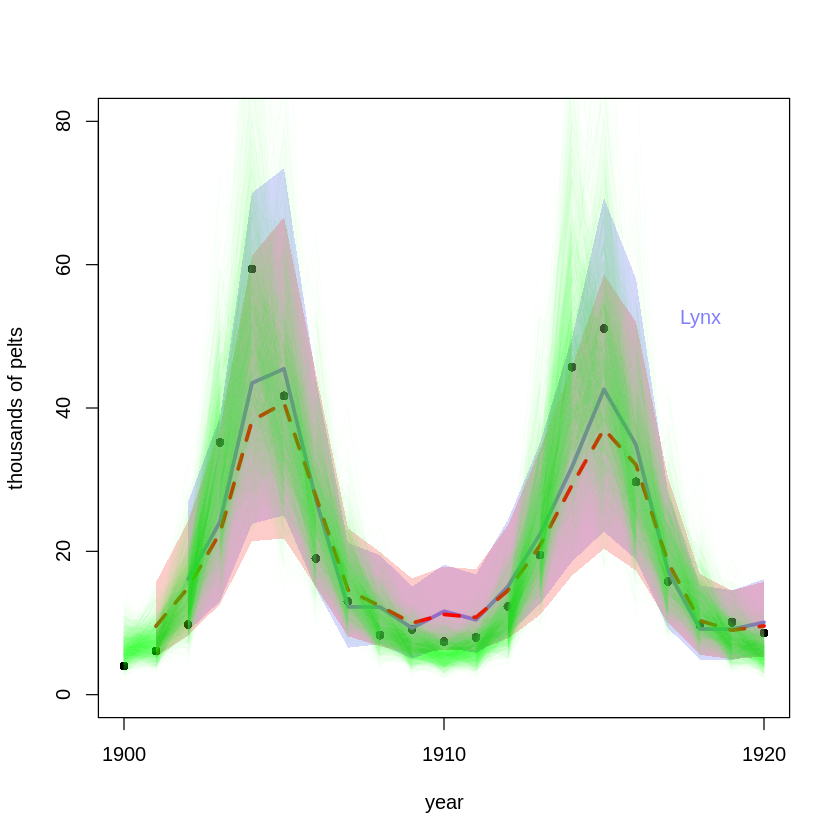

In [102]:
pelts <- dat_list$pelts
plot( 1:21 , pelts[,1] , pch=16 , ylim=c(0,80) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
# points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )


# The AR(2) model
post <- extract.samples(m16H4)
L_mean <- apply( post$pelts_pred_L , 2 , mean )
L_CI <- apply( post$pelts_pred_L , 2 , PI )
H_mean <- apply( post$pelts_pred_H , 2 , mean )
H_CI <- apply( post$pelts_pred_H , 2 , PI )

lines( 3:21 , L_mean, col=rangi2 ,lwd=3, lty=1 )
shade( L_CI , 3:21 , col=col.alpha(rangi2, 0.3) )
# lines( 3:21 , H_mean, lwd=3 )
# shade( H_CI , 3:21 )


# The AR(1) model
post <- extract.samples(m16H3gq)
L_mean <- apply( post$pelts_pred_L , 2 , mean )
L_CI <- apply( post$pelts_pred_L , 2 , PI )
H_mean <- apply( post$pelts_pred_H , 2 , mean )
H_CI <- apply( post$pelts_pred_H , 2 , PI )

lines( 2:21 , L_mean, col=col.alpha("red",1) ,lwd=3, lty=2 )
shade( L_CI , 2:21 , col=col.alpha("red", 0.2) )
# lines( 2:21 , H_mean, lwd=3, lty=2 )
# shade( H_CI , 2:21 )



# The Lotka-Volterra model
for ( s in 1:1800 ) {
#     lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.15) , lwd=1 )
    lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("green",0.01) , lwd=1 )
}

# text labels
# text( 17 , 90 , "Lepus" , pos=4 )
text( 19 , 50 , "Lynx" , pos=3 , col=rangi2 )

Here, the red colour refers to the AR(1) model and the purple the AR(2) model.  The solid line is the mean of the AR(2) and the dashed line is the mean of the AR(1) model.

The AR(2) model does a slightly better job than the AR(1) model in anticipating the data (i.e. it expects a larger value of L than the AR(1) when the data is increasing, and a smaller value of L when the data is decreasing).  So the predictions of AR(2) are more wildly varying, and the width of the confidence intervals tends to be larger for the AR(2) model than the AR(1).

The green lines from the ODE (Lotka-Volterra) model are even more widly varying than the AR(2), with larger highs and smaller lows.  The ODE does a much much better job of anticipating the data.  In some ways, the ODE underlying the L-V model is similar to AR(1) in that it uses the state at the previous time-step to predict the next step.  However, the L-V model is non-linear whereas the AR(1) (and AR(2) model is linear, so the L-V model can capture more complex behaviour due to the non-linearity.


Now let's compare the Hares:

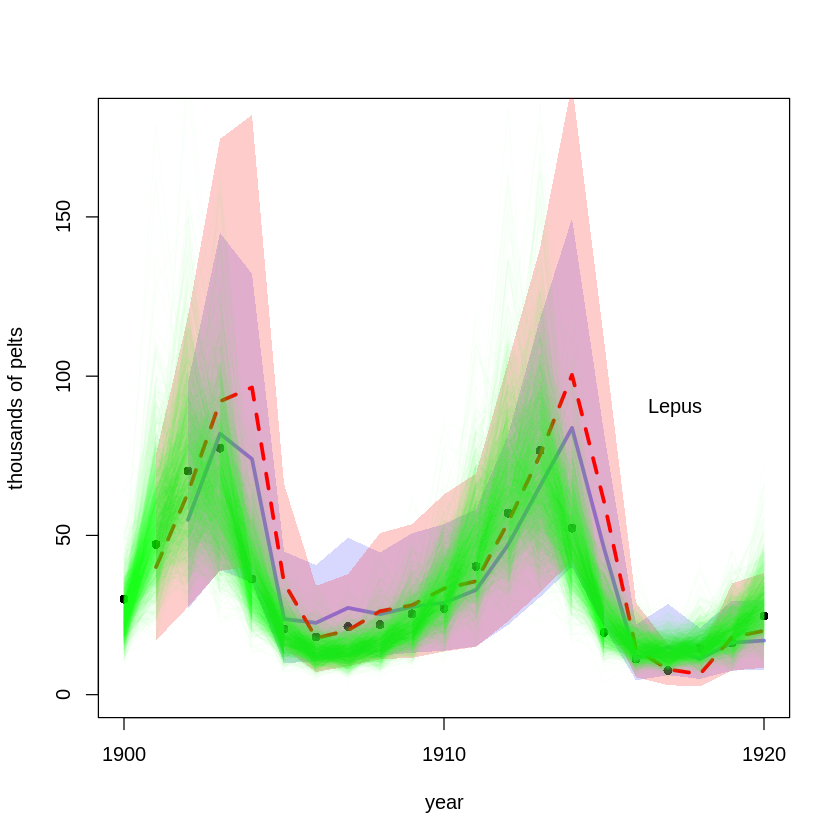

In [107]:
pelts <- dat_list$pelts
plot( 1:21 , pelts[,2] , pch=16 , ylim=c(0,180) , xlab="year" , 
     ylab="thousands of pelts" , xaxt="n" )
at <- c(1,11,21)
axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
# points( 1:21 , pelts[,1] , col=rangi2 , pch=16 )


# The AR(2) model
post <- extract.samples(m16H4)
L_mean <- apply( post$pelts_pred_L , 2 , mean )
L_CI <- apply( post$pelts_pred_L , 2 , PI )
H_mean <- apply( post$pelts_pred_H , 2 , mean )
H_CI <- apply( post$pelts_pred_H , 2 , PI )

# lines( 3:21 , L_mean, col=rangi2 ,lwd=3, lty=2 )
# shade( L_CI , 3:21 , col=col.alpha(rangi2, 0.3) )
lines( 3:21 , H_mean, col=rangi2, lwd=3, lty=1 )
shade( H_CI , 3:21 , col=col.alpha(rangi2, 0.3) )


# The AR(1) model
post <- extract.samples(m16H3gq)
L_mean <- apply( post$pelts_pred_L , 2 , mean )
L_CI <- apply( post$pelts_pred_L , 2 , PI )
H_mean <- apply( post$pelts_pred_H , 2 , mean )
H_CI <- apply( post$pelts_pred_H , 2 , PI )

# lines( 2:21 , L_mean, col=col.alpha("red",1) ,lwd=3, lty=2 )
# shade( L_CI , 2:21 , col=col.alpha("red", 0.2) )
lines( 2:21 , H_mean, col=col.alpha("red",1) ,lwd=3, lty=2 )
shade( H_CI , 2:21 , col=col.alpha("red", 0.2) )



# The Lotka-Volterra model
for ( s in 1:2000 ) {
    lines( 1:21 , post_m16.5$pelts_pred[s,,2] , col=col.alpha("green",0.02) , lwd=1 )
#     lines( 1:21 , post_m16.5$pelts_pred[s,,1] , col=col.alpha("green",0.01) , lwd=1 )
}

# text labels
text( 17 , 90 , "Lepus" , pos=4 )
# text( 19 , 50 , "Lynx" , pos=3 , col=rangi2 )

Again, the red colour refers to the AR(1) model and the purple the AR(2) model.  The solid line is the mean of the AR(2) and the dashed line is the mean of the AR(1) model.

The AR(2) is again quicker at responding to the data than the AR(1), though this time the AR(1) model has a wider confidence interval.  This may be because the AR(2) mdoel does a better job of tracking the data?

The Lotka-Volterra ODE model does a better job of anticipating the data than the AR models, which lag the data somewhat.

16H5

day,prey,predator
<int>,<int>,<int>
16,194,75
23,896,119
29,1443,488
36,851,960
42,308,458
49,264,433


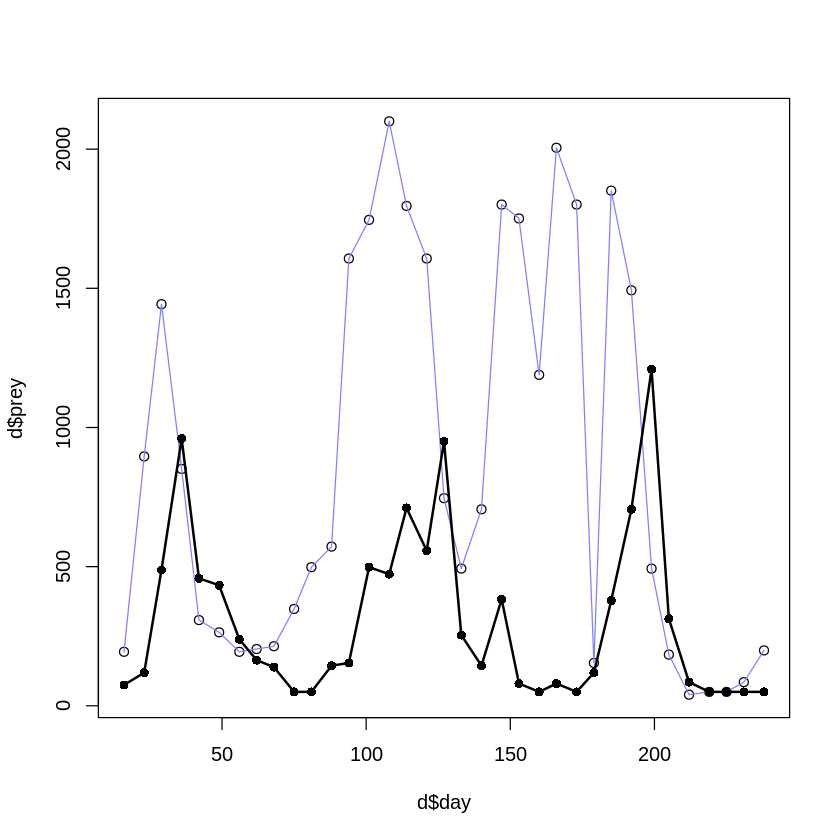

In [2]:
library(rethinking)
options(mc.cores = parallel::detectCores())
data(Mites)
d <- Mites
head(d)
plot(d$day, d$prey)
# plot(NULL, xlim=c(0,max(d$day)), ylim=c(0, max(d$prey)) )
lines(d$day, d$prey, col=rangi2)
points(d$day, d$predator, pch=16)
lines(d$day, d$predator, lwd=2)
(N <- nrow(Mites))

In [167]:
for (i in 2:N) interval[i] <- Mites$day[i]-Mites$day[i-1]
interval

[1] 35

[1] 7 7 6 7 6 7 7 6 6 7 6 7 6 7 7 6 7 6 6 7 7 6 7 6 7 6 6 7 7 6 7 7 6 6 7

So sometimes the data is sampled after 7 days, sometimes 6 days.  We might need to take this into account.

For simplicity, let's sloppily rescale time by ignoring the difference in intervals (6 or 7 days) and just assume it's constant.

Also, let's rescale time, so that we use the data point indices, similar to the years in the Lynx_Hare model.  This will allow us to gauge the length of the cycles in the data:

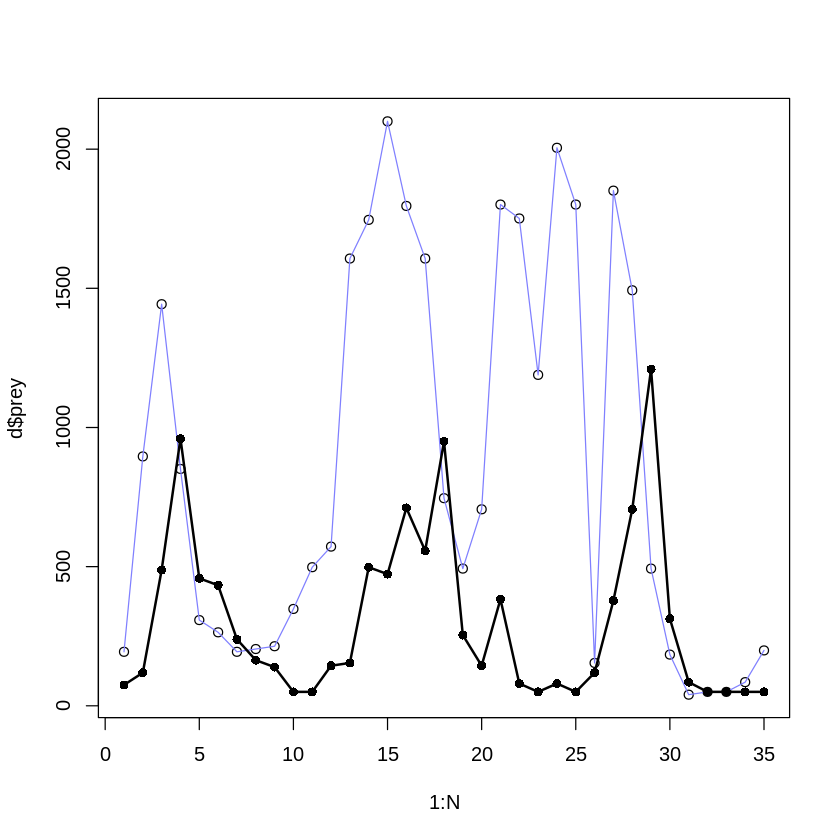

In [5]:
N <- nrow(Mites)
plot(1:N, d$prey)
# plot(NULL, xlim=c(0,max(d$day)), ylim=c(0, max(d$prey)) )
lines(1:N, d$prey, col=rangi2)
points(1:N, d$predator, pch=16)
lines(1:N, d$predator, lwd=2)


The cycles above seem to be around 12-14 data points long.  Compare this to the Lynx_Hare model, where the cycles were about 10 data points long.

Perhaps we can get away with ignoring this discrepancy, because it is not too different...  Note that the book states: "Keep in mind as well that the time variable and the birth and death parameters go together. If you rescale the time dimension, that implies you must also rescale the parameters."  So if we were to rescale the time, we would need to change, in particular, the theta parameters...

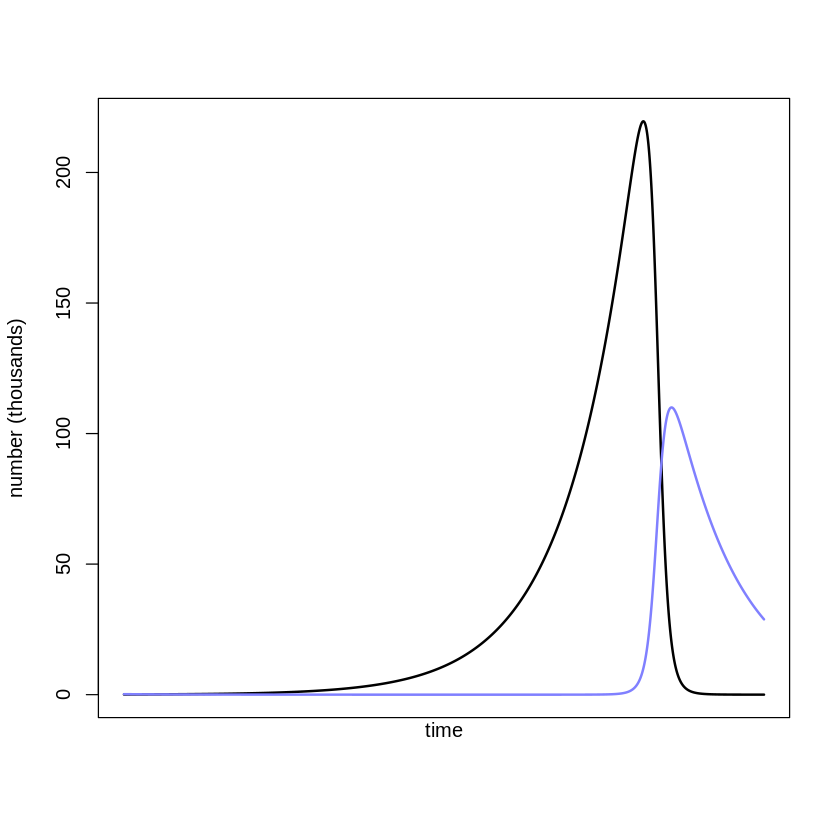

In [155]:
sim_lynx_hare <- function( n_steps , init , theta , dt=0.002 ) {
                        L <- rep(NA,n_steps)
                        H <- rep(NA,n_steps)
                        L[1] <- init[1]
                        H[1] <- init[2]
                        for ( i in 2:n_steps ) {
                            H[i] <- H[i-1] + dt*H[i-1]*( theta[1] - theta[2]*L[i-1] )
                            L[i] <- L[i-1] + dt*L[i-1]*( theta[3]*H[i-1] - theta[4] )
                        }
                        return( cbind(L,H) )
                  }


theta <- c( 0.5 , 0.05 , 0.025 , 0.5 )
z <- sim_lynx_hare( 1e4 ,  as.numeric(Mites[1,2:3])/1000 , theta )


plot( z[,2] , type="l" , ylim=c(0,max(z[,2])) , lwd=2 , xaxt="n" , ylab="number (thousands)" , xlab="" )
lines( z[,1] , col=rangi2 , lwd=2 )
mtext( "time" , 1 )

So the starting population of the Lotka-Volterra ODE model influences the amplitude and periodicity.

Perhaps we should try to rescale the data in the Mites model to approach that of the Lynx_Hares model?  In order to scale consistently, we should use the Buckingham-Pi formulation (see my paper).

But first, why don't we try the same model code for the Lynx_Hare model and just use the new data, in order to see how well it fits the new data...:

In [41]:
data(Lynx_Hare_model)
cat(Lynx_Hare_model)

functions {
  real[] dpop_dt( real t,                 // time
                real[] pop_init,          // initial state {lynx, hares}
                real[] theta,             // parameters
                real[] x_r, int[] x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  real<lower=0> pelts[N,2];    // measured populations
}
transformed data{
  real times_measured[N-1];    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  real<lower=0> theta[4];      // { bh, mh, ml, bl }
  real<lower=0> pop_init[2];   // initial population state
  real<lower=0> sigma[2];      // measurement errors
  real<lower=0,upper=1> p[2];

In [172]:
head(Lynx_Hare)
head(Mites)

Year,Lynx,Hare
<int>,<dbl>,<dbl>
1900,4.0,30.0
1901,6.1,47.2
1902,9.8,70.2
1903,35.2,77.4
1904,59.4,36.3
1905,41.7,20.6


day,prey,predator
<int>,<int>,<int>
16,194,75
23,896,119
29,1443,488
36,851,960
42,308,458
49,264,433


Note that the predator - prey data columns are the reverse order of Lynx - Hare.  So we need to change the order of the data when we create the data list for the model:

In [ ]:
dat_list <- list(
                N = nrow(Mites),
                pelts = Mites[,3:2] )  # Note that the predator - prey data columns are the reverse order of Lynx - Hare

m16H5 <- stan( model_code=Lynx_Hare_model , data=dat_list , chains=3 , cores=3 , control=list( adapt_delta=0.95) )

In [4]:
precis(m16H5, 2)

140 matrix parameters hidden. Use depth=3 to show them.


,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
theta[1],3.808105e-01,1.020233e-01,2.335458e-01,5.589745e-01,897.1473,1.0009974
theta[2],2.667251e-04,9.575707e-05,1.417215e-04,4.392345e-04,980.5967,1.0000235
theta[3],9.542474e-01,2.511234e-01,6.225183e-01,1.422908e+00,847.1616,1.0012152
theta[4],3.824344e-04,1.555554e-04,1.909474e-04,6.564181e-04,890.0407,1.0014648
pop_init[1],3.317055e+02,6.946418e+01,2.354854e+02,4.503505e+02,1827.7564,0.9996784
pop_init[2],2.950695e+03,7.625621e+02,1.879263e+03,4.265739e+03,1612.5202,0.9997353
sigma[1],5.722060e-01,7.837823e-02,4.630221e-01,7.096629e-01,2759.5612,0.9997279
sigma[2],1.060216e+00,1.429787e-01,8.605002e-01,1.309757e+00,1640.2298,1.0009134
p[1],1.813479e-01,2.489976e-02,1.429836e-01,2.228201e-01,1699.2455,1.0002486


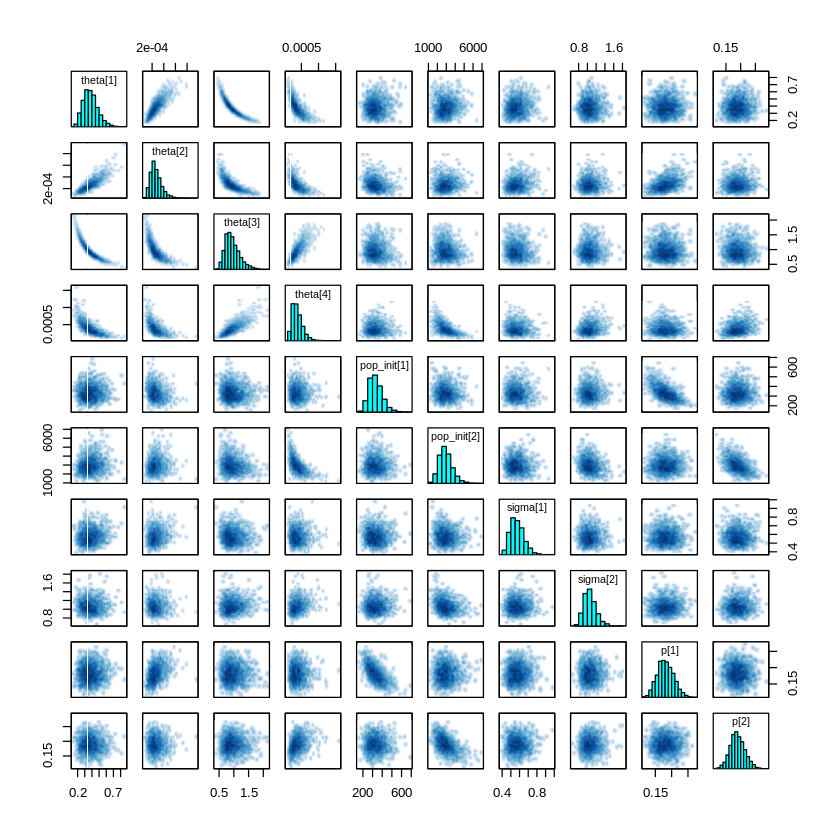

In [52]:
pairs(m16H5, pars=c("theta[1]", "theta[2]", "theta[3]", "theta[4]", "pop_init[1]", "pop_init[2]", "sigma[1]", "sigma[2]", "p[1]", "p[2]") )

Does it make sense to use the Lynx_Hare model as it is, because it includes a type of measurement error in that it models the proportion p of pelts that were taken from an unobserved population (it's a state space model)?

From the description in the question, it implies that we should take the data as fact and that there is no measurement error: "These data are actual counts of individuals, not just their pelts."  However, the book generally advises to assume there's always measurement error, so I think we should still keep the idea of the state space model, and sample from the population to get the measurments.  However, perhaps we should have a prior where the proportion of observed population is almost 1 (i.e. we expect to see almost all).


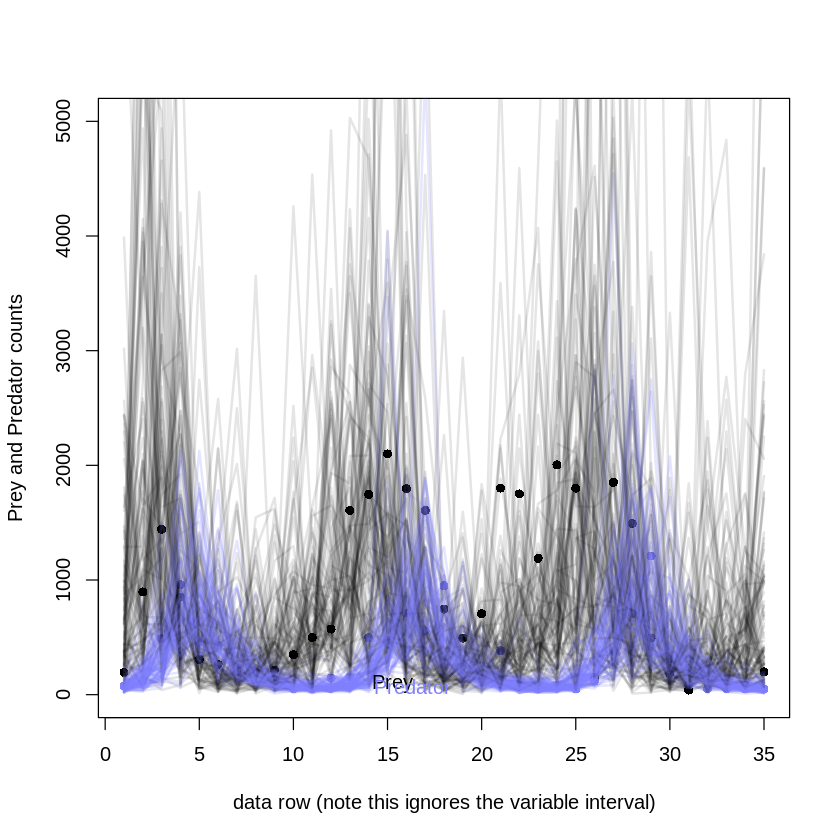

In [33]:
N = nrow(Mites)

post <- extract.samples(m16H5)

pelts = Mites[,3:2]
plot( 1:N , pelts[,2] , pch=16 , ylim=c(0,5000) , xlab="data row (note this ignores the variable interval)" , 
     ylab="Prey and Predator counts" ) #, xaxt="n" )
# at <- c(1,11,21)
# axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
points( 1:N , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:100 ) {
    lines( 1:N , post$pelts_pred[s,,2] , col=col.alpha("black",0.1) , lwd=2 )
    lines( 1:N , post$pelts_pred[s,,1] , col=col.alpha(rangi2,0.2) , lwd=2 )
}

# text labels
text( 17 , 90 , "Prey" , pos=2 )
text( 19 , 50 , "Predator" , pos=2 , col=rangi2 )

It is a bit messy, so let's make the charts separately.  First, the Predators:

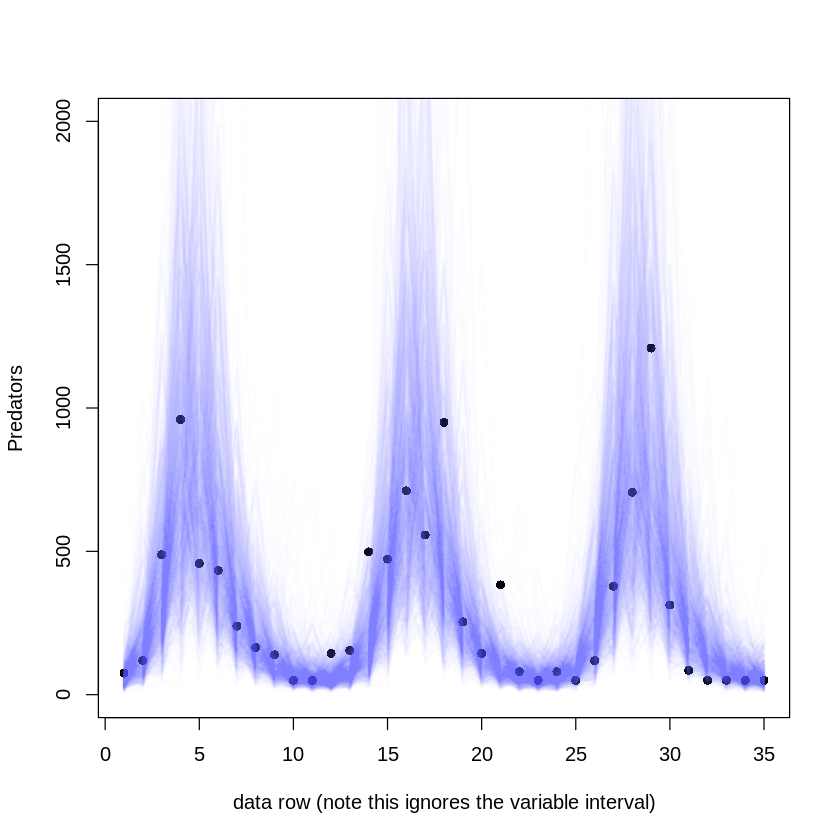

In [34]:
N = nrow(Mites)

post <- extract.samples(m16H5)

pelts = Mites[,3:2]
plot( 1:N , pelts[,1] , pch=16 , ylim=c(0,2000) , xlab="data row (note this ignores the variable interval)" , 
     ylab="Predators" ) #, xaxt="n" )
# at <- c(1,11,21)
# axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
# points( 1:N , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:1000 ) {
#     lines( 1:N , post$pelts_pred[s,,2] , col=col.alpha("black",0.1) , lwd=2 )
    lines( 1:N , post$pelts_pred[s,,1] , col=col.alpha(rangi2,0.01) , lwd=2 )
}

# text labels
# text( 17 , 90 , "Prey" , pos=2 )
# text( 19 , 50 , "Predator" , pos=2 , col=rangi2 )

This doesn't seem to do a bad job, despite the lack of adjustment from the original Lynx_Hare model.

Now let's try it for the Prey:

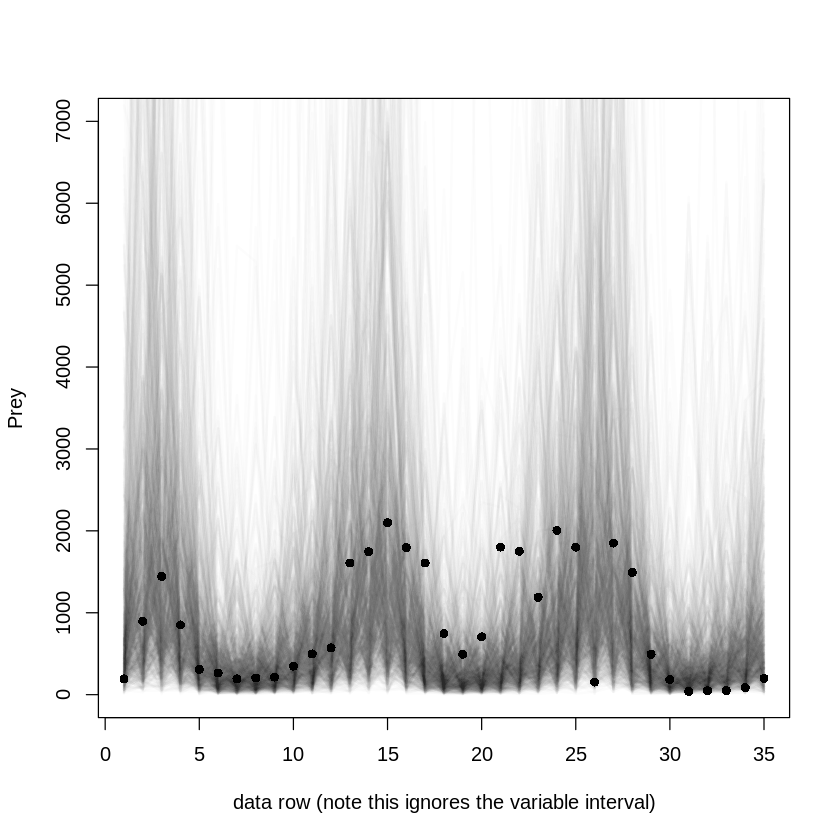

In [35]:
N = nrow(Mites)

post <- extract.samples(m16H5)

pelts = Mites[,3:2]
plot( 1:N , pelts[,2] , pch=16 , ylim=c(0,7000) , xlab="data row (note this ignores the variable interval)" , 
     ylab="Prey" ) #, xaxt="n" )
# at <- c(1,11,21)
# axis( 1 , at=at , labels=Lynx_Hare$Year[at] )
# points( 1:N , pelts[,1] , col=rangi2 , pch=16 )

# 21 time series from posterior
for ( s in 1:1000 ) {
    lines( 1:N , post$pelts_pred[s,,2] , col=col.alpha("black",0.01) , lwd=2 )
#     lines( 1:N , post$pelts_pred[s,,1] , col=col.alpha(rangi2,0.1) , lwd=2 )
}

# text labels
# text( 17 , 90 , "Prey" , pos=2 )
# text( 19 , 50 , "Predator" , pos=2 , col=rangi2 )

This is a lot more messy and uncertain, but probably reflects the fact that the data appear quite noisy, with a lot of measurement error, i.e. it is not a very periodic curve around the data points 18 to 28.  The posterior really doesn't expect the data points to be so high at around 17, 21 and 22.

The glaringly obvious problem with the predictions of both Predator but especially Prey data is that there is too much probability of very high counts - the shaded regions have high peaks several thousands above the actual data points.  In addition, the Prey estimates have too much data below the data points when they are higher.

What can be done to improve these predictions?  .

We need to consider the priors.  In particular, the values of p are far too low, given that we are no longer estimating population from a small selection of pelts.  If p is nearer 1, then perhaps the uncertainty (as measuremed by sigma?) may be able to be smaller (although looking at a pairs plot of the results so far, the p and sigma variables don't seem very correlated - perhaps with different priors they might be?), and hence the uncertainty may be diminished.  Note however, that the estimated sigma values seem remarkably small already - that's probably because of the extremely regularizing ('informative') prior of exp(1).

The priors were originally as follows:

theta[{1,3}] ~ normal( 1 , 0.5 );    // bh,ml

theta[{2,4}] ~ normal( 0.05, 0.05 ); // mh,bl

sigma ~ exponential( 1 );

pop_init ~ lognormal( log(10) , 1 );

p ~ beta(40,200);


So we re-run the model with the following changes:

p ~ beta(24,4)    # Based on playing with the beta curve below.  We want a distribution with mean / mode around 0.8-0.9, and a left tail not too disperse (we are confident that we haven't missed many mites, so the probability shouldn't be large anywhere near 0.5).

pop_init ~ lognormal( log(200) , 1 )

Out of interest, we could run the model with this one change to see what impact that has on the other parameters and the predictions...  But that would be data-snooping, so let's see whether we can work out how any of the other parameters should change.

sigma ~ exponential(0.1)



Note that all these parameters are for a model that has not been rescaled.  If we rescale, the model to try to match the Lynx_Hare model as mentioned previously, we'll have to recall these priors and adjust as appropriate.

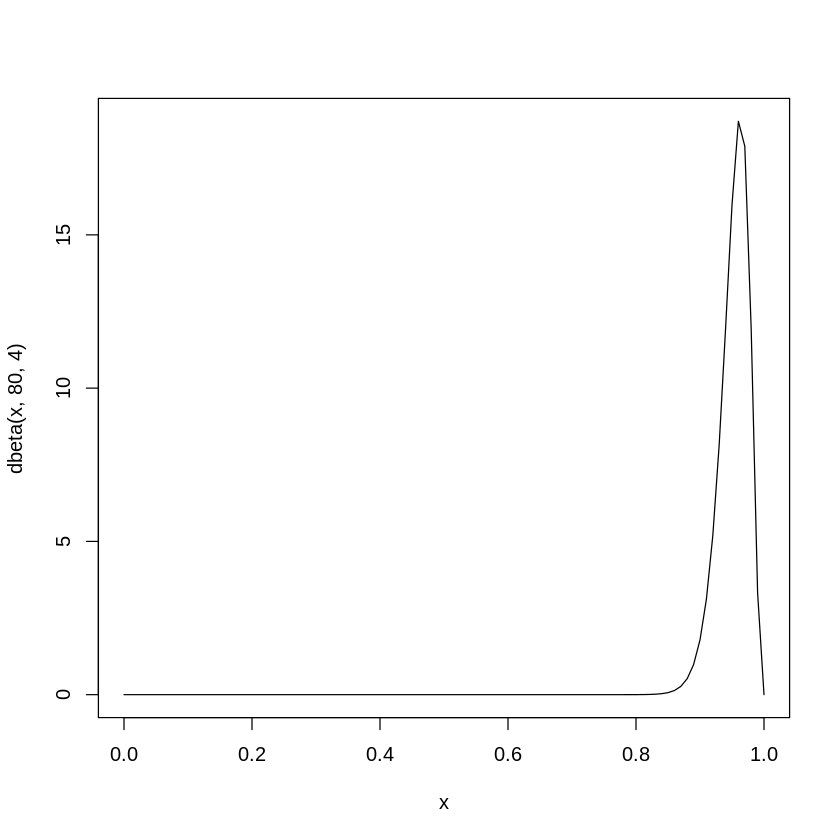

In [22]:
# p ~ beta(24, 4)
curve(dbeta(x, 80, 4), from=0, to=1)

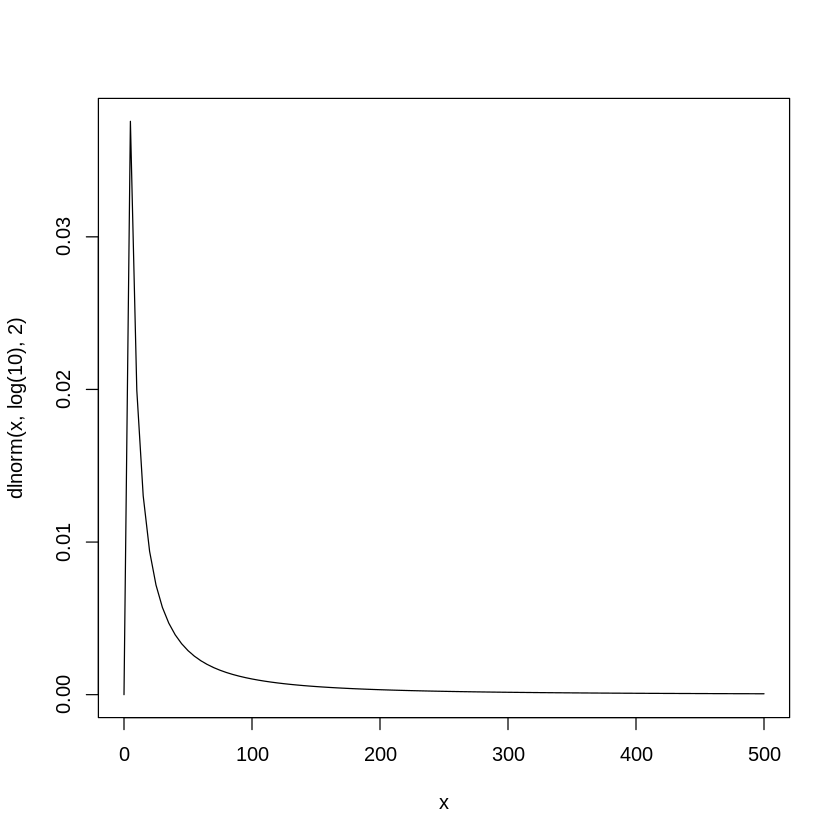

In [24]:
# pop_init ~ lognormal( log(100) , 40 )
curve(dlnorm( x, log(10) , 2 ), from=0, 500)

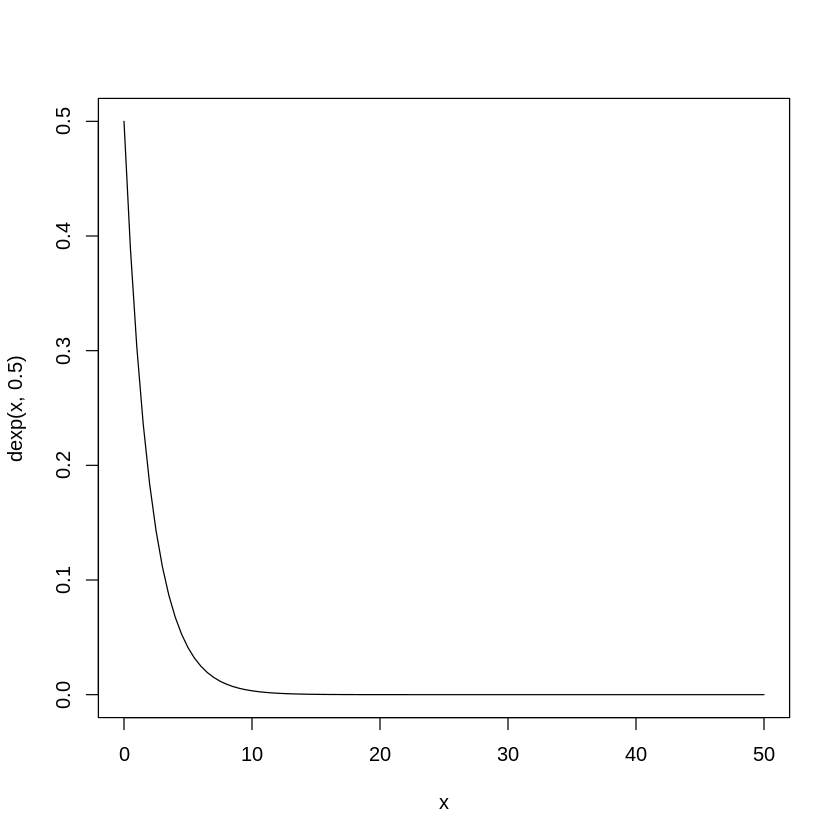

In [25]:
curve(dexp(x, 0.5), from=0, to=50)

So let's adjust the model below with the new parameters:

In [1]:
library(rethinking)
options(mc.cores = parallel::detectCores())
data(Mites)
d <- Mites
N <- nrow(Mites)

Loading required package: rstan
Loading required package: ggplot2
Loading required package: StanHeaders
rstan (Version 2.18.2, GitRev: 2e1f913d3ca3)
For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)
Loading required package: parallel
rethinking (Version 1.88)


In [26]:
model2export <- "functions {
  real[] dpop_dt( real t,                 // time
                real[] pop_init,          // initial state {lynx, hares}
                real[] theta,             // parameters
                real[] x_r, int[] x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  real<lower=0> pelts[N,2];    // measured populations
  int<lower = 0, upper = 1> run_estimation; // a switch to evaluate the likelihood
}
transformed data{
  real times_measured[N-1];    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  real<lower=0> theta[4];      // { bh, mh, ml, bl }
  real<lower=0> pop_init[2];   // initial population state
  real<lower=0> sigma[2];      // measurement errors
  real<lower=0,upper=1> p[2];  // trap rate
}
transformed parameters {
  real pop[N, 2];
  pop[1,1] = pop_init[1];
  pop[1,2] = pop_init[2];
  pop[2:N,1:2] = integrate_ode_rk45(
    dpop_dt, pop_init, 0, times_measured, theta,
    rep_array(0.0, 0), rep_array(0, 0),
    1e-5, 1e-3, 5e2);
}
model {
  // old priors
  theta[{1,3}] ~ normal( 1 , 0.5 );    // bh,ml
  theta[{2,4}] ~ normal( 0.05, 0.05 ); // mh,bl
//  sigma ~ exponential( 1 );
//  pop_init ~ lognormal( log(10) , 1 );
//  p ~ beta(40,200);
// new priors
   p ~ beta(80,4);
   pop_init ~ lognormal( log(10) , 2 );
   sigma ~ exponential(0.5);
  
  // observation model
  // connect latent population state to observed pelts
  // likelihood, which we only evaluate conditionally
  if(run_estimation==1){
      for ( t in 1:N )
        for ( k in 1:2 )
          pelts[t,k] ~ lognormal( log(pop[t,k]*p[k]) , sigma[k] );
  }
}
generated quantities {
  real pelts_pred[N,2];
  for ( t in 1:N )
    for ( k in 1:2 )
      pelts_pred[t,k] = lognormal_rng( log(pop[t,k]*p[k]) , sigma[k] );
}
"

In [27]:
cat(model2export, file='m16H5new.stan')
compiled_model <- stan_model("m16H5new.stan")

In [28]:
N <- nrow(Mites)
# f <- rep(1,N)
# fake_data <- data.frame(f,f)

pelts <- Mites[,3:2]
# dat_list <- list(
#                 N = nrow(Mites),
#                 pelts = Mites[,3:2] )  # Note that the predator - prey data columns are the reverse order of Lynx - Hare

sim_out <- sampling(compiled_model, data = list(N = N, 
                                                # pelts should be real but fake data if we're simulating
                                                # new pelts
                                                pelts = pelts,
#                                                 pelts = fake_data,
                                                run_estimation = 1     # turn off estimation to instead do prior predictive simulation
                                                )
                   , chains=3, cores=3
#                    , control=list(adapt_delta=0.9, max_treedepth=10)  # Uncommenting this may kill the Kernel
#                    , iter=2000
                   )

In [29]:
library(dplyr)

data_matrix  <- sim_out %>% 
  as.data.frame %>% 
  select(contains("pelts_pred"))

In [30]:
postPars  <- sim_out %>% 
  as.data.frame 
# %>% 
#   select(contains("pelts_pred"))

# summary_tbl <- apply(fake_data_matrix[1:5,], 1, summary)
# summary_tbl

head(postPars)

# fake_data_matrix$'pelts_pred[1,2]'

theta[1],theta[2],theta[3],theta[4],pop_init[1],pop_init[2],sigma[1],sigma[2],p[1],p[2],⋯,"pelts_pred[27,2]","pelts_pred[28,2]","pelts_pred[29,2]","pelts_pred[30,2]","pelts_pred[31,2]","pelts_pred[32,2]","pelts_pred[33,2]","pelts_pred[34,2]","pelts_pred[35,2]",lp__
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.4966576,0.001669480,0.6661152,0.001214647,75.97091,687.5175,0.6036523,0.8512227,0.9625822,0.9627828,⋯,1016.1473,106.36124,368.9705,325.4595,128.70386,632.3423,689.9069,681.6404,1177.1800,-64.95581
0.3394662,0.001219851,0.9535032,0.001505081,61.92867,809.3889,0.4913543,1.3302988,0.9312308,0.9394980,⋯,176.8365,1481.19574,79.5329,460.5675,1205.29541,2020.2864,125.9943,180.2325,1901.6766,-64.99232
0.3415208,0.001071947,1.0233084,0.001670384,53.10284,673.8373,0.5853532,1.1531441,0.9761442,0.9890394,⋯,1276.1429,1891.65219,313.8221,140.6247,47.15412,921.3457,143.7982,322.2160,674.0199,-67.30206
0.3556445,0.001169146,0.9729977,0.001617487,51.45200,731.0192,0.5612979,1.1450685,0.9757376,0.9884207,⋯,272.5307,2692.57576,371.9885,143.8668,453.04621,626.5171,214.8037,811.0290,601.9253,-66.64272
0.4049379,0.001454194,0.7901179,0.001257321,79.77761,818.6546,0.5650612,0.9225256,0.9060681,0.8946372,⋯,1682.1016,46.97326,189.2633,301.2415,50.48010,910.9888,2631.9108,377.4661,1156.1794,-65.56280
0.5254044,0.002133034,0.6226937,0.001124645,65.68546,654.9990,0.6493435,0.9469598,0.9613596,0.9750823,⋯,954.4486,1120.55789,100.8278,247.8549,462.63077,255.5115,143.7251,704.0149,383.5438,-64.64462


In [31]:
# library(dplyr)
# new_df <- summarise_each(cars, funs(mean))
# ## Subsetting to only summarize specific columns
# new_df <- summarise_each(cars[, c('speed', 'dist')], funs(mean))

summary(postPars)

    theta[1]         theta[2]            theta[3]         theta[4]        
 Min.   :0.1470   Min.   :0.0004857   Min.   :0.3674   Min.   :0.0002208  
 1st Qu.:0.3377   1st Qu.:0.0011811   1st Qu.:0.6872   1st Qu.:0.0009875  
 Median :0.4068   Median :0.0014720   Median :0.8111   Median :0.0012952  
 Mean   :0.4186   Mean   :0.0015400   Mean   :0.8509   Mean   :0.0013943  
 3rd Qu.:0.4878   3rd Qu.:0.0018245   3rd Qu.:0.9724   3rd Qu.:0.0016709  
 Max.   :0.9350   Max.   :0.0038645   Max.   :2.1629   Max.   :0.0049091  
  pop_init[1]      pop_init[2]        sigma[1]         sigma[2]     
 Min.   : 37.78   Min.   : 372.8   Min.   :0.3865   Min.   :0.7121  
 1st Qu.: 60.01   1st Qu.: 639.0   1st Qu.:0.5150   1st Qu.:0.9446  
 Median : 66.40   Median : 748.4   Median :0.5601   Median :1.0273  
 Mean   : 67.57   Mean   : 776.5   Mean   :0.5684   Mean   :1.0428  
 3rd Qu.: 73.85   3rd Qu.: 879.2   3rd Qu.:0.6131   3rd Qu.:1.1250  
 Max.   :128.88   Max.   :2301.4   Max.   :0.9637   Max.   :1

In [4]:
# Compare with the posterior derived from the original priors
precis(m16H5, 2)

140 matrix parameters hidden. Use depth=3 to show them.


,mean,sd,5.5%,94.5%,n_eff,Rhat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
theta[1],3.808105e-01,1.020233e-01,2.335458e-01,5.589745e-01,897.1473,1.0009974
theta[2],2.667251e-04,9.575707e-05,1.417215e-04,4.392345e-04,980.5967,1.0000235
theta[3],9.542474e-01,2.511234e-01,6.225183e-01,1.422908e+00,847.1616,1.0012152
theta[4],3.824344e-04,1.555554e-04,1.909474e-04,6.564181e-04,890.0407,1.0014648
pop_init[1],3.317055e+02,6.946418e+01,2.354854e+02,4.503505e+02,1827.7564,0.9996784
pop_init[2],2.950695e+03,7.625621e+02,1.879263e+03,4.265739e+03,1612.5202,0.9997353
sigma[1],5.722060e-01,7.837823e-02,4.630221e-01,7.096629e-01,2759.5612,0.9997279
sigma[2],1.060216e+00,1.429787e-01,8.605002e-01,1.309757e+00,1640.2298,1.0009134
p[1],1.813479e-01,2.489976e-02,1.429836e-01,2.228201e-01,1699.2455,1.0002486


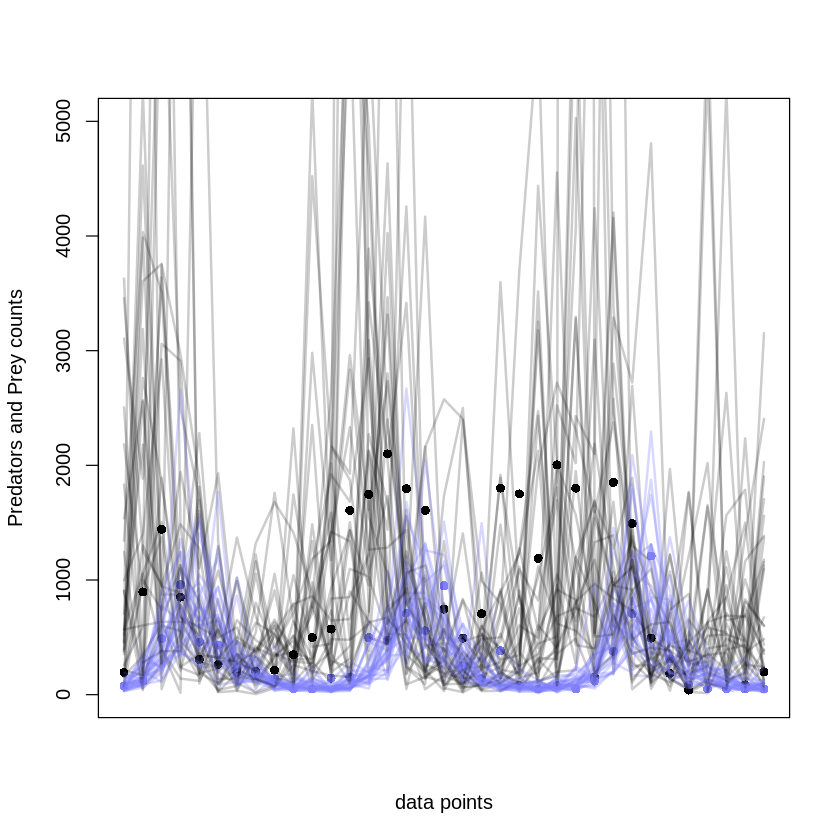

In [32]:
post <- data.frame(data_matrix)

pelts <- Mites[,3:2]


plot( 1:N , pelts[,2] , pch=16 , ylim=c(0,5000) , xlab="data points" , 
     ylab="Predators and Prey counts" , xaxt="n" )
# at <- c(1,11,21)
# axis( 1 , at=at , labels=Mites$time[at] )
points( 1:N , pelts[,1] , col=rangi2 , pch=16 )

# 30 time series from posterior
for ( s in 1:30 ) {
    lines( 1:35 , post[s,36:70] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:35 , post[s,1:35] , col=col.alpha(rangi2,0.3) , lwd=2 )

}

# # text labels
# text( 17 , 90 , "Prey" , pos=2 )
# text( 19 , 50 , "Predator" , pos=2 , col=rangi2 )

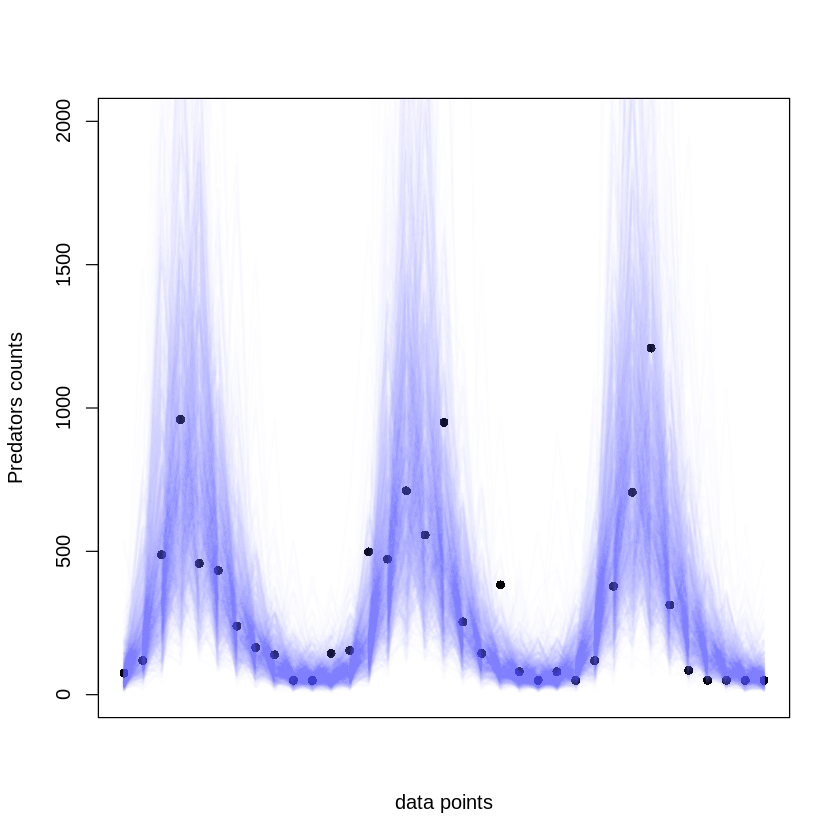

In [33]:
post <- data.frame(data_matrix)

pelts <- Mites[,3:2]


plot( 1:N , pelts[,1] , pch=16 , ylim=c(0,2000) , xlab="data points" , 
     ylab="Predators counts" , xaxt="n" )
# at <- c(1,11,21)
# axis( 1 , at=at , labels=Mites$time[at] )
# points( 1:N , pelts[,1] , col=rangi2 , pch=16 )

# 30 time series from posterior
for ( s in 1:1000 ) {
#     lines( 1:35 , post[s,36:70] , col=col.alpha("black",0.2) , lwd=2 )
    lines( 1:35 , post[s,1:35] , col=col.alpha(rangi2,0.01) , lwd=2 )

}

# # text labels
# text( 17 , 90 , "Prey" , pos=2 )
# text( 19 , 50 , "Predator" , pos=2 , col=rangi2 )

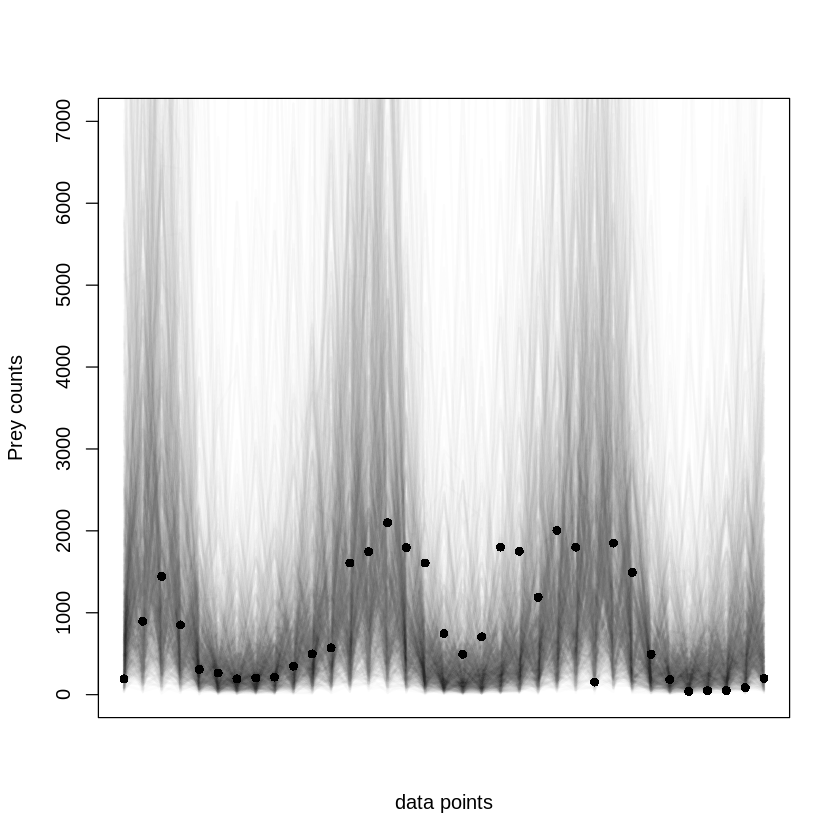

In [34]:
post <- data.frame(data_matrix)

pelts <- Mites[,3:2]


plot( 1:N , pelts[,2] , pch=16 , ylim=c(0,7000) , xlab="data points" , 
     ylab="Prey counts" , xaxt="n" )
# at <- c(1,11,21)
# axis( 1 , at=at , labels=Mites$time[at] )
# points( 1:N , pelts[,1] , col=rangi2 , pch=16 )

# 30 time series from posterior
for ( s in 1:1000 ) {
    lines( 1:35 , post[s,36:70] , col=col.alpha("black",0.01) , lwd=2 )
#     lines( 1:35 , post[s,1:35] , col=col.alpha(rangi2,0.01) , lwd=2 )

}

# # text labels
# text( 17 , 90 , "Prey" , pos=2 )
# text( 19 , 50 , "Predator" , pos=2 , col=rangi2 )